# Main code

In [47]:
import os
import numpy as np
import scipy.io
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, r2_score
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from IPython.display import clear_output
import random
import sys

[sklearn.linear_model.LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)

[sklearn.linear_model.Ridge](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html#sklearn.linear_model.Ridge)

[sklearn.linear_model.ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html#sklearn.linear_model.ElasticNet)

[sklearn.linear_model.LogisticRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)

## Read and preprocess mat files

After reading and preprocessing the data in the next code chunk, the data from all cells is stored in a population dictionary. The dictionary's keys correspond to the cell names, and the values contain the data for each respective cell.

The values in the population dictionary are cell dictionaries with keys being `'axons'`, `'green_dFFMeanValues'`,and `'red_dFFMeanValues'`:

- The value of `'axons'`, e.g., `cell_data_dict['CL090_230515']['axons']` is a 1 dimensional numpy array, of which the length is the number of groups and the elements are 1 dimensional numpy arrays consisting of components belonging to the group.
- The value of `'green_dFFMeanValues'` is a 2 dimensional 3 by 49 numpy array (each cell has 3 rounds, and each round has 8 directions \* 2 time frequencies \* 3 space frequencies = 48 settings plus a extra period so in total there are 49 columns), of which the elements are still 2 dimensional numpy arrays with size being 10 by N (N is the number of components).
- The value of `'red_dFFMeanValues'` is similarly a 2 dimensional 3 by 49 numpy array, of which the elements are still 2 dimensional numpy arrays with size being 10 by 1 (only recording the data at the soma).

In [48]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

# Get a list of all the subdirectories: subfolders are viewed as cell names
cell_names = [f for f in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, f))]
# for cell in cell_names:
#     print(cell)

# Create a dictionary with default values
default_value = 0
cell_data_dict = {cell: default_value for cell in cell_names}
# print(cell_data_dict)

file_suffixes = ['green_Axon.mat', 'green_dFFMeanValues.mat', 'red_dFFMeanValues.mat']

for cell in cell_names:
    print(cell)
    file_names = [cell + suffix for suffix in file_suffixes]

    path_ = file_names[0] # green_Axon.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    axons = mat_data['Axons'] # array containing nested arrays/sub-arrays
    # Squeeze the outer array
    axons = np.squeeze(axons, axis=0)
    for i in range(len(axons)):
        # Squeeze the inner array and convert the data type to 'int'
        axons[i] = np.squeeze(axons[i].astype(int), axis=0)
    # final axons' length is the number of groups with
    # each elements being a nested array of components

    path_ = file_names[1] # green_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_green = mat_data['dFFMeanValues'] # 3 by 49

    path_ = file_names[2] # red_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_red = mat_data['dFFMeanValues'] # 3 by 49

    cell_data_dict[cell] = {'axons': axons,
                'green_dFFMeanValues': dFFMeanValues_green,
                'red_dFFMeanValues': dFFMeanValues_red}

# Print keys and types
for key, value in cell_data_dict.items():
    print("-- * * * * * --")
    print(key, type(value))
    for key_, value_ in value.items():
        print(key_, type(value_))
print("-- * * * * * --")

CL090_230515
CL090_230518
CL083_230413
CL075_230303
-- * * * * * --
CL090_230515 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --
CL090_230518 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --
CL083_230413 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --
CL075_230303 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --


In [49]:
# print to see data type and size
print(cell_data_dict['CL090_230515'].keys())
print(type(cell_data_dict['CL090_230515']['axons']))
print(cell_data_dict['CL090_230515']['axons'].shape)
print(cell_data_dict['CL090_230515']['axons'][1].shape)
print(cell_data_dict['CL090_230515']['axons'][1].dtype)
print("--------------------------------")
print(type(cell_data_dict['CL090_230515']['green_dFFMeanValues']))
print(cell_data_dict['CL090_230515']['green_dFFMeanValues'].shape)
print(type(cell_data_dict['CL090_230515']['green_dFFMeanValues'][1,1]))
print(cell_data_dict['CL090_230515']['green_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['green_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['green_dFFMeanValues'][0,1].dtype)
print("--------------------------------")
print(type(cell_data_dict['CL090_230515']['red_dFFMeanValues']))
print(cell_data_dict['CL090_230515']['red_dFFMeanValues'].shape)
print(type(cell_data_dict['CL090_230515']['red_dFFMeanValues'][1,1]))
print(cell_data_dict['CL090_230515']['red_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['red_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['red_dFFMeanValues'][0,1].dtype)

dict_keys(['axons', 'green_dFFMeanValues', 'red_dFFMeanValues'])
<class 'numpy.ndarray'>
(25,)
(19,)
int64
--------------------------------
<class 'numpy.ndarray'>
(3, 49)
<class 'numpy.ndarray'>
(10, 281)
(10, 155)
float64
--------------------------------
<class 'numpy.ndarray'>
(3, 49)
<class 'numpy.ndarray'>
(10, 1)
(10, 2)
float64


Note:

- Four cells: `'CL090_230515'`, `'CL090_230518'`, `'CL083_230413'`, `'CL075_230303'`.

- `'red_dFFMeanValues'` and `'green_dFFMeanValues'` have 49 columns,where the last column should be excluded. They are supposed to have 3 rows (3 rounds), but `'CL090_230518'` only has 2 rows.

- In `'CL083_230413'`, elements in `'red_dFFMeanValues'` have 2 columns (10 × 2， should be 10 × 1), so `'CL083_230413'` is not used.

## Fit data to model

### Functions

In [50]:
def plot_comparison(y_test, y_pred, subtitle = ''):
    # Sort y_pred and y_test based on y_test
    sorted_indices = np.argsort(y_test)
    sorted_y_pred = y_pred[sorted_indices]
    sorted_y_test = y_test[sorted_indices]
    # Plot sorted_y_pred and sorted_y_test
    plt.plot(sorted_y_pred, label='Sorted Predictions')
    plt.plot(sorted_y_test, label='Sorted Ground Truth')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparison of Sorted Predictions and Sorted Ground Truth \n ({subtitle})')
    plt.legend()
    plt.savefig(f'Comparison of Sorted Predictions and Sorted Ground Truth ({subtitle}).png', bbox_inches='tight')
    # bbox_inches='tight' will adjust the figure's bounding box to fit all the content, ensuring that
    # the complete words are visible in the saved figure. Otherwise, the saved figure may not show the
    # complete words, e.g., for x-label, or for the long title.
    # The default setting can sometimes result in cutoff or clipped text. It tries to include the entire
    # figure within the saved image, but there may be cases where the default behavior is not sufficient
    # to capture all the content. The default behavior assumes the figure content fits within the predefined
    # margins and padding.
    plt.show()

### Reorganize the data (vstack)

In [51]:
# cell_data = cell_data_dict['CL090_230515']
cell_data = cell_data_dict['CL075_230303']


data_green = cell_data['green_dFFMeanValues'][:,:-1] # exclude 49th column
data_red = cell_data['red_dFFMeanValues'][:,:-1] # exclude 49th column
data_axons = cell_data['axons']

# vstack green data
stacked_green = np.empty((0, data_green[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_green):
    stacked_green = np.vstack((stacked_green, value))
print(stacked_green.shape, 48*3*10)

# group columns of green data
group_num = data_axons.shape[0]
group_satcked_green = np.zeros((stacked_green.shape[0], group_num))
for i, cols in enumerate(data_axons):
    group_satcked_green[:, i] = np.sum(stacked_green[:, cols-1], axis=1)
print(group_satcked_green.shape, data_axons.shape)

# vstack red data
stacked_red = np.empty((0, data_red[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_red):
    stacked_red = np.vstack((stacked_red, value))
print(stacked_red.shape, 48*3*10)

print(np.max(group_satcked_green), np.min(group_satcked_green))
print(np.max(stacked_red), np.min(stacked_red))

(1440, 80) 1440
(1440, 14) (14,)
(1440, 1) 1440
27.44283678657392 -9.505092954427656
0.4404603811981394 -0.20703030293882338


### Linear regression

#### Divide train and val datasets

In [52]:
# independent data
x = group_satcked_green

# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (1368, 14)
y_train shape: (1368,)
x_test shape: (72, 14)
y_test shape: (72,)


#### Ordinary linear regression

Ordinary least squares Linear Regression.

Linear Regression fits a linear model with coefficients to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation.

##### Fit and predict

In [53]:
# Create a LinearRegression object
model = linear_model.LinearRegression()

# Fit the model on the training data
model.fit(x_train, y_train)
# Print the fitted coefficients
print("Fitted Coefficients:", model.coef_)
# Print the fitted intercept
print("Fitted Intercept:", model.intercept_)

# Predict on the test data
y_pred = model.predict(x_test)

Fitted Coefficients: [ 0.18238332  0.02531578 -0.00635457  0.00804224  0.05353301  0.03116835
  0.0537527  -0.02884246  0.15593078 -0.02222356 -0.35561745 -0.00680714
  0.00230719  0.13282755]
Fitted Intercept: 0.021653732432704836


##### Evaluate

In [54]:
mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

Mean squared error: 0.0019353809880106538
Correlation coefficient: 0.6012948658925962
Coefficient of determination (R-squared score, R2 score): 0.35909155398992


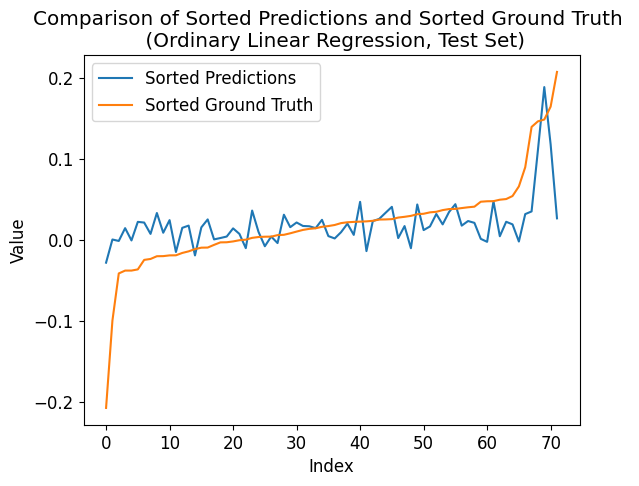

In [55]:
plot_comparison(y_test, y_pred, 'Ordinary Linear Regression, Test Set')

In [56]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

Mean squared error: 0.001430949267355517
Correlation coefficient: 0.602014551907171
Coefficient of determination (R-squared score, R2 score): 0.36242152070799216


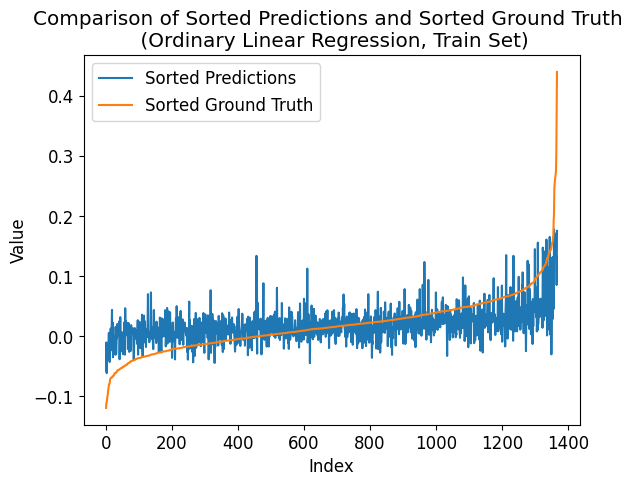

In [57]:
plot_comparison(y_train, y_pred_, 'Ordinary Linear Regression, Train Set')

In [58]:
# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
Mean squared error: 1.375
Correlation coefficient: 0.5122173056905833
Coefficient of determination (R-squared score, R2 score): 0.26050420168067223
Mean squared error: 0.9992690058479532
Correlation coefficient: 0.5523810897035312
Coefficient of determination (R-squared score, R2 score): 0.29920737856320834


#### Ridge linear regression

Linear least squares with l2 regularization.

Minimizes the objective function:

$$
||y - Xw||^2_2 + \alpha  ||w||^2_2
$$

This model solves a regression model where the loss function is the linear least squares function and regularization is given by the l2-norm.

##### Fit and predict

In [59]:
# Create a Ridge Regression object
ridge_model = linear_model.Ridge(alpha=1.0)  # You can adjust the value of alpha as per your requirements

# Fit the model on the training data
ridge_model.fit(x_train, y_train)

# Print the fitted coefficients
print("Fitted Coefficients:", ridge_model.coef_)

# Print the fitted intercept
print("Fitted Intercept:", ridge_model.intercept_)

# Predict on the test data
y_pred = ridge_model.predict(x_test)

Fitted Coefficients: [ 0.09292852  0.02632221 -0.00377484  0.00723589  0.05272006  0.02001626
  0.01107838 -0.02904252  0.07077848  0.02445001 -0.0740123  -0.00528285
  0.00239613  0.0037084 ]
Fitted Intercept: 0.021077756347462166


##### Evaluate

Mean squared error: 0.0019590833656456547
Correlation coefficient: 0.5932188323094388
Coefficient of determination (R-squared score, R2 score): 0.3512424255181108


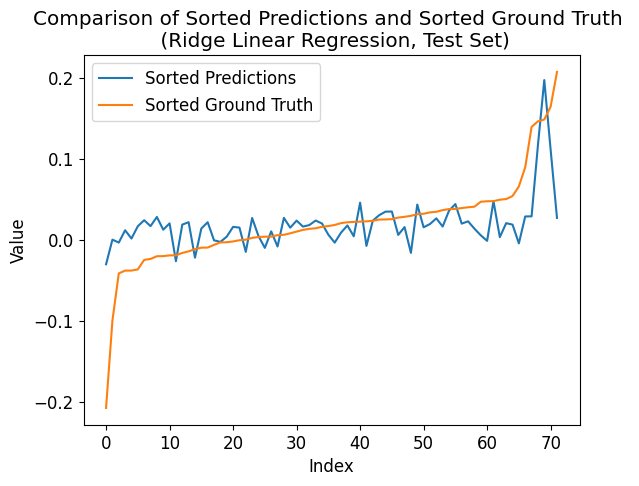

In [60]:
mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Ridge Linear Regression, Test Set')

Mean squared error: 0.0014567165980582566
Correlation coefficient: 0.5925651096246126
Coefficient of determination (R-squared score, R2 score): 0.35094054377913975


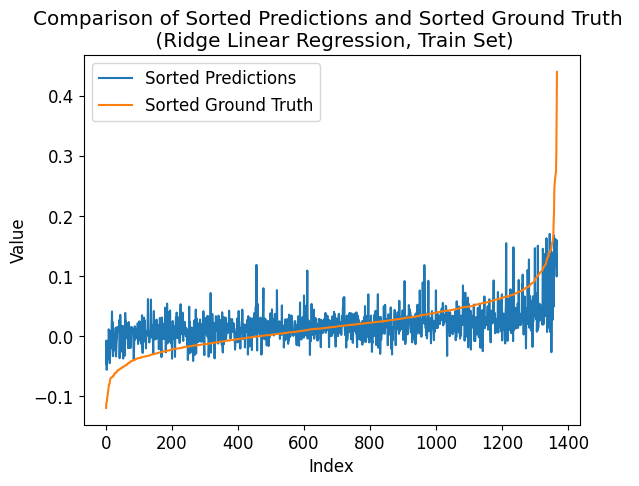

In [61]:
# predict on train
# Use the trained model to make predictions
y_pred_ = ridge_model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Ridge Linear Regression, Train Set')

In [62]:
# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
Mean squared error: 1.375
Correlation coefficient: 0.5131657340158112
Coefficient of determination (R-squared score, R2 score): 0.26050420168067223
Mean squared error: 1.0336257309941521
Correlation coefficient: 0.5293271977916442
Coefficient of determination (R-squared score, R2 score): 0.27511282610707866


#### ElasticNet linear regression

Linear regression with combined L1 and L2 priors as regularizer.

Minimizes the objective function:

$$
1 / (2 * n_{samples}) * ||y - Xw||^2_2
+ \alpha * l1_{ratio} * ||w||_1
+ 0.5 * \alpha * (1 - l1_{ratio}) * ||w||^2_2
$$

If controlling the L1 and L2 penalty separately, that this is equivalent to:

$$
a * ||w||_1 + 0.5 * b * ||w||_2^2
$$

where: $\alpha = a + b$ and $l1_{ratio} = a / (a + b)$.

##### Fit and predict

In [63]:
# Create an ElasticNet object
a = 0.004; b = 0.00
alpha = a + b; l1_ratio = a / (a + b)
elasticnet_model = linear_model.ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_iter=100000)
# adjust the values of alpha and l1_ratio as per your requirements

# Fit the model on the training data
elasticnet_model.fit(x_train, y_train)

# Print the fitted coefficients
print("Fitted Coefficients:", elasticnet_model.coef_)

# Print the fitted intercept
print("Fitted Intercept:", elasticnet_model.intercept_)

# Predict on the test data
y_pred = elasticnet_model.predict(x_test)

# It is normal to encounter warning here, because our data is not linear enough
# and not normailized to guarantee a low error/residual, even though we set a very
# large max_iter. But the results is similar to that of ordinary and Ridge linear
# regression. Like alpha = 0 results in the same results as the ordinary linear
# rergession.

Fitted Coefficients: [ 0.          0.0086643   0.          0.          0.          0.
  0.         -0.          0.          0.          0.          0.0015826
  0.00470322  0.        ]
Fitted Intercept: 0.022844042914220195


##### Evaluate

Mean squared error: 0.002002060573994312
Correlation coefficient: 0.6136636898586912
Coefficient of determination (R-squared score, R2 score): 0.3370103668241261


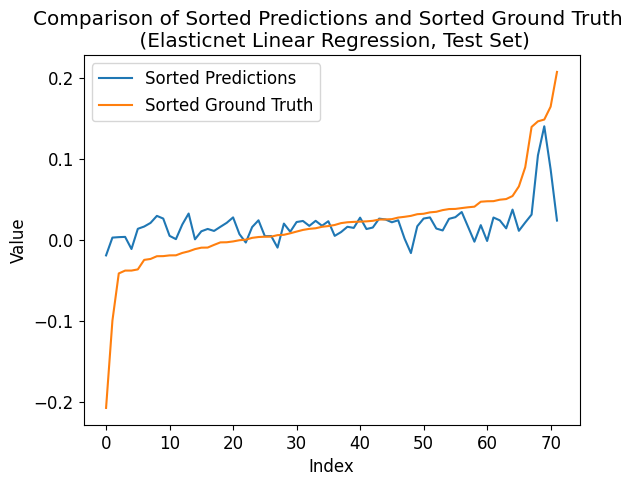

In [64]:
mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Elasticnet Linear Regression, Test Set')

Mean squared error: 0.00169819965499813
Correlation coefficient: 0.4970718988854777
Coefficient of determination (R-squared score, R2 score): 0.24334455576550063


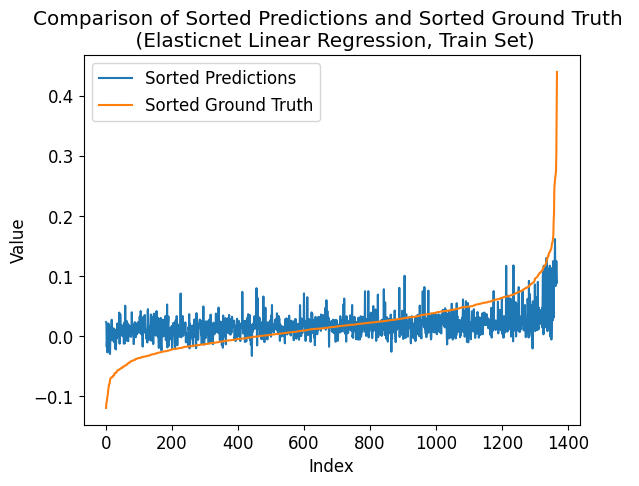

In [65]:
# predict on train
# Use the trained model to make predictions
y_pred_ = elasticnet_model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Elasticnet Linear Regression, Train Set')

In [66]:
# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
Mean squared error: 1.3472222222222223
Correlation coefficient: 0.5463431384225381
Coefficient of determination (R-squared score, R2 score): 0.2754435107376284
Mean squared error: 1.1359649122807018
Correlation coefficient: 0.4511357285754583
Coefficient of determination (R-squared score, R2 score): 0.20334181879094793


### Power-law regression

Mathematically, a power-law relationship can be expressed as:

$$
y = A  X^C
$$

Here, I modify it, shown as:

$$
y = A  (X+B)^C + D
$$

where, $X = \beta_1 x_1 + \beta_2 x_2 \dots + \beta_N x_N$. $X+D$ is a linear regression part. $A$, $B$, $C$, $D$, $\beta_1$, $\beta_2$, ...,$\beta_N$ are parameters to be determined.

#### Divide train and val datasets

In [67]:
# independent data
x = group_satcked_green

# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (1368, 14)
y_train shape: (1368,)
x_test shape: (72, 14)
y_test shape: (72,)


#### Fit, predict and evaluate (Example 1)

Fitted Parameters: [ 4.80045085e+00  4.59786665e-01 -8.06259505e-02  1.62406349e-01
  2.05395713e-02 -6.46997979e-03  8.02623158e-03  4.71472789e-02
  1.41261022e-02  6.84355253e-02 -1.31444397e-02  1.25152014e-01
 -2.88069940e-02 -3.41807808e-01 -5.43015976e-03  2.17289817e-03
  1.07978918e-01]
Mean squared error: 0.002115206617715441
Correlation coefficient: 0.5535858181781245
Coefficient of determination (R-squared score, R2 score): 0.2995416433517336


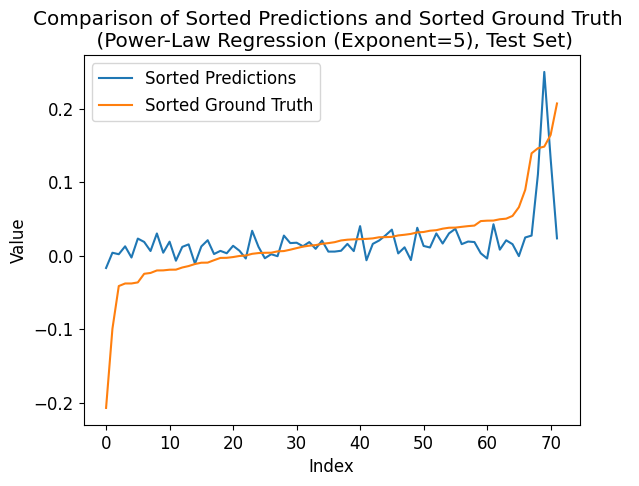

Mean squared error: 0.0014046095993702319
Correlation coefficient: 0.6116841603489208
Coefficient of determination (R-squared score, R2 score): 0.3741575101258072


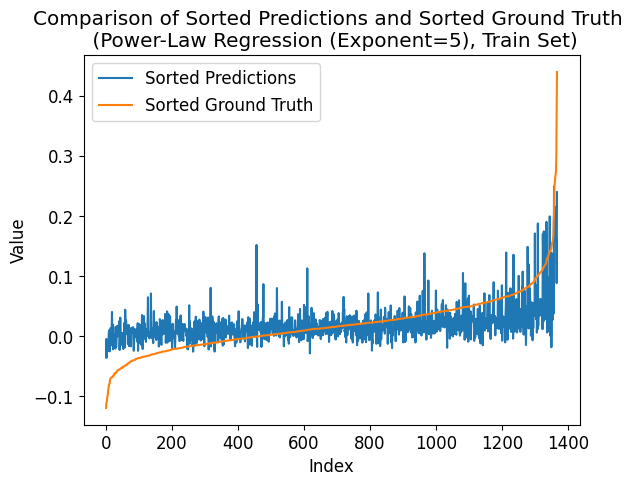

---- ---- ----
Mean squared error: 1.4305555555555556
Correlation coefficient: 0.5025479155614934
Coefficient of determination (R-squared score, R2 score): 0.23062558356676
Mean squared error: 0.9685672514619883
Correlation coefficient: 0.5699760409688358
Coefficient of determination (R-squared score, R2 score): 0.32073868075804757


In [68]:
exponent = 5
# Define the model function
def func(X, *params):
    A, B, D = params[:3]
    # Compute the weighted sum
    weighted_sum = np.sum(X * np.array(params[3:]), axis=1)
    base = weighted_sum + B
    power_result = np.power(base, exponent)
    return A * power_result + D

# Create a LinearRegression object
model = linear_model.LinearRegression()

# give the initial params using linear regression
# so that the params are within a reasonable range
model.fit(x_train, y_train)
# print("Fitted Coefficients:", model.coef_)
# print("Fitted Intercept:", model.intercept_)
num_features = x_train.shape[1]
# Assuming model.coef_ is the np array containing the coefficients
model_coefs = model.coef_
# Set negative elements to 0 using np.clip()
initial_params = [1, model.intercept_, 0] + list(model_coefs) # Initial parameter guesses
# model_coefs_clipped = np.clip(model_coefs, 0, np.inf)
# initial_params = [1, model.intercept_, 0] + list(model_coefs_clipped) # Initial parameter guesses, no need to clip -- they can be negative

# Set lower and upper bounds for the parameters
lower_bounds = [0, -np.inf, -np.inf] + [0] * num_features
upper_bounds = [np.inf, np.inf, np.inf] + [np.inf] * num_features

# Combine the lower and upper bounds into a 2-tuple of array_like
bounds = (lower_bounds, upper_bounds)

# Perform the curve fit with bounds
params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)
# params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, bounds=bounds, maxfev=1000000)

# Print the fitted parameters
print("Fitted Parameters:", params)

# predict on test
A, B, D = params[:3]
weighted_sum = np.sum(x_test * np.array(params[3:]), axis=1)
base = weighted_sum + B
abs_base = np.abs(base)
sign = np.sign(base)
power_result = np.power(abs_base, exponent)
y_pred = A * sign * power_result + D

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Power-Law Regression (Exponent=5), Test Set')


# predict on train
A, B, D = params[:3]
weighted_sum = np.sum(x_train * np.array(params[3:]), axis=1)
base = weighted_sum + B
abs_base = np.abs(base)
sign = np.sign(base)
power_result = np.power(abs_base, exponent)
y_pred_ = A * sign * power_result + D

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Power-Law Regression (Exponent=5), Train Set')

# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

#### Fit, predict and evaluate (Example 2)

Fitted Coefficients: [ 0.18238332  0.02531578 -0.00635457  0.00804224  0.05353301  0.03116835
  0.0537527  -0.02884246  0.15593078 -0.02222356 -0.35561745 -0.00680714
  0.00230719  0.13282755]
Fitted Intercept: 0.021653732432704836
Fitted Parameters: [3.72739959e+03 1.69773472e-02]
Mean squared error: 0.004292115813928243
Correlation coefficient: 0.31133355789287526
Coefficient of determination (R-squared score, R2 score): -0.4213497463502507


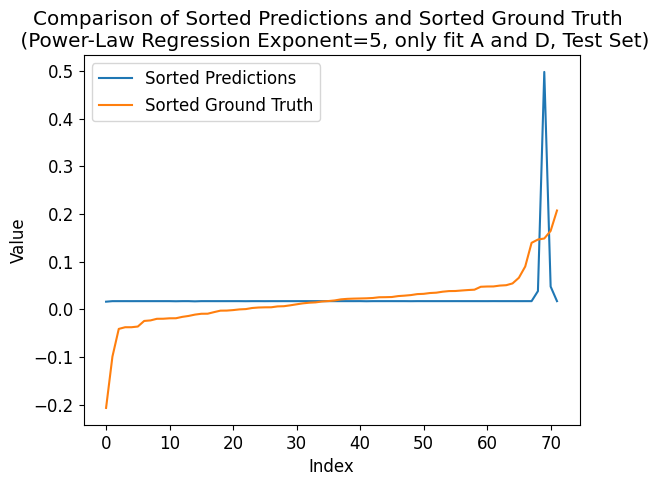

Mean squared error: 0.001824109788677633
Correlation coefficient: 0.43271655960841493
Coefficient of determination (R-squared score, R2 score): 0.187243620959343


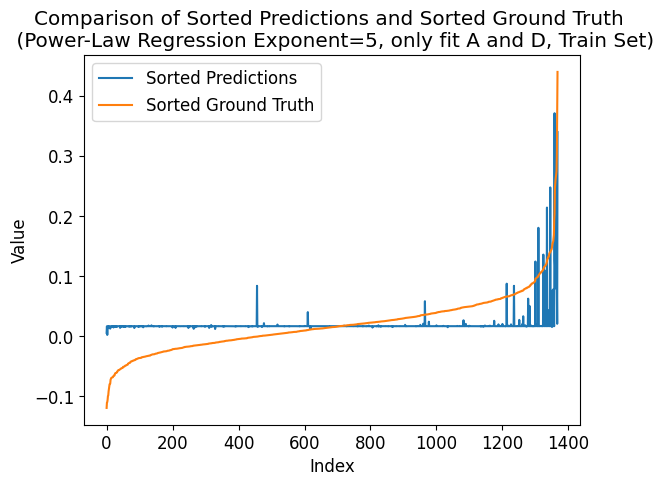

In [69]:
# compared with example 1, here only fit A and D.

exponent = 5

model = linear_model.LinearRegression()
model.fit(x_train, y_train)
# now we have: model.intercept_ and model.coef_
# Print the fitted coefficients
print("Fitted Coefficients:", model.coef_)
# Print the fitted intercept
print("Fitted Intercept:", model.intercept_)

# Define the model function
def func(X, A, D):
    # Compute the weighted sum
    weighted_sum = np.sum(X * np.array(model.coef_), axis=1)
    base = weighted_sum
    power_result = np.power(base, exponent)
    return A * power_result + D

initial_params = [1, 0]

# Perform the curve fit
params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)

# Print the fitted parameters
print("Fitted Parameters:", params)


# predict on test
A, D = params
y_pred = func(x_test, A, D)

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Power-Law Regression Exponent=5, only fit A and D, Test Set')

# predict on train
A, D = params
y_pred_ = func(x_train, A, D)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Power-Law Regression Exponent=5, only fit A and D, Train Set')

#### Fit and predict

115/73
225/97
233/35


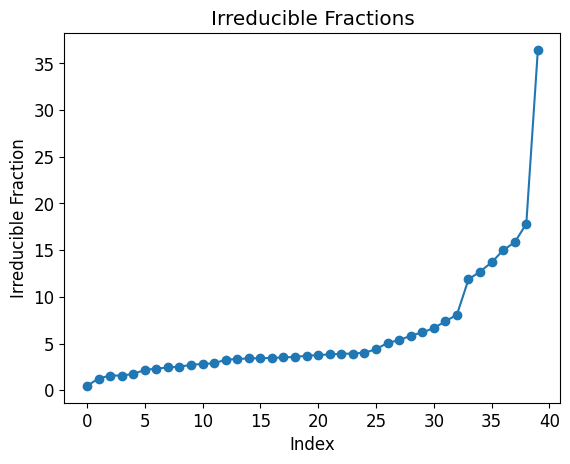

In [70]:
# generate irreducible fraction with an odd number as the denominator
# such numbers can work as the exponent for negative numbers and
# will be used as the parameter "C" in Power-law regression below:
# y = A * (B+b1*x1+b2*x2+...+bN*xN)**C + D

def gcd(a, b): # calculate the greatest common divisor of two numbers
    while b:
        a, b = b, a % b
    return a

def generate_irreducible_fraction(existing_fractions = []):
    while True:
        numerator = random.randint(1, 400)  # Random numerator
        denominator = random.randrange(1, 100, 2)  # Random odd denominator
        if gcd(numerator, denominator) == 1:  # Check if the fraction is irreducible
            fraction = (numerator, denominator)
            if fraction not in existing_fractions:  # Check if the fraction is not a duplicate
                return fraction

# Generate irreducible fraction numbers
N_faction = 40
upper_bound = 50
irreducible_fractions = []
while len(irreducible_fractions) < N_faction:
    fraction = generate_irreducible_fraction(irreducible_fractions)
    if fraction[0]/fraction[1] < upper_bound:
        irreducible_fractions.append(fraction)

# Sort the irreducible fractions
irreducible_fractions.sort(key=lambda f: f[0] / f[1])

# Print the irreducible fraction numbers
for numerator, denominator in irreducible_fractions:
    if random.random() <= 0.1:
        print(f"{numerator}/{denominator}")


# Extract the numerator and denominator values
indexes = range(1, len(irreducible_fractions) + 1)
values = [numerator / denominator for numerator, denominator in irreducible_fractions]

# Plot the irreducible fractions
plt.plot(values, 'o-')
plt.xlabel("Index")
plt.ylabel("Irreducible Fraction")
plt.title("Irreducible Fractions")
plt.show()

## if not use the above random generated irreducible_fractions, define it below.
irreducible_fractions = [(1,95), (30,43), (179,65), (5,1), (221,33), (219,23), (300,17), (73,3)]

In [71]:
# # old code! The new one is in the next chunk.

# params_list = []
# for numerator, denominator in irreducible_fractions:
#     C1, C2 = numerator, denominator

#     # Define the model function
#     def func(X, *params):
#         A, B, D = params[:3]
#         # Compute the weighted sum
#         weighted_sum = np.sum(X * np.array(params[3:]), axis=1)
#         base = weighted_sum + B
#         abs_base = np.abs(base)
#         sign = np.sign(base)
#         power_result = np.power(abs_base, C1 / C2)
#         return A * sign * power_result + D

#     # Create a LinearRegression object
#     model = linear_model.LinearRegression()

#     # give the initial params using linear regression
#     # so that the params are within a reasonable range
#     model.fit(x_train, y_train)
#     # print("Fitted Coefficients:", model.coef_)
#     # print("Fitted Intercept:", model.intercept_)
#     num_features = x_train.shape[1]
#     initial_params = [1, model.intercept_, 0] + list(model.coef_) # Initial parameter guesses

#     # Perform the curve fit
#     params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)
#     params_list.append(params)

#     # Print the fitted parameters
#     # print("Fitted Parameters:", params)

# # predict on test
# y_predict_test_list = []
# for (numerator, denominator), params in zip(irreducible_fractions, params_list):
#     C1, C2 = numerator, denominator
#     A, B, D = params[:3]
#     weighted_sum = np.sum(x_test * np.array(params[3:]), axis=1)
#     base = weighted_sum + B
#     abs_base = np.abs(base)
#     sign = np.sign(base)
#     power_result = np.power(abs_base, C1 / C2)
#     y_pred = A * sign * power_result + D
#     y_predict_test_list.append(y_pred)

# # predict on train
# y_predict_train_list = []
# for (numerator, denominator), params in zip(irreducible_fractions, params_list):
#     C1, C2 = numerator, denominator
#     A, B, D = params[:3]
#     weighted_sum = np.sum(x_train * np.array(params[3:]), axis=1)
#     base = weighted_sum + B
#     abs_base = np.abs(base)
#     sign = np.sign(base)
#     power_result = np.power(abs_base, C1 / C2)
#     y_pred_ = A * sign * power_result + D
#     y_predict_train_list.append(y_pred_)

In [72]:
# new code, a updated version for the code in last chunk.
# input and output data normalization is achieved (but it
# seems normalization is redundant).

class CurveFit_with_Normalization:
    def __init__(self, exponent_numerator=1, exponent_denominator=1, input_range=[1,2], output_range=[1,2]):
        self.input_min = input_range[0]
        self.input_max = input_range[1]
        self.output_min = output_range[0]
        self.output_max = output_range[1]
        self.input_scale = None
        self.input_shift = None
        self.output_scale = None
        self.output_shift = None
        self.exponent_numerator = exponent_numerator
        self.exponent_denominator = exponent_denominator
        self.linear_model = linear_model.LinearRegression()

    def fit(self, X, y):
        # Normalize the input and output data
        self.input_scale = (self.input_max - self.input_min) / (np.max(X) - np.min(X))
        self.input_shift = self.input_min - np.min(X) * self.input_scale
        normalized_X = self.input_scale * X + self.input_shift

        self.output_scale = (self.output_max - self.output_min) / (np.max(y) - np.min(y))
        self.output_shift = self.output_min - np.min(y) * self.output_scale
        normalized_y = self.output_scale * y + self.output_shift

        def normalized_func_(X_normalize, *params):
            A, B, D = params[:3]
            # Compute the weighted sum
            weighted_sum = np.sum(X_normalize * np.array(params[3:]), axis=1)
            base = weighted_sum + B
            abs_base = np.abs(base)
            sign = np.sign(base)
            power_result = np.power(abs_base, self.exponent_numerator / self.exponent_denominator)
            return A * sign * power_result + D

        # Give the initial params using linear regression
        self.linear_model.fit(normalized_X, normalized_y)
        # print("Fitted Coefficients:", linear_model.coef_)
        # print("Fitted Intercept:", linear_model.intercept_)
        # num_features = X.shape[1]
        exponent = self.exponent_numerator / self.exponent_denominator
        initial_params = [1, self.linear_model.intercept_ / exponent + (1 - 1 / exponent), 0] + list(self.linear_model.coef_ /
                        exponent)  # Initial parameter guesses
        # initial_params = [1, 0, 0] + [1 / X.shape[1]] * (X.shape[1])

        # Perform the normalized curve fit
        normalized_params, params_covariance = curve_fit(normalized_func_, normalized_X, normalized_y,
                                  p0=initial_params, maxfev=100000000)

        # Store the fitted parameters
        self.normalized_fitted_params = normalized_params

    def predict(self, X):
        # Normalize the input data using the previously calculated scaling and shifting parameters
        normalized_X = self.input_scale * X + self.input_shift

        # Make predictions using the denormalized parameters
        y_pred = self.normalized_func(normalized_X, self.exponent_numerator,
                              self.exponent_denominator, *self.normalized_fitted_params)

        # Denormalize the predicted output
        y_pred = (y_pred - self.output_shift) / self.output_scale

        return y_pred

    @staticmethod
    def normalized_func(X_normalize, exponent_numerator, exponent_denominator, *params):
        A, B, D = params[:3]
        # Compute the weighted sum
        weighted_sum = np.sum(X_normalize * np.array(params[3:]), axis=1)
        base = weighted_sum + B
        abs_base = np.abs(base)
        sign = np.sign(base)
        power_result = np.power(abs_base, exponent_numerator / exponent_denominator)
        return A * sign * power_result + D

model_list = []
for numerator, denominator in irreducible_fractions:
    # Create an instance of NormalizedCurveFit
    model = CurveFit_with_Normalization(numerator, denominator, input_range=[1, 2], output_range=[1, 2])

    # Fit the model to your input and output data
    model.fit(x_train, y_train)

    model_list.append(model)


-------- 
 (numerator, denominator) is: (1, 95)
Mean squared error: 0.001933283143492199
Correlation coefficient: 0.6021425216341963
Coefficient of determination (R-squared score, R2 score): 0.35978626282431625
-------- 
 (numerator, denominator) is: (30, 43)
Mean squared error: 0.0019349673229873147
Correlation coefficient: 0.6014597690280606
Coefficient of determination (R-squared score, R2 score): 0.35922854066537
-------- 
 (numerator, denominator) is: (179, 65)
Mean squared error: 0.002094368391858342
Correlation coefficient: 0.55806049241315
Coefficient of determination (R-squared score, R2 score): 0.3064422975559521
-------- 
 (numerator, denominator) is: (5, 1)
Mean squared error: 0.0021149947453885745
Correlation coefficient: 0.5536322377699431
Coefficient of determination (R-squared score, R2 score): 0.2996118056425723
-------- 
 (numerator, denominator) is: (221, 33)
Mean squared error: 0.0021206940775998205
Correlation coefficient: 0.5524436522501386
Coefficient of determin

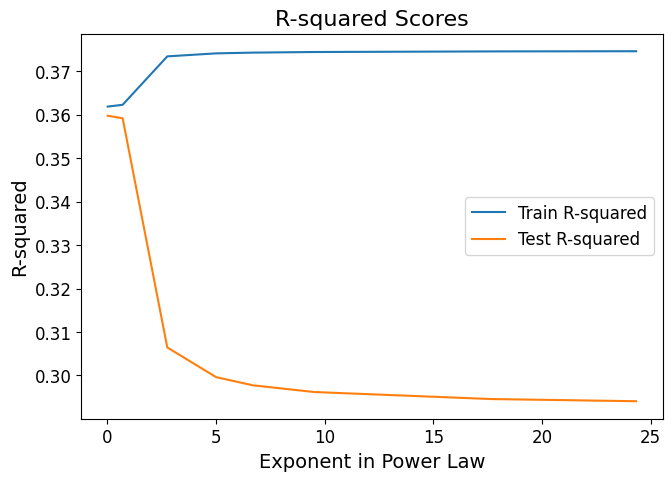

In [73]:
# this is for the new version code in the last chunk

r2_score_test_list = []

# predict on test
y_predict_test_list = []
for model, (numerator, denominator) in zip(model_list, irreducible_fractions):
    y_pred = model.predict(x_test)

    print(f'-------- \n (numerator, denominator) is: ({numerator}, {denominator})')

    mse = mean_squared_error(y_test, y_pred)
    print("Mean squared error:", mse)

    correlation = np.corrcoef(y_pred, y_test)[0, 1]
    print("Correlation coefficient:", correlation)

    r_squared = r2_score(y_test, y_pred)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)

    r2_score_test_list.append(r_squared)

    y_predict_test_list.append(y_pred)

print("|||||||||||||||||||||||||||||||||||||")

r2_score_train_list = []

# predict on train
y_predict_train_list = []
for model, (numerator, denominator) in zip(model_list, irreducible_fractions):
    y_pred_ = model.predict(x_train)

    print(f'-------- \n (numerator, denominator) is: ({numerator}, {denominator})')

    mse = mean_squared_error(y_train, y_pred_)
    print("Mean squared error:", mse)

    # Calculate the correlation coefficient
    correlation = np.corrcoef(y_pred_, y_train)[0, 1]
    print("Correlation coefficient:", correlation)

    r_squared = r2_score(y_train, y_pred_)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)

    r2_score_train_list.append(r_squared)

    y_predict_train_list.append(y_pred_)


x = [numerator / denominator for (numerator, denominator) in irreducible_fractions]



# plot the r2 score curve over exponent
fig, ax = plt.subplots(figsize=(7.5, 5))  # Adjust the values as desired

# Plot the R-squared scores
ax.plot(x, r2_score_train_list, label='Train R-squared')
ax.plot(x, r2_score_test_list, label='Test R-squared')

# Set labels and title with font size
ax.set_xlabel('Exponent in Power Law', fontsize=14)
ax.set_ylabel('R-squared', fontsize=14)
ax.set_title('R-squared Scores', fontsize=16)

# Set tick label font size
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

# Set legend
ax.legend(fontsize=12)

fig.savefig('Power_Law_r2_scores_plot.png')

# Display the plot
plt.show()

In [74]:
# for model in model_list:
#     print(model.exponent_numerator, model.exponent_denominator)

#### Evaluate

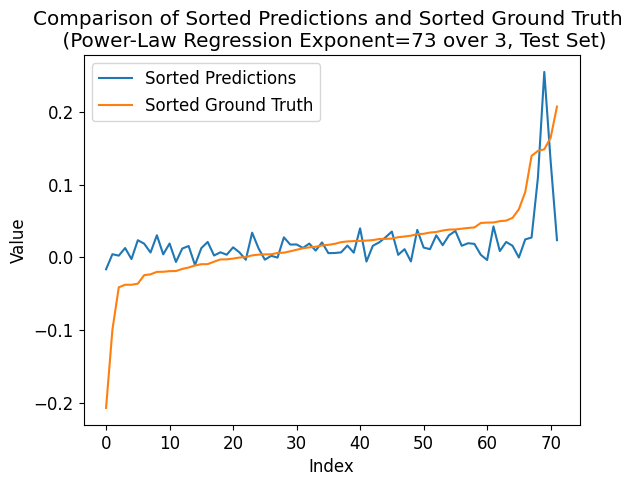

-0.0034288996429232


In [75]:
# both the old and new versions (in the last subsection "Fit and predict") of code
# share the same evaluate code in this subsectoon.

# Create and update multiple figures (test)
for y_pred, (numerator, denominator) in zip(y_predict_test_list, irreducible_fractions):
    plot_comparison(y_test, y_pred, f'Power-Law Regression Exponent={numerator} over {denominator}, Test Set')
    # here pay attention: cannot use / replace over in the name, otherwise cannot save the fig
    # because / cannot be in a file name.
    print(y_pred[0])
    clear_output(wait=True)  # Clear the previous output

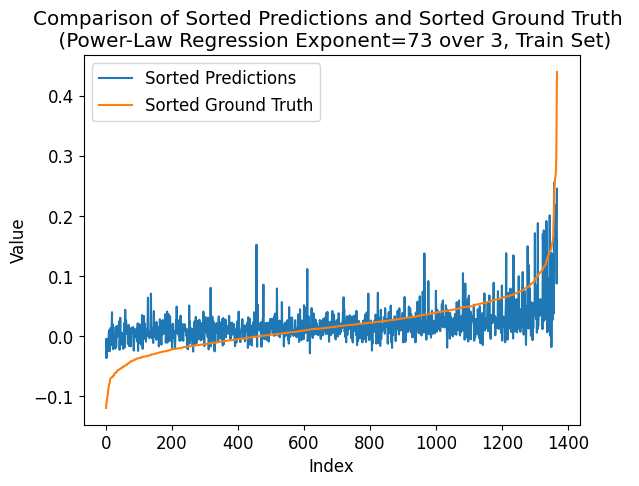

0.007488538817954552


In [76]:
# Create and update multiple figures (train)
for y_pred_, (numerator, denominator) in zip(y_predict_train_list, irreducible_fractions):
    plot_comparison(y_train, y_pred_, f'Power-Law Regression Exponent={numerator} over {denominator}, Train Set')
    print(y_pred_[0])
    clear_output(wait=True)  # Clear the previous output

### Exponential regression

Let $B = (b_1, b_2, \ldots , b_N)$.
$$
y = A \cdot e^{(b_1 \cdot x_1 + \ldots + b_N \cdot x_N)} + C
$$

#### Divide train and val datasets

In [77]:
# independent data
x = group_satcked_green

# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (1368, 14)
y_train shape: (1368,)
x_test shape: (72, 14)
y_test shape: (72,)


#### Fit and predict

In [78]:
# Define the model function
def func(X, *params):
    A, C = params[:2]
    return A * np.exp(np.sum(X * np.array(params[2:]), axis=1)) + C

# give the initial params using linear regression
# so that the params are within a reasonable range
num_features = x_train.shape[1]
initial_params = [np.mean(y_train), 0] + [0] * num_features # Initial parameter guesses

# Perform the curve fit
params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)

# Print the fitted parameters
print("Fitted Parameters:", params)

# predict on test
A, C = params[:2]
y_pred = A * np.exp(np.sum(x_test * np.array(params[2:]), axis=1)) + C

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

# predict on train
A, C = params[:2]
y_pred_ = A * np.exp(np.sum(x_train * np.array(params[2:]), axis=1)) + C

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

r2_score_train_list.append(r_squared)

# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

Fitted Parameters: [ 0.1231451  -0.10520813  1.40826714  0.17547963 -0.05617049  0.06929655
  0.40501096  0.11387686  0.59424565 -0.10835117  1.07134255 -0.25469261
 -2.97378161 -0.04621807  0.01919921  0.93342524]
Mean squared error: 0.0021358732783242265
Correlation coefficient: 0.5493376423946233
Coefficient of determination (R-squared score, R2 score): 0.29269780360284303
Mean squared error: 0.0014032585370487949
Correlation coefficient: 0.6121760318027599
Coefficient of determination (R-squared score, R2 score): 0.37475949391375973
---- ---- ----
[-0.00334645 -0.00376563  0.0160857   0.0127042   0.01246067  0.03020036
  0.02106777  0.04228009  0.00669212  0.01582696  0.00589754  0.02738642
  0.10935512  0.03017949  0.01930066  0.01370376  0.02346596 -0.00584292
  0.02715794 -0.0164255   0.03967245  0.01107316  0.01753134  0.0040122
  0.01261146  0.25587977  0.0183818   0.00910601  0.01889986 -0.00634774
  0.01761428  0.02734232 -0.01057383  0.0069221   0.01866984  0.0022946
  0.01

#### Evaluate

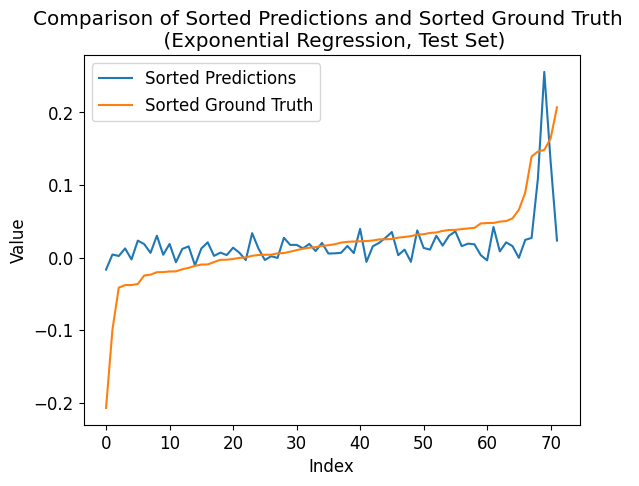

In [79]:
plot_comparison(y_test, y_pred, 'Exponential Regression, Test Set')

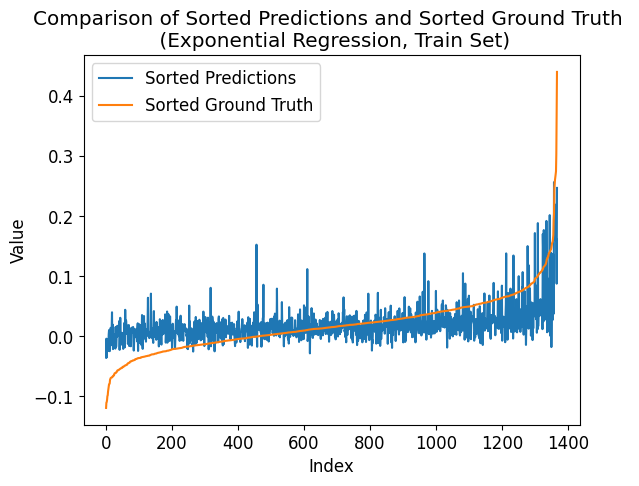

In [80]:
plot_comparison(y_train, y_pred_, 'Exponential Regression, Train Set')

### Logistic regression

#### Divide train and val datasets

In [81]:
# independent data
x = group_satcked_green

class_num = 480

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))


x_train shape: (1368, 14)
y_train shape: (1368,)
x_test shape: (72, 14)
y_test shape: (72,)
Unique elements: [ 65  71  72  75  79  80  85  88  91  94  95  99 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214
 215 216 217 218 219 220 221 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 238 239 240 241 242 244 245 248 250 252 255 256 257 259 260
 262 265 268 269 270 274 278 297 304 335 341 346 350 353 357 378 429 479]
Number of unique elements: 180


#### Fit and predict

'multinomial' (default option for multi-calss) achieves better performance than 'ovr'.

In [82]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
# model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='ovr')

fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)
print("Coefficients:", model.coef_[0,:])
print("Intercept:", model.intercept_[0])
print('--- --- ---')

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)

print('y_prob.shape:', y_prob.shape)
print(np.sum(y_prob, axis = 1))
print(y_prob[0,:])

# Print the predicted class labels
print('y_pred:', y_pred)
print('y_test:', y_test)
print('y_pred shape:', y_pred.shape, 'y_test shape:', y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(180,) (180, 14)
Coefficients: [ 4.43680280e-02 -7.55510583e-01 -1.93072516e-02 -2.76094341e-01
 -2.08512610e-01 -9.01074611e-02  4.24861746e-02  1.20366864e-01
  2.62561830e-02  3.60771444e-04  5.77757233e-02  8.65279651e-01
 -7.96485984e-01  2.98289464e-02]
Intercept: -5.4138964247043955
--- --- ---
y_prob.shape: (72, 180)
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
[1.17412811e-05 5.56279889e-04 1.82831629e-03 2.07374948e-03
 4.17092539e-04 1.68092643e-03 1.37897011e-03 5.13861379e-04
 7.97788741e-04 1.81622565e-03 4.13082691e-04 4.47270129e-05
 6.41850578e-04 6.00463831e-03 1.53739569e-03 1.79432550e-03
 6.58739478e-03 1.22450615e-03 2.63219695e-04 4.94282540e-03
 2.71103572e-03 2.36465338e-04 3.58918403e-03 2.64174438e-03
 1.68242547e-03 6.24920069e-03 4.95190281e-03 4.82077291e-03
 2.96339183e-03 1.31487630

#### Evaluate

##### Evaluate (normal)

In previous data division, I classify data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results with the same number of classes (e.g., class_num = 160).

Accuracy: 0.0
Confusion Matrix:
[[0 0 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Mean squared error: 1376.4444444444443
Correlation coefficient: 0.4994740362981341
Coefficient of determination (R-squared score, R2 score): 0.16921003739870966


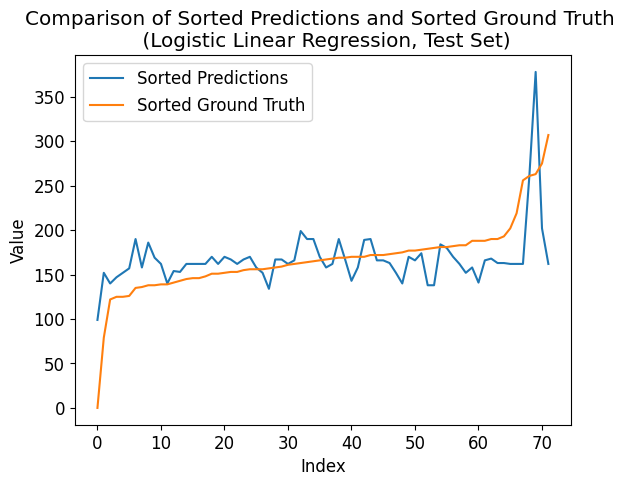

In [83]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:") # y_test doesn't include all classes, so confusion matrix is less than num_class by num_class
print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)


# Sort y_pred and y_test based on y_test
plot_comparison(y_test, y_pred, 'Logistic Linear Regression, Test Set')

Accuracy: 0.056286549707602336
Confusion Matrix:
[[1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 0 0 1]]
Mean squared error: 1027.3567251461989
Correlation coefficient: 0.5033106063931366
Coefficient of determination (R-squared score, R2 score): 0.16605880363558412


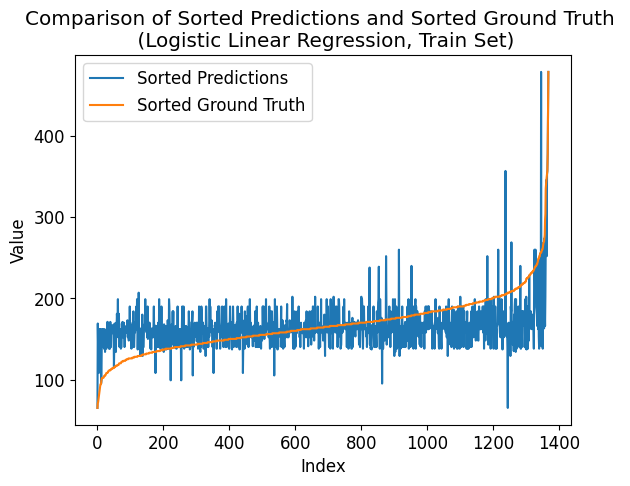

In [84]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

cm = confusion_matrix(y_train, y_pred_)
print("Confusion Matrix:")
print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Logistic Linear Regression, Train Set')

##### Evaluate (reduced)

The model is based on classifying data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results a smaller number of classes (e.g., reduced_class_num = 16), that is, for the example of class_num = 160 and reduced_class_num = 16, classes 0, 1, ..., 15 become one class, i.e., 0; ...; classes 144, 145, ..., 159 become one class, i.e., 15.

In [85]:
print("---- ---- ----")
# Define the boundaries for digitization
reduced_class_num = 16
intervals = np.arange(0, class_num + 1, class_num / reduced_class_num)
print(intervals)

y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
[162 141 167 152 170 169 168 166 162 170 158 167 260 138 162 170 157 143
 162  99 189 152 167 186 162 378 152 190 140 162 162 166 162 162 190 140
 154 180 163 170 158 147 166 162 163 167 152 138 170 202 153 166 190 166
 174 158 167 162 190 170 162 162 190 140 134 163 158 152 162 158 199 184]
[ 5  4  5  5  5  5  5  5  5  5  5  5  8  4  5  5  5  4  5  3  6  5  5  6
  5 12  5  6  4  5  5  5  5  5  6  4  5  6  5  5  5  4  5  5  5  5  5  4
  5  6  5  5  6  5  5  5  5  5  6  5  5  5  6  4  4  5  5  5  5  5  6  6]
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.4211442366633511
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
Mean squared error: 1.266812865497076
Correlation coefficient: 0.46808281720782485
Coefficient of determination (R-squared score, R2 score): 0.11157745943675201


Fixing the reduced class number, I enumerate the original class number to see what a original class number is better.

x_train shape: (1368, 14)
y_train shape: (1368,)
x_test shape: (72, 14)
y_test shape: (72,)
---- ---- ----
class_num = 16
Number of unique elements: 13
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.4313763983222873
Coefficient of determination (R-squared score, R2 score): 0.15592903828197946
train eval:
Mean squared error: 1.090643274853801
Correlation coefficient: 0.4937423525584534
Coefficient of determination (R-squared score, R2 score): 0.23512612203094863


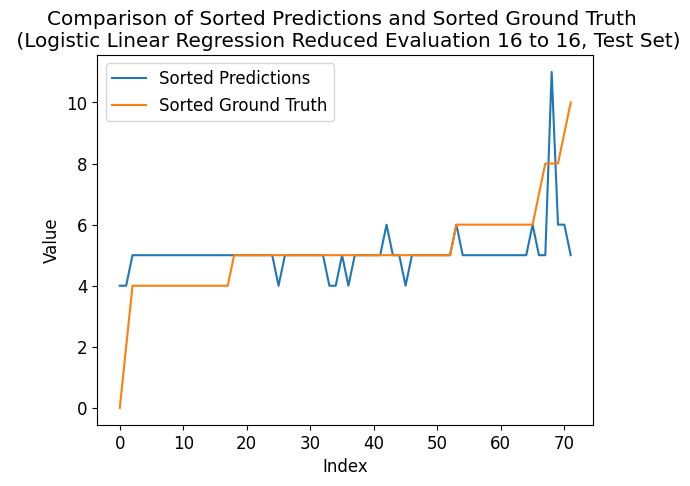

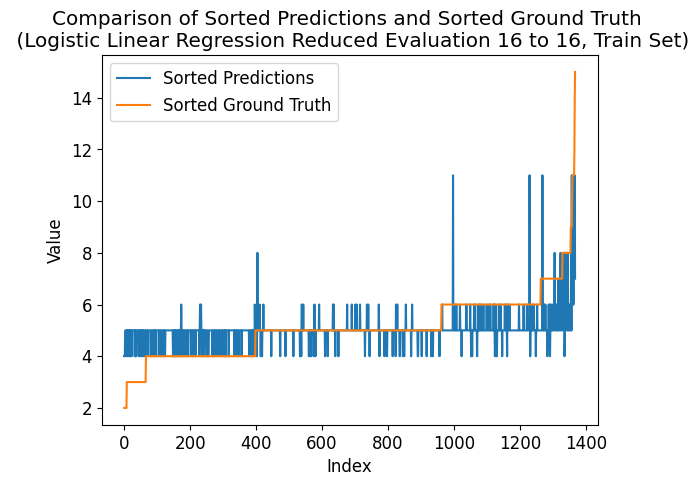

---- ---- ----
class_num = 32
Number of unique elements: 22
[ 0.  2.  4.  6.  8. 10. 12. 14. 16. 18. 20. 22. 24. 26. 28. 30. 32.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.4584227078059493
Coefficient of determination (R-squared score, R2 score): 0.08870214752567696
train eval:
Mean squared error: 1.1366959064327486
Correlation coefficient: 0.47776357570271016
Coefficient of determination (R-squared score, R2 score): 0.20282916873868984


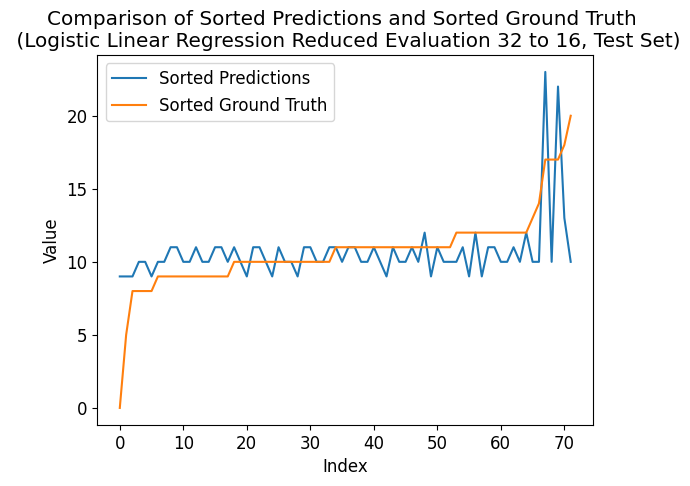

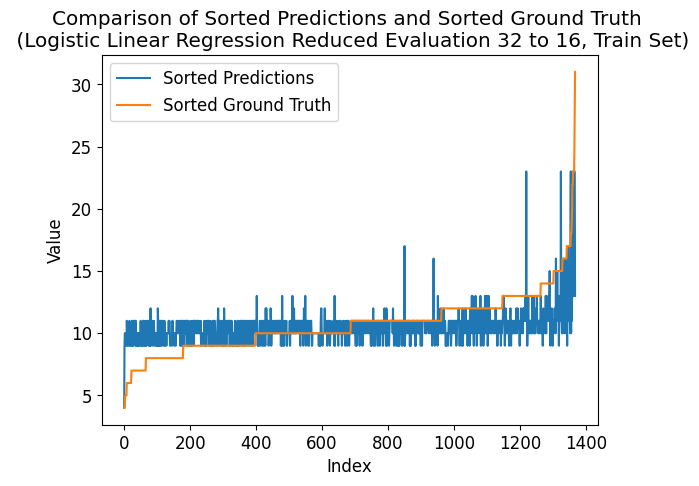

---- ---- ----
class_num = 48
Number of unique elements: 30
[ 0.  3.  6.  9. 12. 15. 18. 21. 24. 27. 30. 33. 36. 39. 42. 45. 48.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.44599985139572335
Coefficient of determination (R-squared score, R2 score): -0.0009337068160597539
train eval:
Mean squared error: 1.128654970760234
Correlation coefficient: 0.5022382379453247
Coefficient of determination (R-squared score, R2 score): 0.2084683193135286


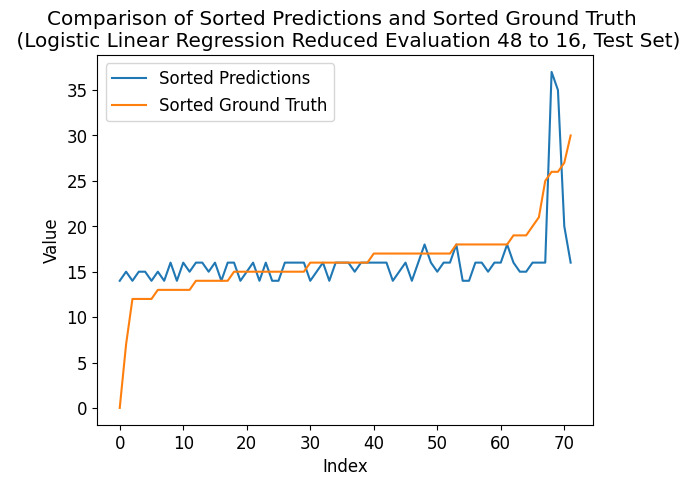

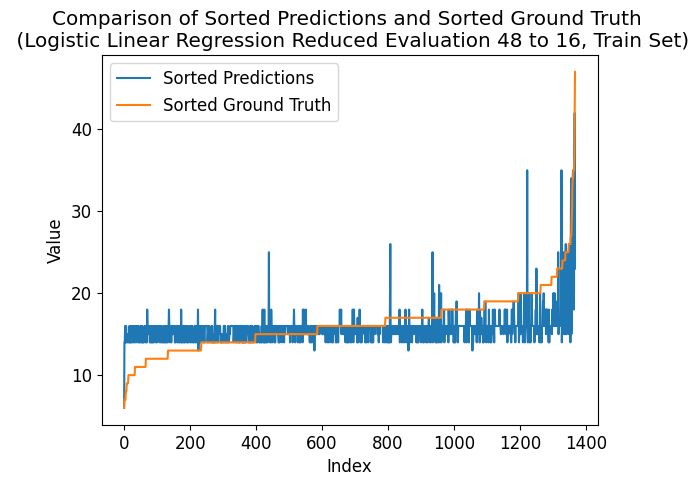

---- ---- ----
class_num = 64
Number of unique elements: 39
[ 0.  4.  8. 12. 16. 20. 24. 28. 32. 36. 40. 44. 48. 52. 56. 60. 64.]
test eval:
Mean squared error: 1.4583333333333333
Correlation coefficient: 0.4840479486774242
Coefficient of determination (R-squared score, R2 score): 0.21568627450980393
train eval:
Mean squared error: 1.1776315789473684
Correlation coefficient: 0.45338293644373096
Coefficient of determination (R-squared score, R2 score): 0.17412076581223745


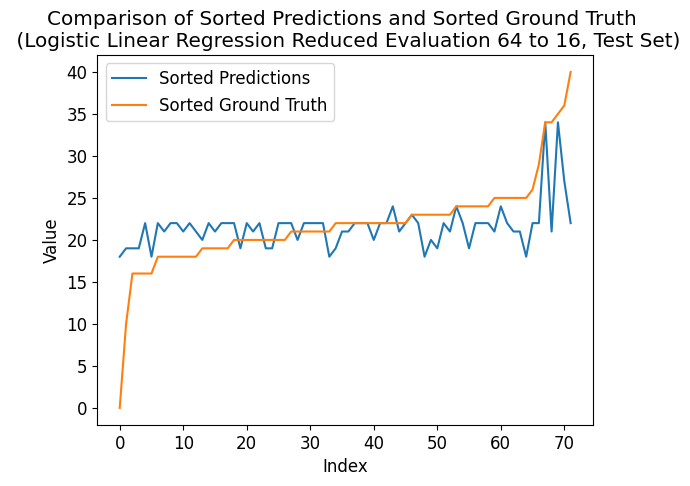

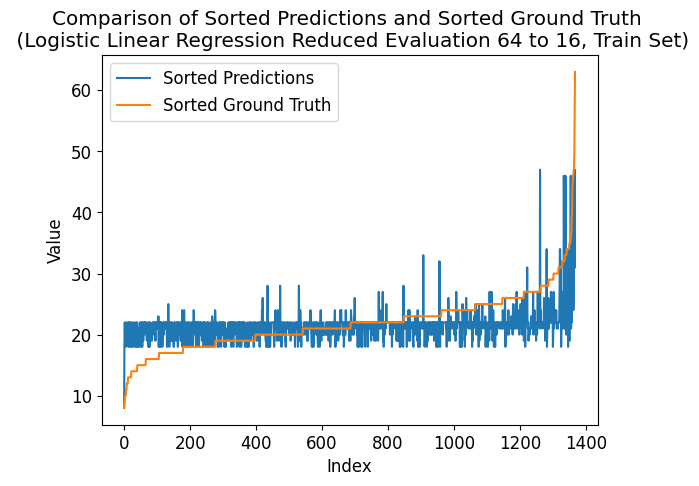

---- ---- ----
class_num = 80
Number of unique elements: 47
[ 0.  5. 10. 15. 20. 25. 30. 35. 40. 45. 50. 55. 60. 65. 70. 75. 80.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.4379020436734468
Coefficient of determination (R-squared score, R2 score): 0.08870214752567696
train eval:
Mean squared error: 1.1374269005847952
Correlation coefficient: 0.49018613302448594
Coefficient of determination (R-squared score, R2 score): 0.20231651868643175


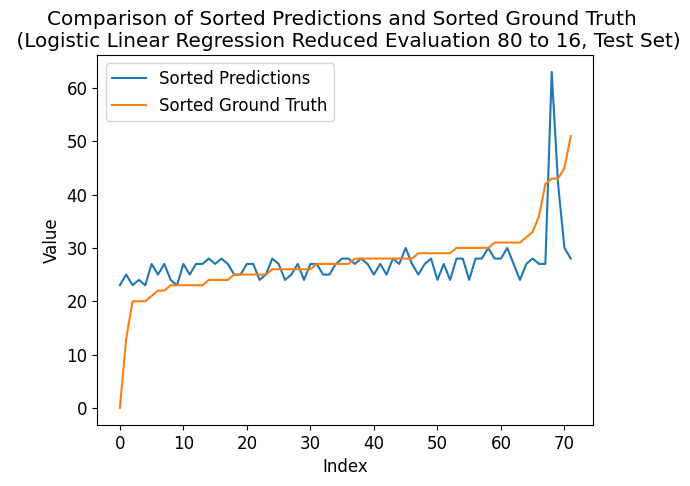

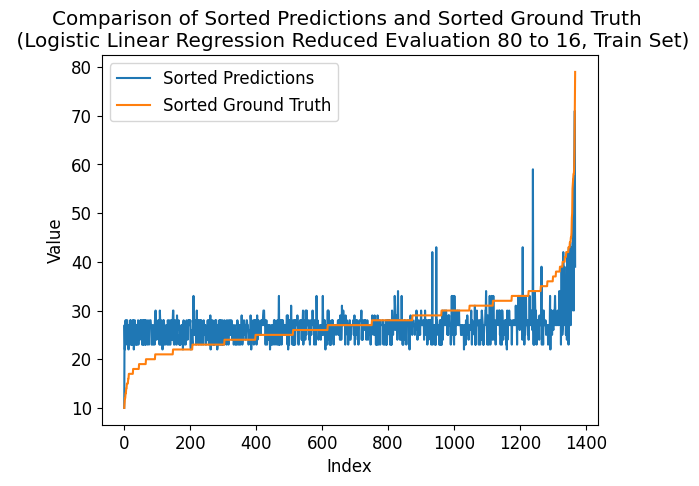

---- ---- ----
class_num = 96
Number of unique elements: 53
[ 0.  6. 12. 18. 24. 30. 36. 42. 48. 54. 60. 66. 72. 78. 84. 90. 96.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.4322037575423
Coefficient of determination (R-squared score, R2 score): 0.07376283846872078
train eval:
Mean squared error: 1.1951754385964912
Correlation coefficient: 0.4696957812482653
Coefficient of determination (R-squared score, R2 score): 0.16181716455804362


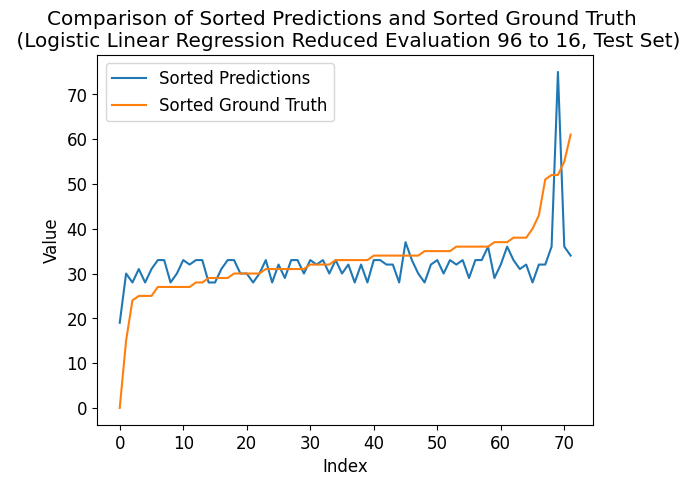

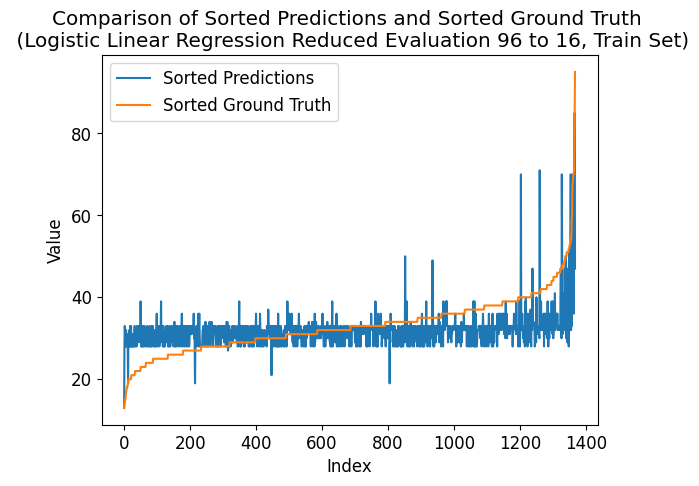

---- ---- ----
class_num = 112
Number of unique elements: 61
[  0.   7.  14.  21.  28.  35.  42.  49.  56.  63.  70.  77.  84.  91.
  98. 105. 112.]
test eval:
Mean squared error: 1.4027777777777777
Correlation coefficient: 0.5256920691801376
Coefficient of determination (R-squared score, R2 score): 0.24556489262371617
train eval:
Mean squared error: 1.1432748538011697
Correlation coefficient: 0.4774943818557002
Coefficient of determination (R-squared score, R2 score): 0.19821531826836714


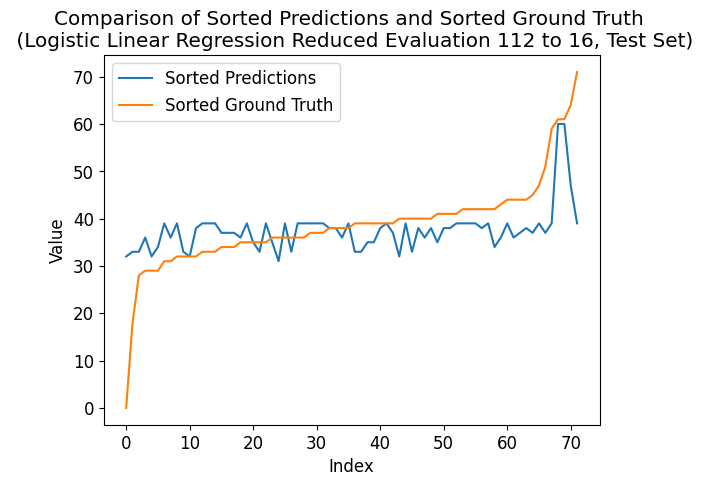

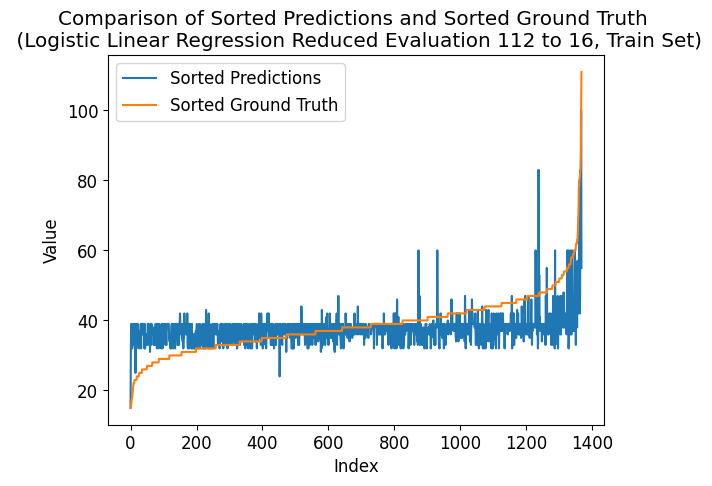

---- ---- ----
class_num = 128
Number of unique elements: 68
[  0.   8.  16.  24.  32.  40.  48.  56.  64.  72.  80.  88.  96. 104.
 112. 120. 128.]
test eval:
Mean squared error: 1.3333333333333333
Correlation coefficient: 0.556725805264799
Coefficient of determination (R-squared score, R2 score): 0.28291316526610644
train eval:
Mean squared error: 1.168859649122807
Correlation coefficient: 0.49186512535553734
Coefficient of determination (R-squared score, R2 score): 0.18027256643933443


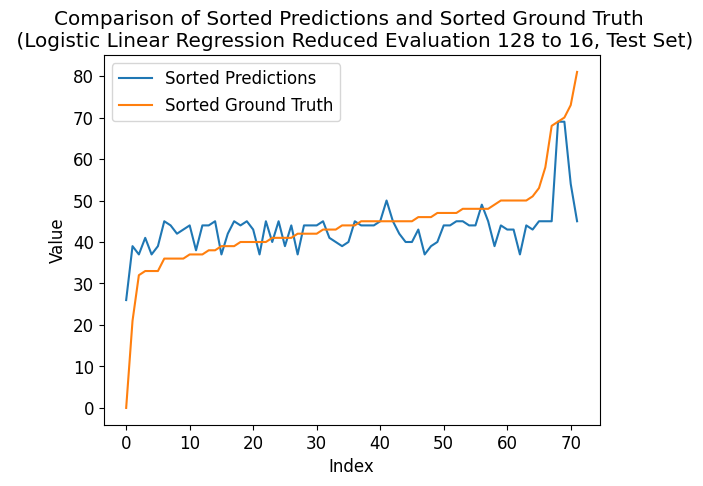

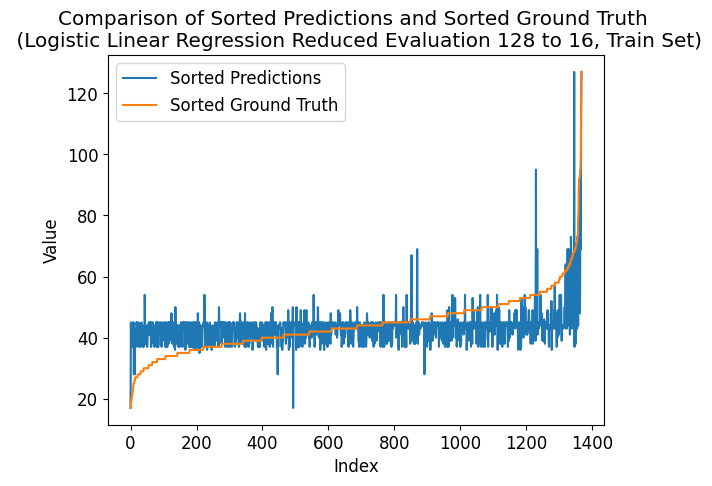

---- ---- ----
class_num = 144
Number of unique elements: 75
[  0.   9.  18.  27.  36.  45.  54.  63.  72.  81.  90.  99. 108. 117.
 126. 135. 144.]
test eval:
Mean squared error: 1.5416666666666667
Correlation coefficient: 0.49476274731670417
Coefficient of determination (R-squared score, R2 score): 0.17086834733893552
train eval:
Mean squared error: 1.154970760233918
Correlation coefficient: 0.5074756435679069
Coefficient of determination (R-squared score, R2 score): 0.19001291743223792


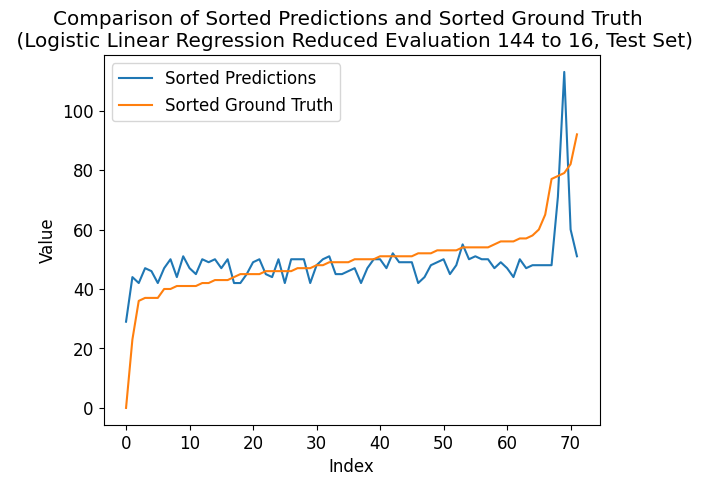

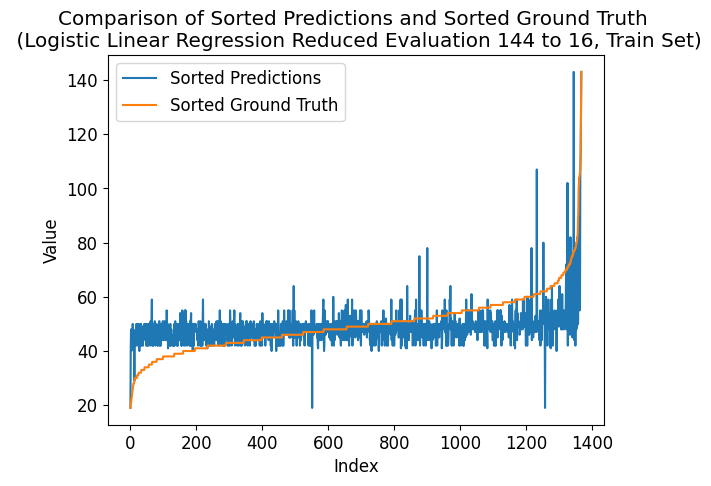

---- ---- ----
class_num = 160
Number of unique elements: 80
[  0.  10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130.
 140. 150. 160.]
test eval:
Mean squared error: 1.4583333333333333
Correlation coefficient: 0.4840479486774242
Coefficient of determination (R-squared score, R2 score): 0.21568627450980393
train eval:
Mean squared error: 1.1586257309941521
Correlation coefficient: 0.4876647688470753
Coefficient of determination (R-squared score, R2 score): 0.18744966717094746


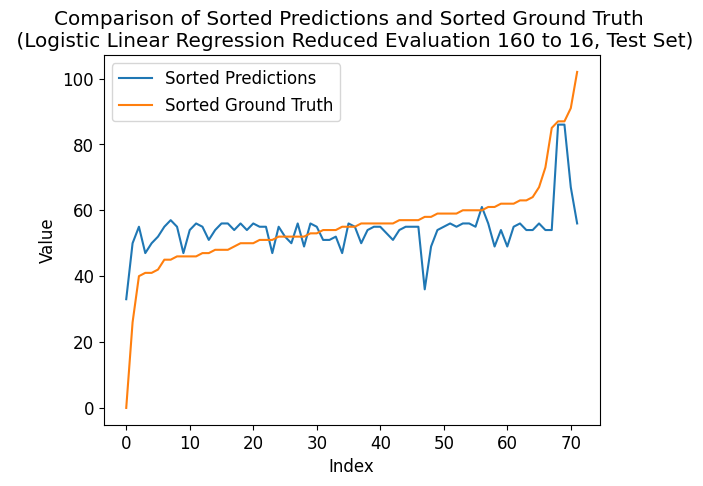

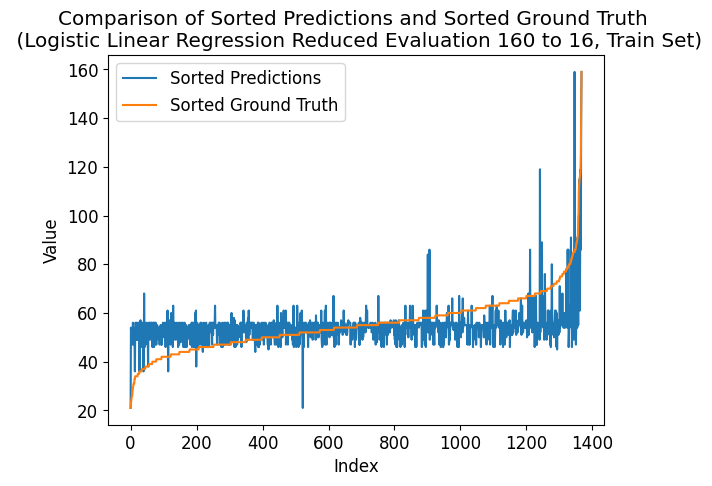

---- ---- ----
class_num = 176
Number of unique elements: 85
[  0.  11.  22.  33.  44.  55.  66.  77.  88.  99. 110. 121. 132. 143.
 154. 165. 176.]
test eval:
Mean squared error: 1.3194444444444444
Correlation coefficient: 0.5549898271829921
Coefficient of determination (R-squared score, R2 score): 0.29038281979458447
train eval:
Mean squared error: 1.1915204678362572
Correlation coefficient: 0.489140711054498
Coefficient of determination (R-squared score, R2 score): 0.16438041481933396


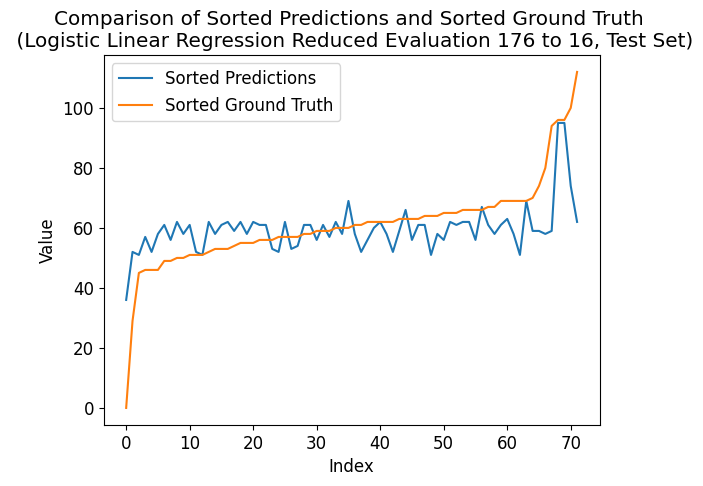

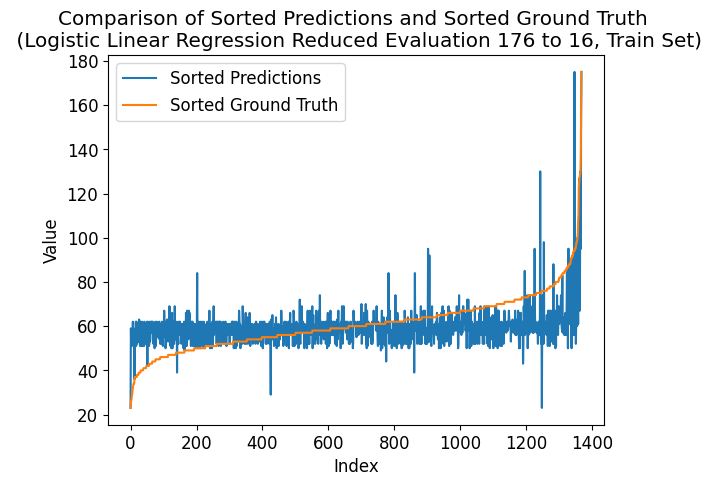

---- ---- ----
class_num = 192
Number of unique elements: 93
[  0.  12.  24.  36.  48.  60.  72.  84.  96. 108. 120. 132. 144. 156.
 168. 180. 192.]
test eval:
Mean squared error: 1.5555555555555556
Correlation coefficient: 0.4947426083580659
Coefficient of determination (R-squared score, R2 score): 0.1633986928104575
train eval:
Mean squared error: 1.1432748538011697
Correlation coefficient: 0.5057620567304648
Coefficient of determination (R-squared score, R2 score): 0.19821531826836714


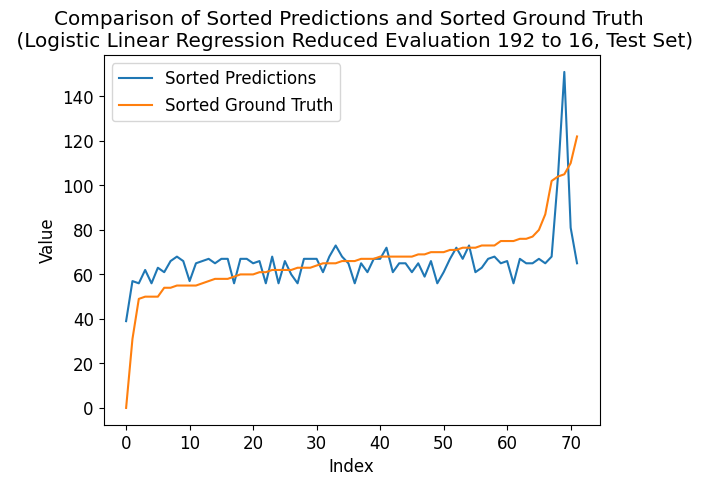

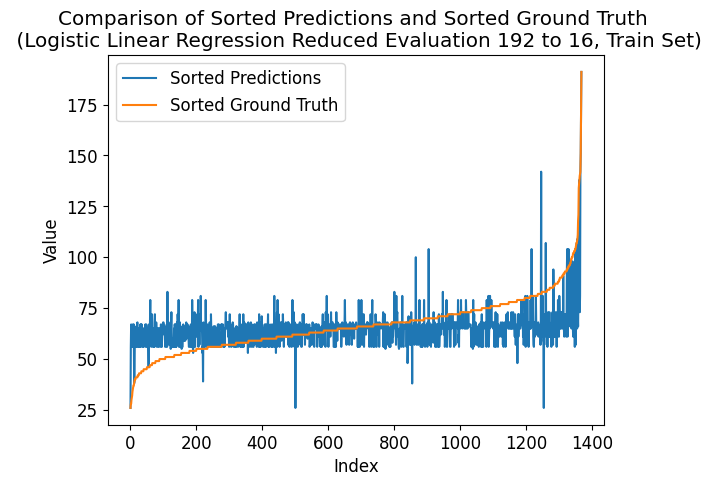

---- ---- ----
class_num = 208
Number of unique elements: 96
[  0.  13.  26.  39.  52.  65.  78.  91. 104. 117. 130. 143. 156. 169.
 182. 195. 208.]
test eval:
Mean squared error: 1.3472222222222223
Correlation coefficient: 0.5413682524632262
Coefficient of determination (R-squared score, R2 score): 0.2754435107376284
train eval:
Mean squared error: 1.1600877192982457
Correlation coefficient: 0.4946974442669705
Coefficient of determination (R-squared score, R2 score): 0.18642436706643128


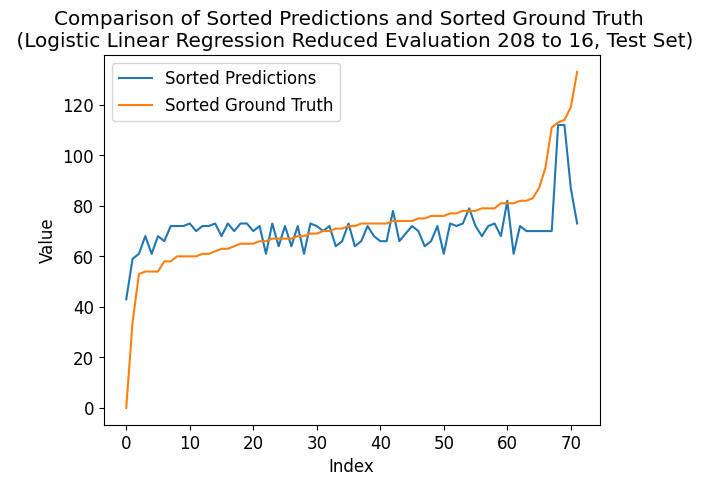

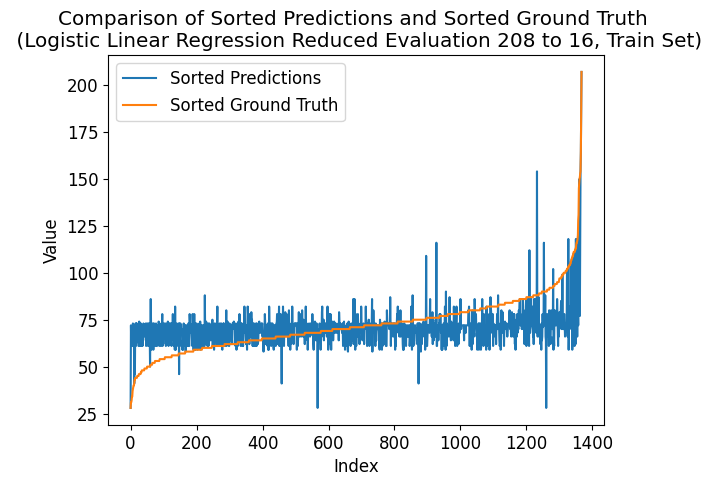

---- ---- ----
class_num = 224
Number of unique elements: 99
[  0.  14.  28.  42.  56.  70.  84.  98. 112. 126. 140. 154. 168. 182.
 196. 210. 224.]
test eval:
Mean squared error: 1.4305555555555556
Correlation coefficient: 0.4934320296098701
Coefficient of determination (R-squared score, R2 score): 0.23062558356676
train eval:
Mean squared error: 1.1571637426900585
Correlation coefficient: 0.48157227111910395
Coefficient of determination (R-squared score, R2 score): 0.18847496727546365


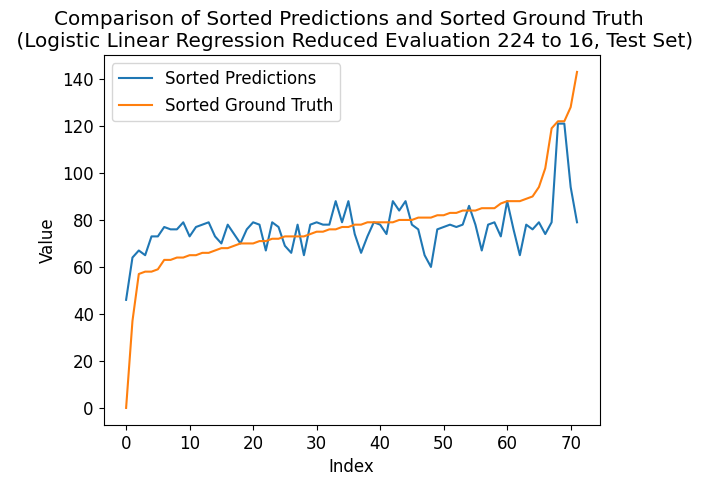

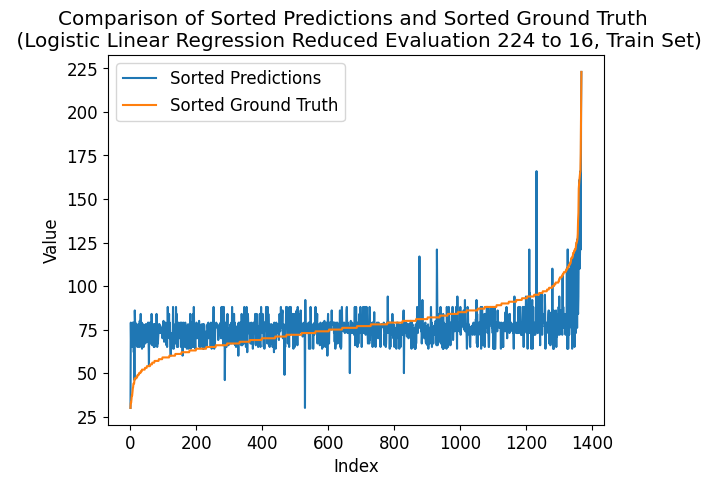

---- ---- ----
class_num = 240
Number of unique elements: 107
[  0.  15.  30.  45.  60.  75.  90. 105. 120. 135. 150. 165. 180. 195.
 210. 225. 240.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.47278614818119935
Coefficient of determination (R-squared score, R2 score): 0.15592903828197946
train eval:
Mean squared error: 1.1637426900584795
Correlation coefficient: 0.4906183882824831
Coefficient of determination (R-squared score, R2 score): 0.18386111680514095


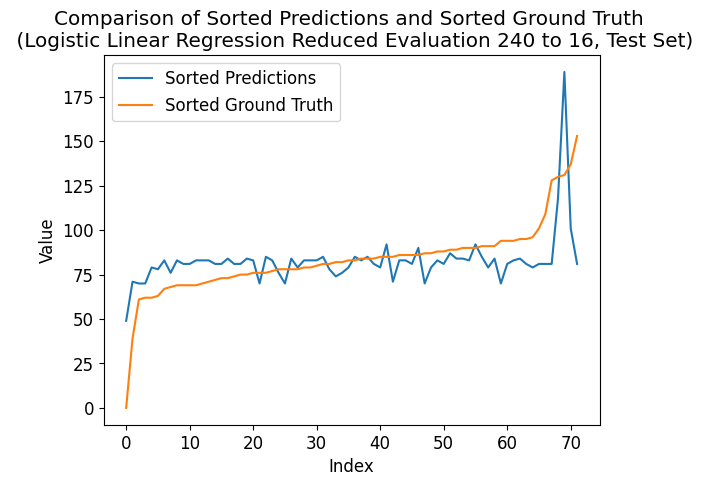

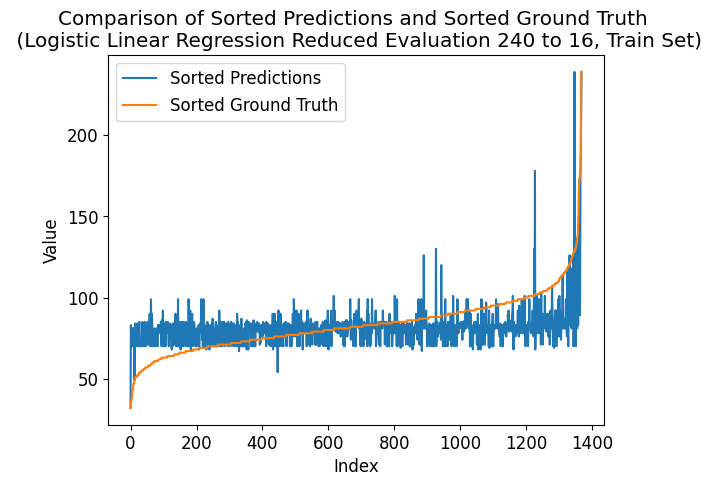

---- ---- ----
class_num = 256
Number of unique elements: 112
[  0.  16.  32.  48.  64.  80.  96. 112. 128. 144. 160. 176. 192. 208.
 224. 240. 256.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.45650691560224516
Coefficient of determination (R-squared score, R2 score): 0.11858076563958919
train eval:
Mean squared error: 1.1805555555555556
Correlation coefficient: 0.5002004759466409
Coefficient of determination (R-squared score, R2 score): 0.1720701656032052


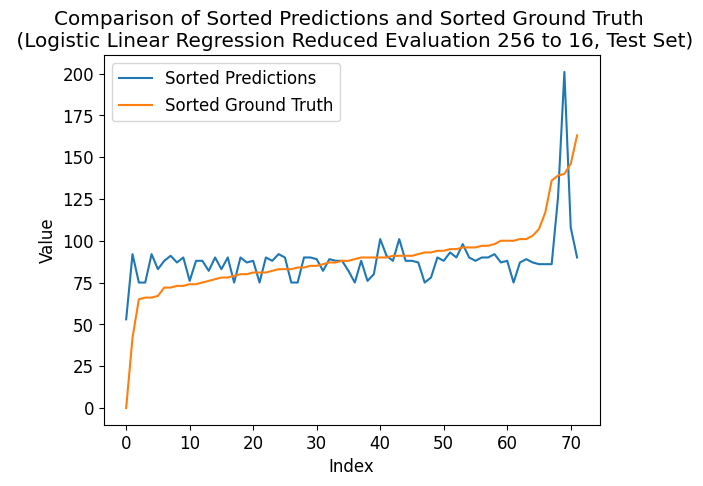

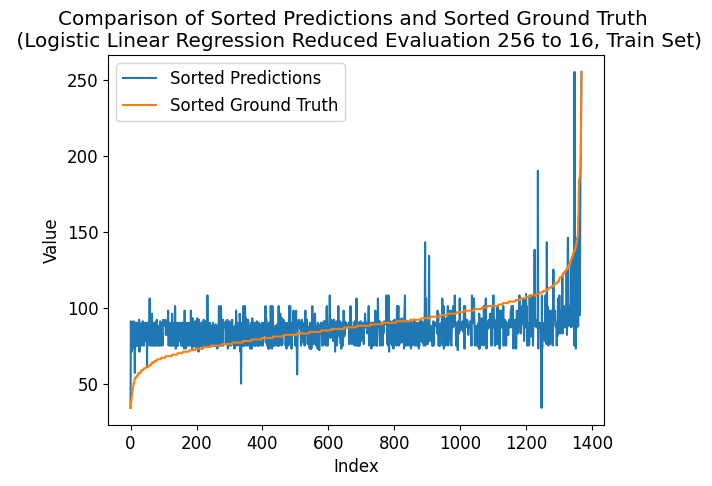

---- ---- ----
class_num = 272
Number of unique elements: 118
[  0.  17.  34.  51.  68.  85. 102. 119. 136. 153. 170. 187. 204. 221.
 238. 255. 272.]
test eval:
Mean squared error: 1.375
Correlation coefficient: 0.519590699723782
Coefficient of determination (R-squared score, R2 score): 0.26050420168067223
train eval:
Mean squared error: 1.266812865497076
Correlation coefficient: 0.4647542985426648
Coefficient of determination (R-squared score, R2 score): 0.11157745943675201


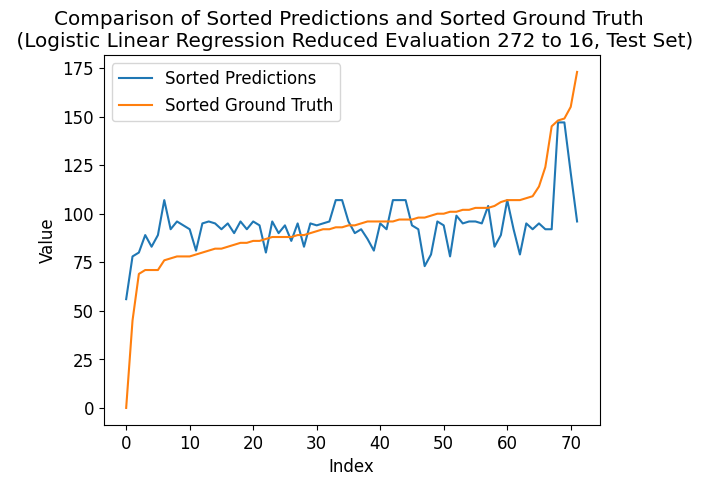

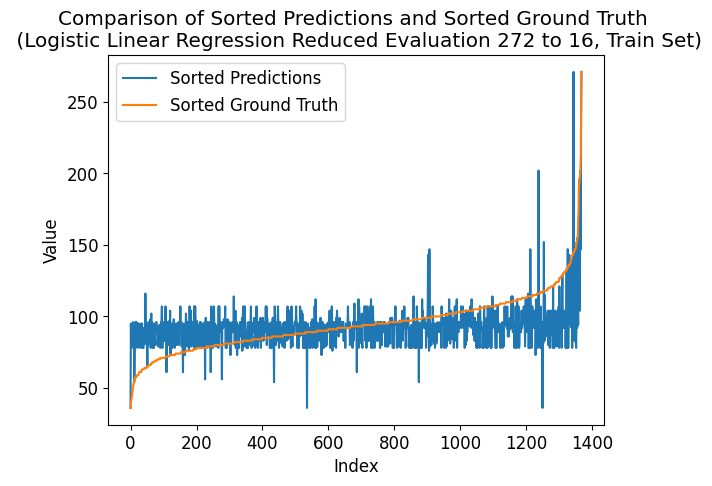

---- ---- ----
class_num = 288
Number of unique elements: 123
[  0.  18.  36.  54.  72.  90. 108. 126. 144. 162. 180. 198. 216. 234.
 252. 270. 288.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.4834781742074105
Coefficient of determination (R-squared score, R2 score): 0.15592903828197946
train eval:
Mean squared error: 1.1461988304093567
Correlation coefficient: 0.51093149794372
Coefficient of determination (R-squared score, R2 score): 0.19616471805933478


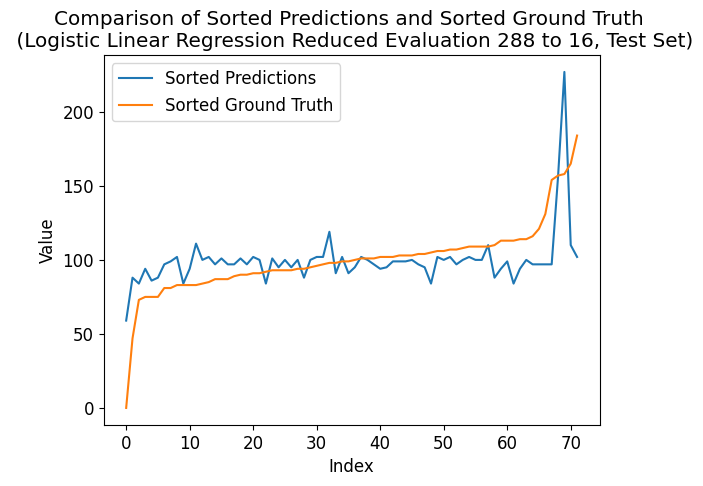

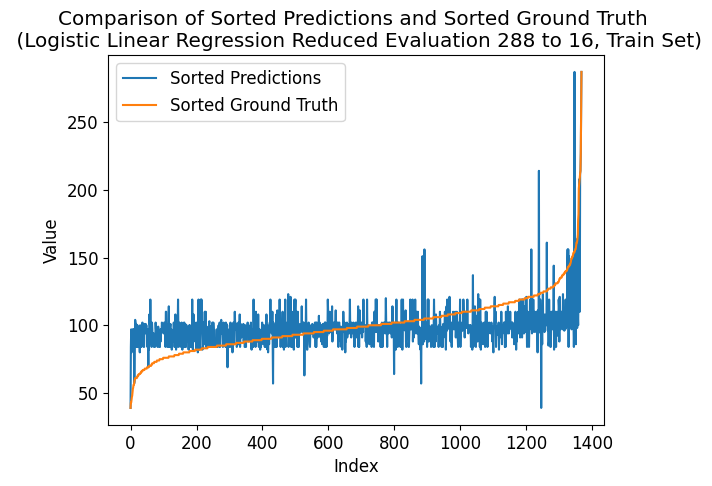

---- ---- ----
class_num = 304
Number of unique elements: 128
[  0.  19.  38.  57.  76.  95. 114. 133. 152. 171. 190. 209. 228. 247.
 266. 285. 304.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.4617270814263192
Coefficient of determination (R-squared score, R2 score): 0.11858076563958919
train eval:
Mean squared error: 1.2076023391812865
Correlation coefficient: 0.49387353995205285
Coefficient of determination (R-squared score, R2 score): 0.15310211366965631


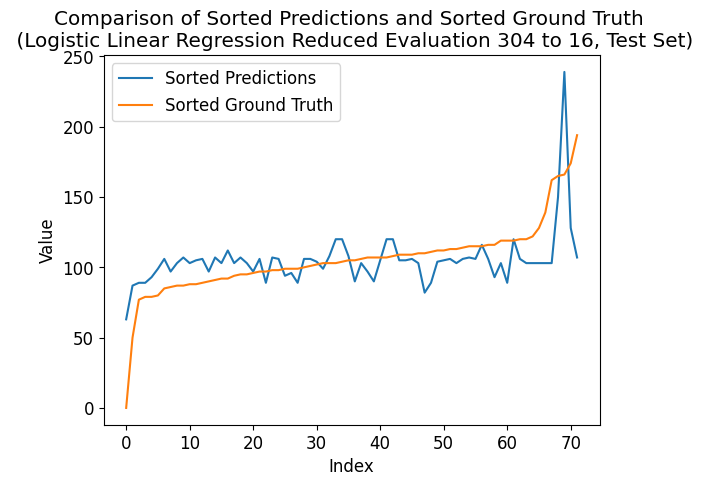

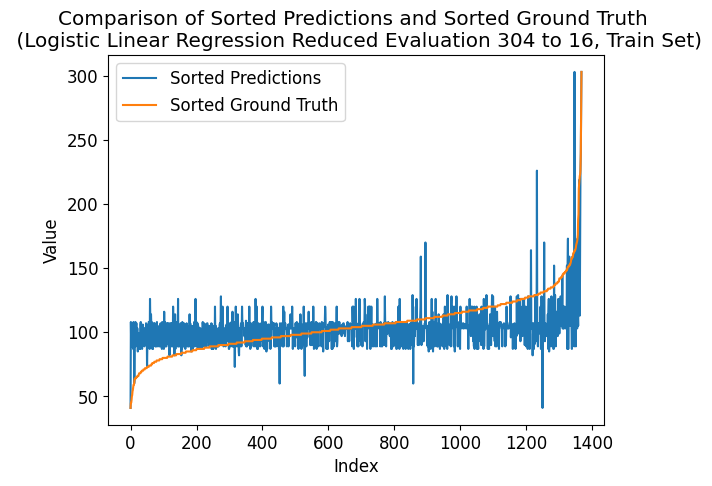

---- ---- ----
class_num = 320
Number of unique elements: 131
[  0.  20.  40.  60.  80. 100. 120. 140. 160. 180. 200. 220. 240. 260.
 280. 300. 320.]
test eval:
Mean squared error: 1.4444444444444444
Correlation coefficient: 0.49474260835806494
Coefficient of determination (R-squared score, R2 score): 0.22315592903828196
train eval:
Mean squared error: 1.236842105263158
Correlation coefficient: 0.46910805103925024
Coefficient of determination (R-squared score, R2 score): 0.13259611157933315


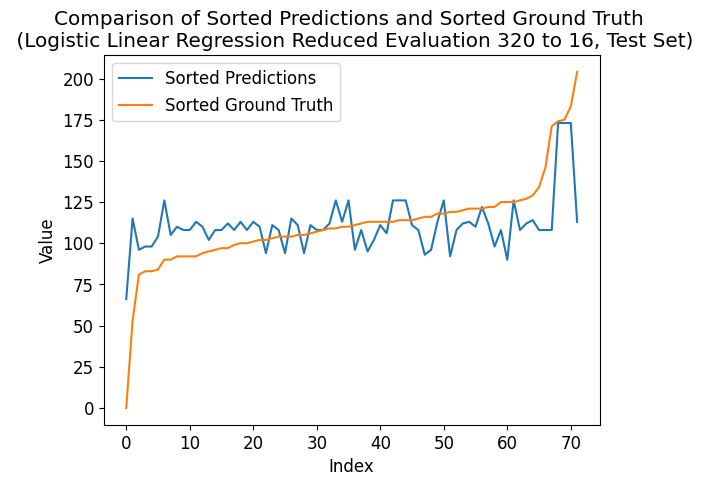

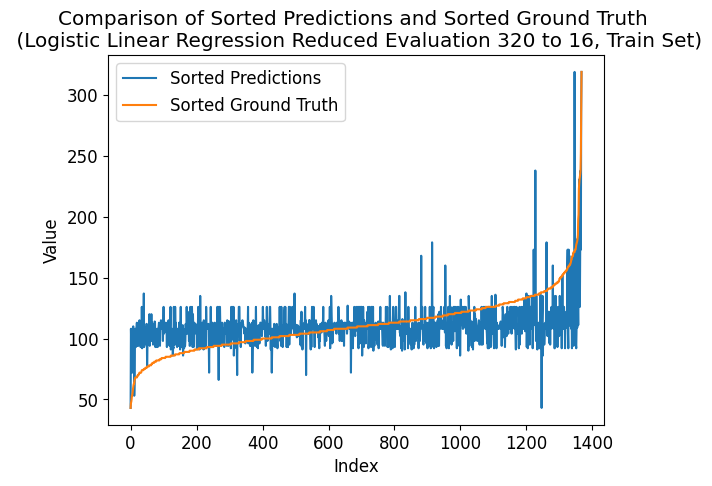

---- ---- ----
class_num = 336
Number of unique elements: 137
[  0.  21.  42.  63.  84. 105. 126. 147. 168. 189. 210. 231. 252. 273.
 294. 315. 336.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.41416566626650614
Coefficient of determination (R-squared score, R2 score): 0.028944911297852483
train eval:
Mean squared error: 1.236842105263158
Correlation coefficient: 0.49002401933027445
Coefficient of determination (R-squared score, R2 score): 0.13259611157933315


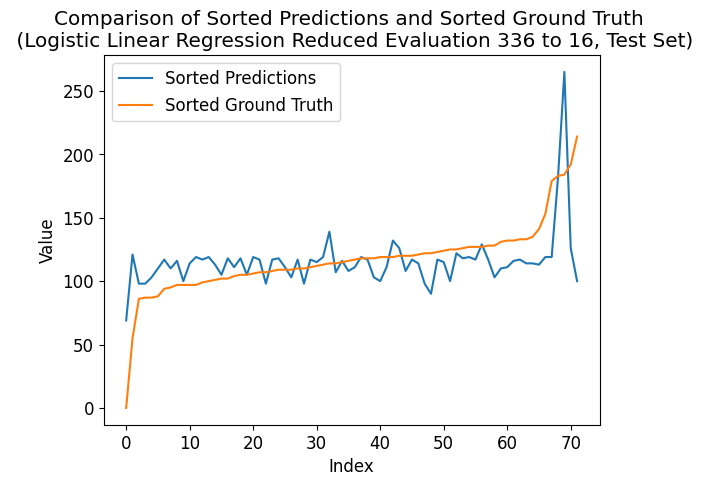

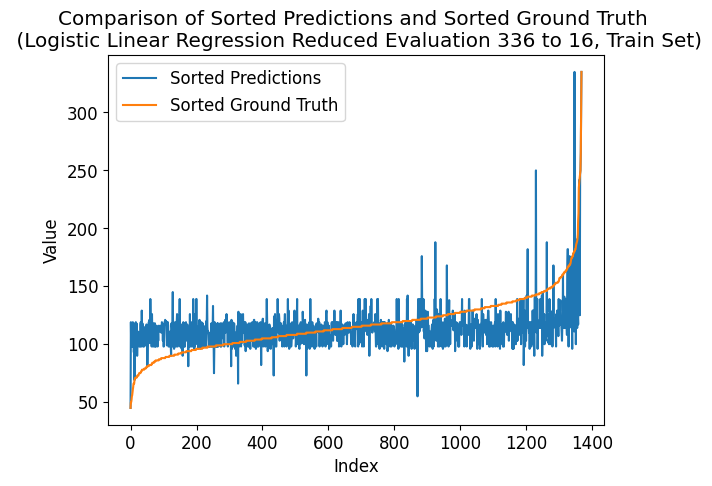

---- ---- ----
class_num = 352
Number of unique elements: 142
[  0.  22.  44.  66.  88. 110. 132. 154. 176. 198. 220. 242. 264. 286.
 308. 330. 352.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.46938438711823416
Coefficient of determination (R-squared score, R2 score): 0.11858076563958919
train eval:
Mean squared error: 1.2141812865497077
Correlation coefficient: 0.48797738693377524
Coefficient of determination (R-squared score, R2 score): 0.14848826319933361


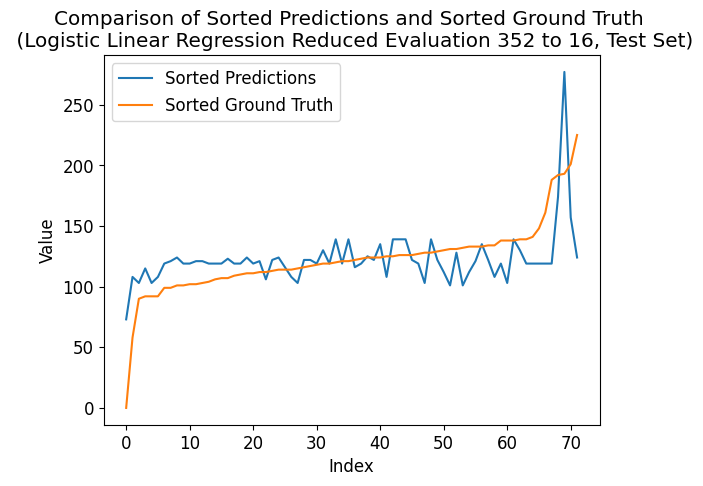

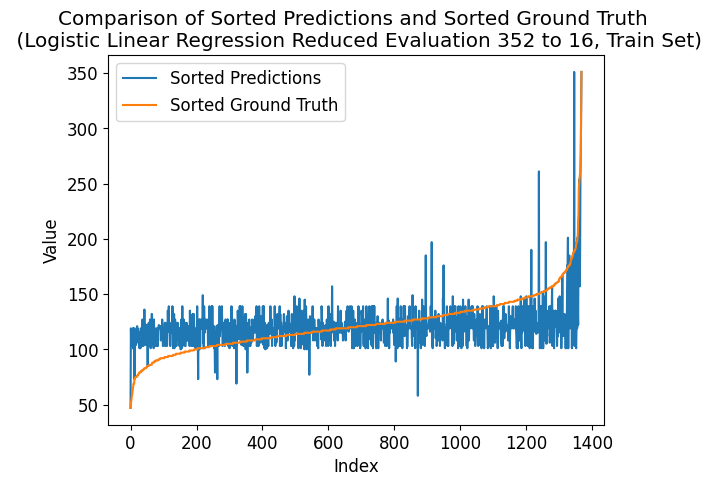

---- ---- ----
class_num = 368
Number of unique elements: 145
[  0.  23.  46.  69.  92. 115. 138. 161. 184. 207. 230. 253. 276. 299.
 322. 345. 368.]
test eval:
Mean squared error: 1.5277777777777777
Correlation coefficient: 0.5151516856124113
Coefficient of determination (R-squared score, R2 score): 0.17833800186741366
train eval:
Mean squared error: 1.2002923976608186
Correlation coefficient: 0.47276351140580186
Coefficient of determination (R-squared score, R2 score): 0.1582286141922371


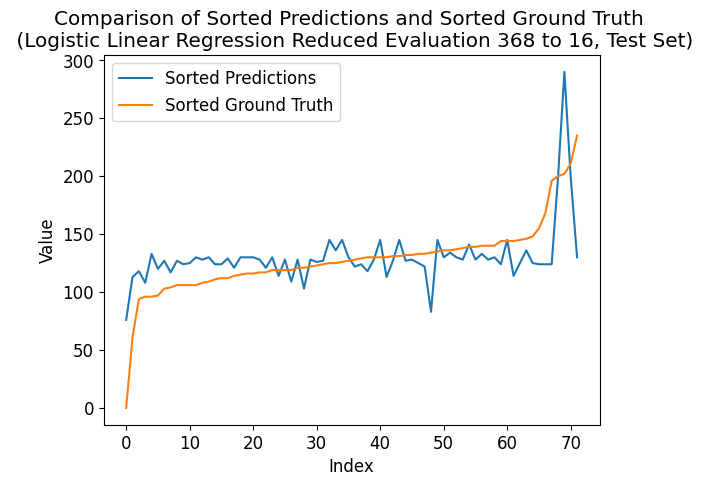

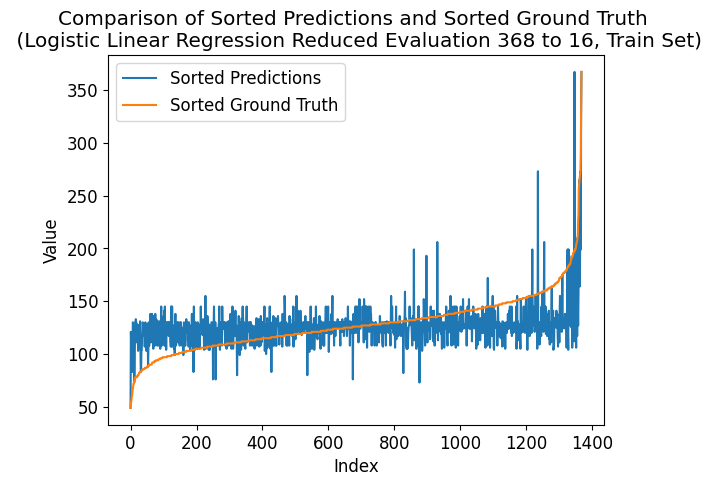

---- ---- ----
class_num = 384
Number of unique elements: 154
[  0.  24.  48.  72.  96. 120. 144. 168. 192. 216. 240. 264. 288. 312.
 336. 360. 384.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.4330188277111793
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.213450292397661
Correlation coefficient: 0.4976300934411591
Coefficient of determination (R-squared score, R2 score): 0.1490009132515917


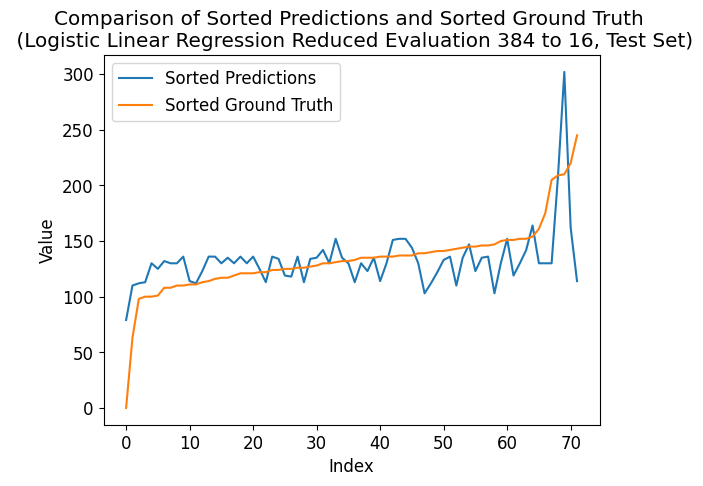

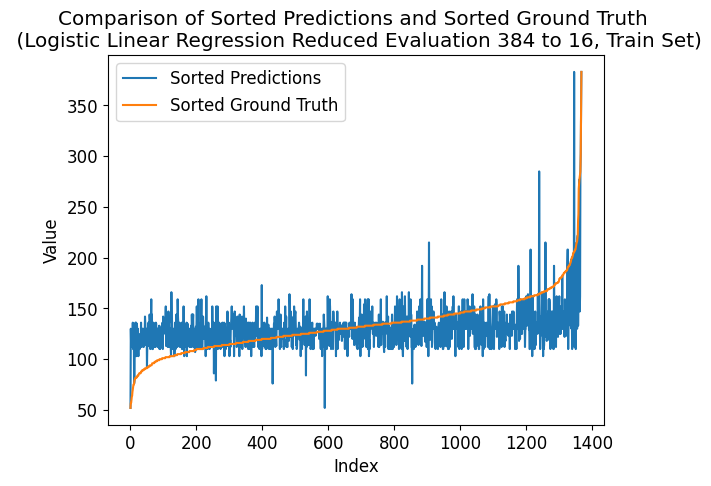

---- ---- ----
class_num = 400
Number of unique elements: 154
[  0.  25.  50.  75. 100. 125. 150. 175. 200. 225. 250. 275. 300. 325.
 350. 375. 400.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.4638039455832802
Coefficient of determination (R-squared score, R2 score): 0.09617180205415499
train eval:
Mean squared error: 1.2375730994152048
Correlation coefficient: 0.4811788624464507
Coefficient of determination (R-squared score, R2 score): 0.13208346152707517


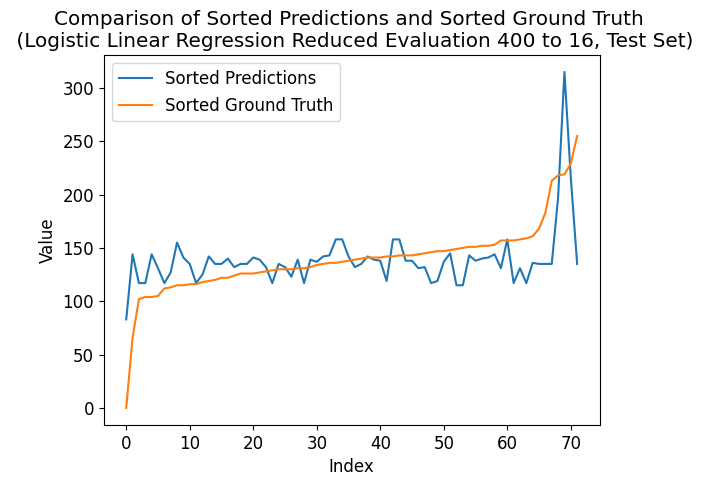

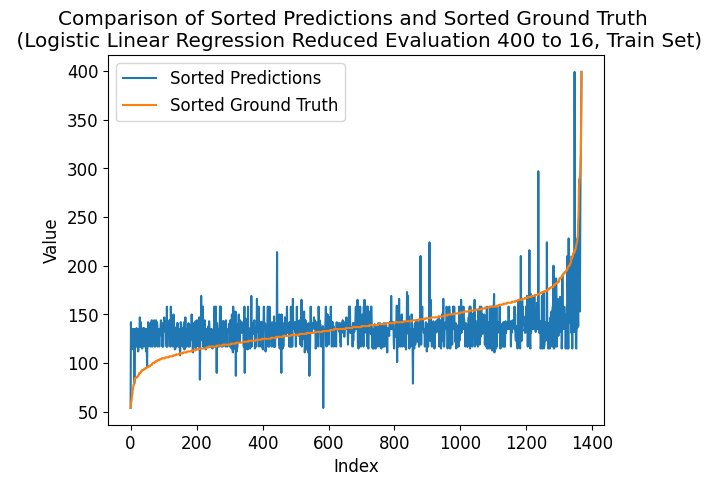

---- ---- ----
class_num = 416
Number of unique elements: 159
[  0.  26.  52.  78. 104. 130. 156. 182. 208. 234. 260. 286. 312. 338.
 364. 390. 416.]
test eval:
Mean squared error: 1.5833333333333333
Correlation coefficient: 0.47388885496854305
Coefficient of determination (R-squared score, R2 score): 0.14845938375350143
train eval:
Mean squared error: 1.206140350877193
Correlation coefficient: 0.49221705881315964
Coefficient of determination (R-squared score, R2 score): 0.1541274137741725


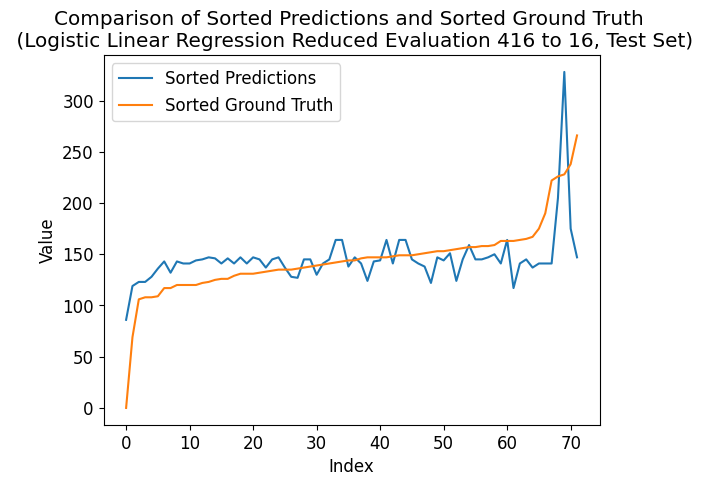

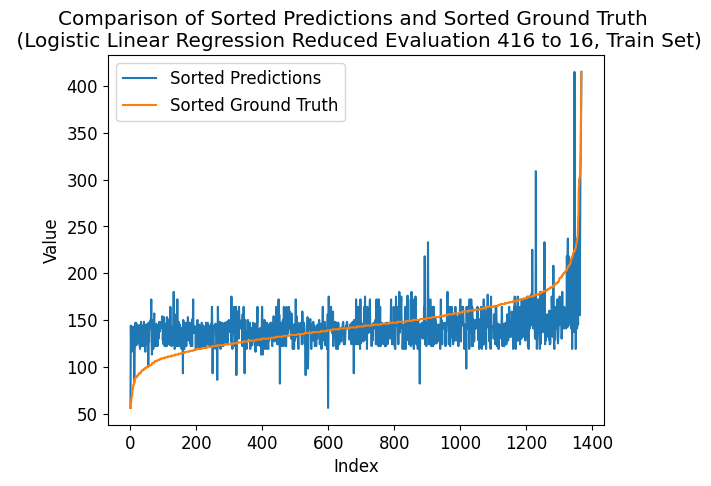

---- ---- ----
class_num = 432
Number of unique elements: 165
[  0.  27.  54.  81. 108. 135. 162. 189. 216. 243. 270. 297. 324. 351.
 378. 405. 432.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.4673074723829523
Coefficient of determination (R-squared score, R2 score): 0.11858076563958919
train eval:
Mean squared error: 1.2288011695906433
Correlation coefficient: 0.49090788967364374
Coefficient of determination (R-squared score, R2 score): 0.13823526215417203


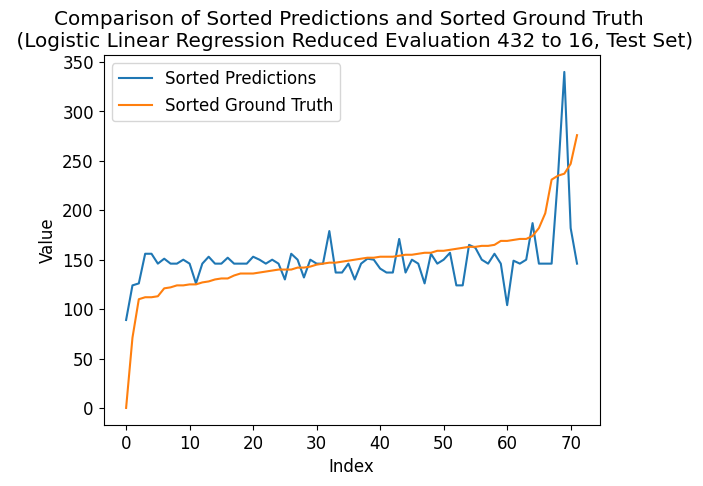

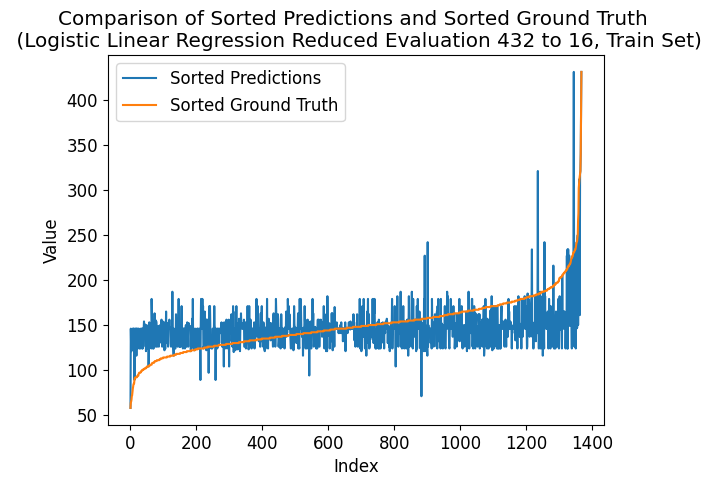

---- ---- ----
class_num = 448
Number of unique elements: 170
[  0.  28.  56.  84. 112. 140. 168. 196. 224. 252. 280. 308. 336. 364.
 392. 420. 448.]
test eval:
Mean squared error: 1.6111111111111112
Correlation coefficient: 0.4714267300321648
Coefficient of determination (R-squared score, R2 score): 0.13352007469654525
train eval:
Mean squared error: 1.2339181286549707
Correlation coefficient: 0.4766261895718343
Coefficient of determination (R-squared score, R2 score): 0.13464671178836551


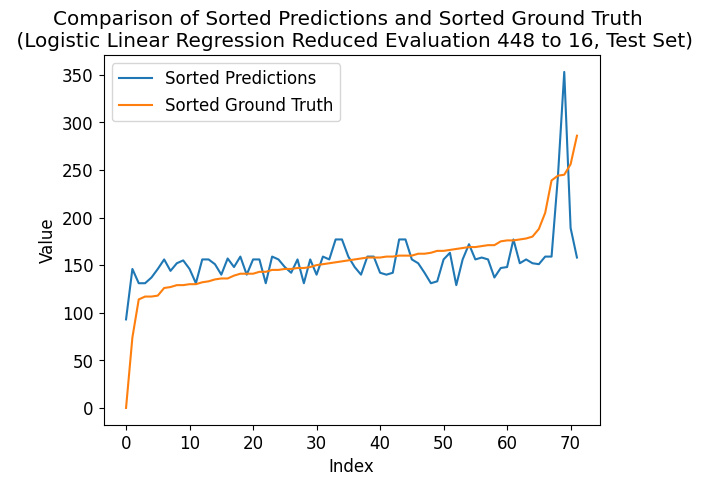

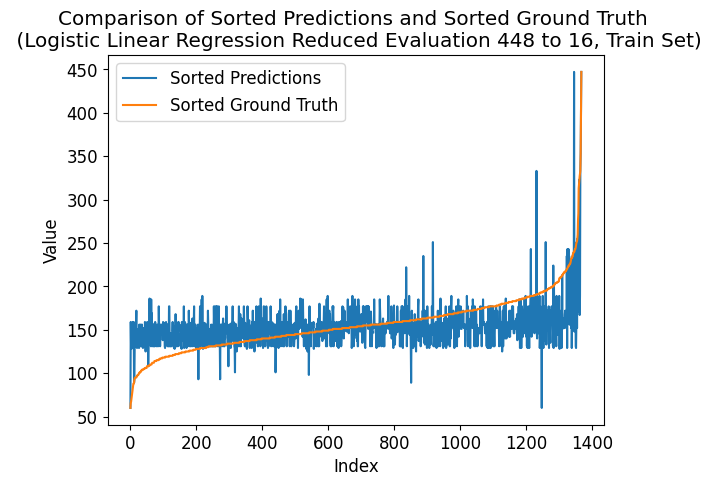

---- ---- ----
class_num = 464
Number of unique elements: 173
[  0.  29.  58.  87. 116. 145. 174. 203. 232. 261. 290. 319. 348. 377.
 406. 435. 464.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.47902818865469377
Coefficient of determination (R-squared score, R2 score): 0.12605042016806722
train eval:
Mean squared error: 1.2273391812865497
Correlation coefficient: 0.4904867276327678
Coefficient of determination (R-squared score, R2 score): 0.13926056225868821


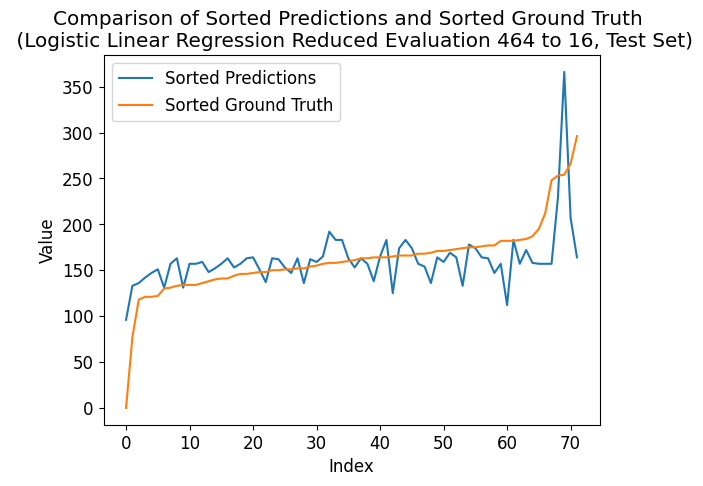

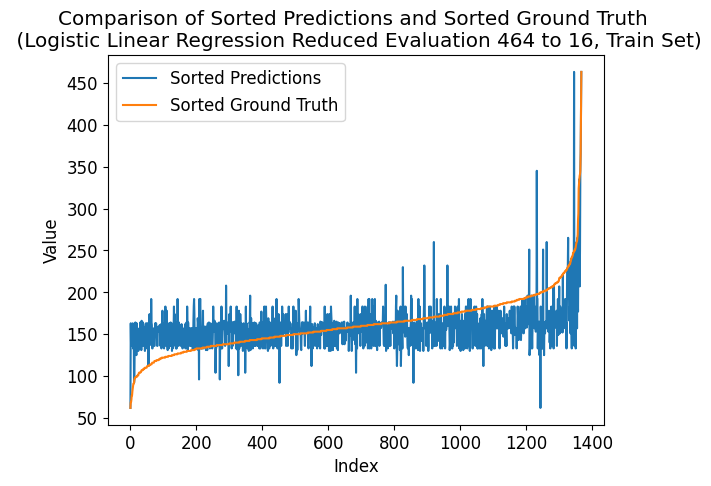

---- ---- ----
class_num = 480
Number of unique elements: 180
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.4211442366633511
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
train eval:
Mean squared error: 1.266812865497076
Correlation coefficient: 0.46808281720782485
Coefficient of determination (R-squared score, R2 score): 0.11157745943675201


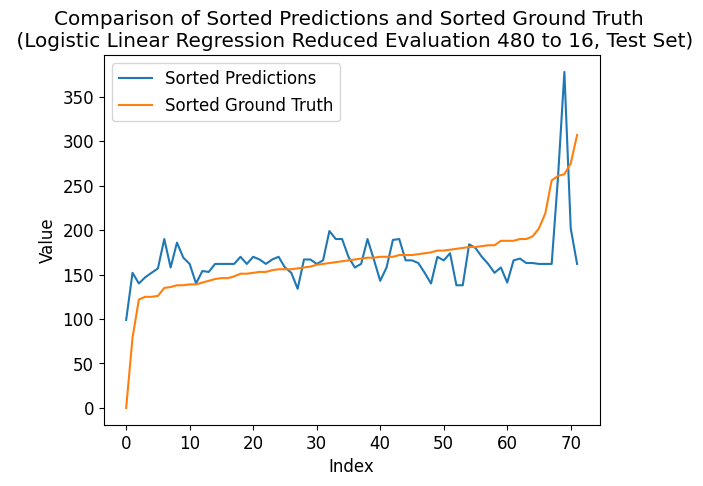

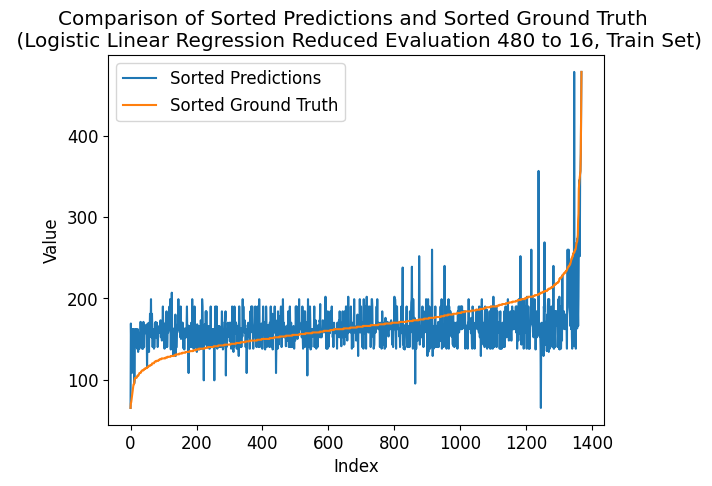

---- ---- ----
class_num = 496
Number of unique elements: 183
[  0.  31.  62.  93. 124. 155. 186. 217. 248. 279. 310. 341. 372. 403.
 434. 465. 496.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.46641526245836146
Coefficient of determination (R-squared score, R2 score): 0.12605042016806722
train eval:
Mean squared error: 1.2251461988304093
Correlation coefficient: 0.4843054040900157
Coefficient of determination (R-squared score, R2 score): 0.14079851241546248


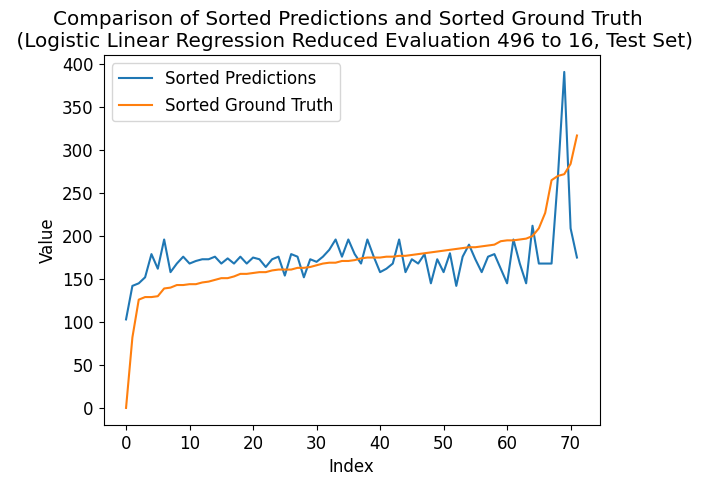

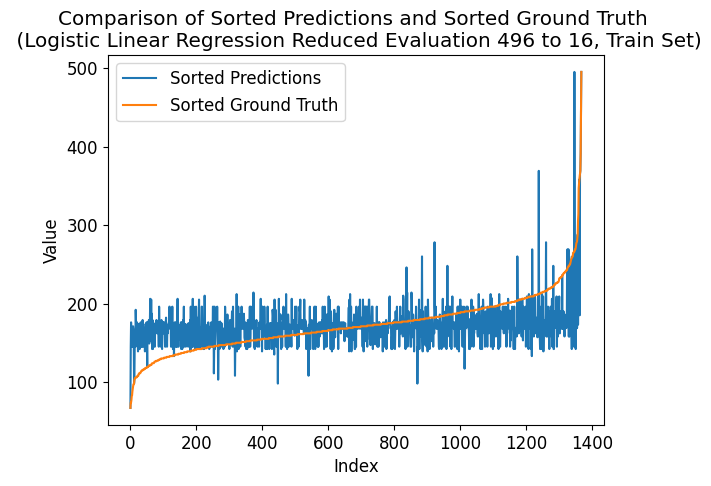

---- ---- ----
class_num = 512
Number of unique elements: 188
[  0.  32.  64.  96. 128. 160. 192. 224. 256. 288. 320. 352. 384. 416.
 448. 480. 512.]
test eval:
Mean squared error: 1.4861111111111112
Correlation coefficient: 0.5227266281332706
Coefficient of determination (R-squared score, R2 score): 0.20074696545284776
train eval:
Mean squared error: 1.2339181286549707
Correlation coefficient: 0.48039431169055996
Coefficient of determination (R-squared score, R2 score): 0.13464671178836551


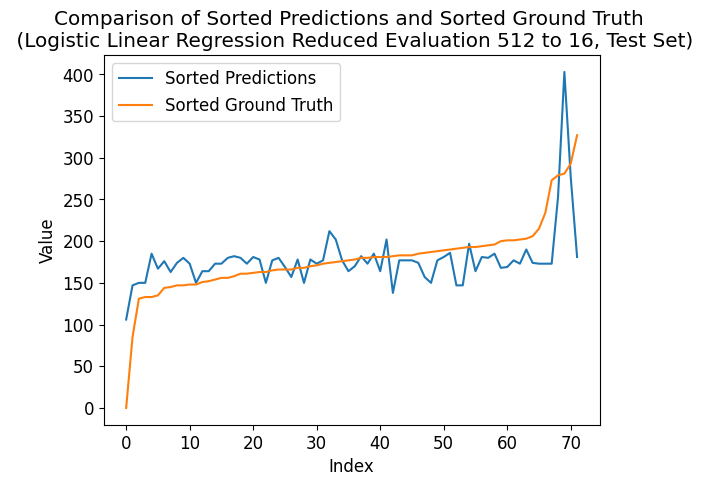

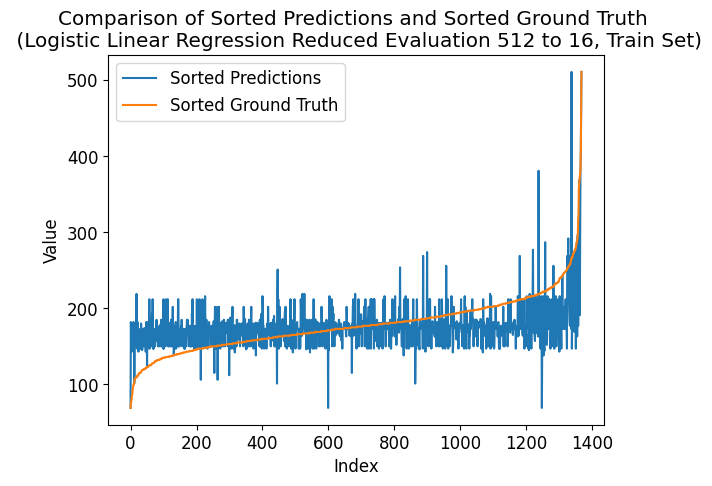

---- ---- ----
class_num = 528
Number of unique elements: 189
[  0.  33.  66.  99. 132. 165. 198. 231. 264. 297. 330. 363. 396. 429.
 462. 495. 528.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.4444117761914987
Coefficient of determination (R-squared score, R2 score): 0.08123249299719892
train eval:
Mean squared error: 1.2646198830409356
Correlation coefficient: 0.4592505980608183
Coefficient of determination (R-squared score, R2 score): 0.11311540959352628


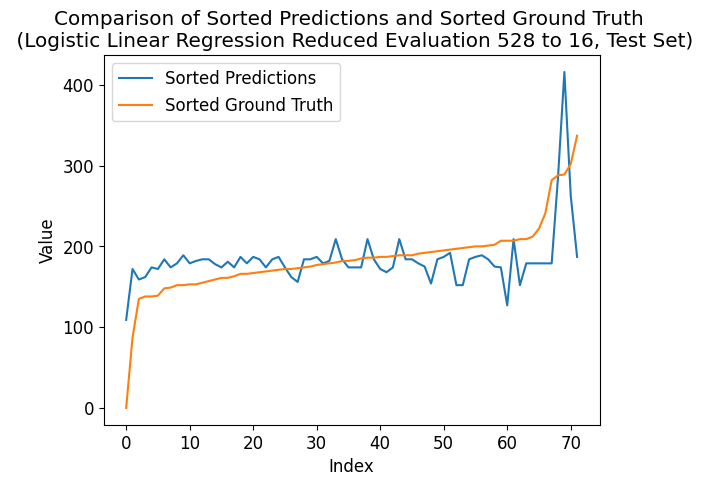

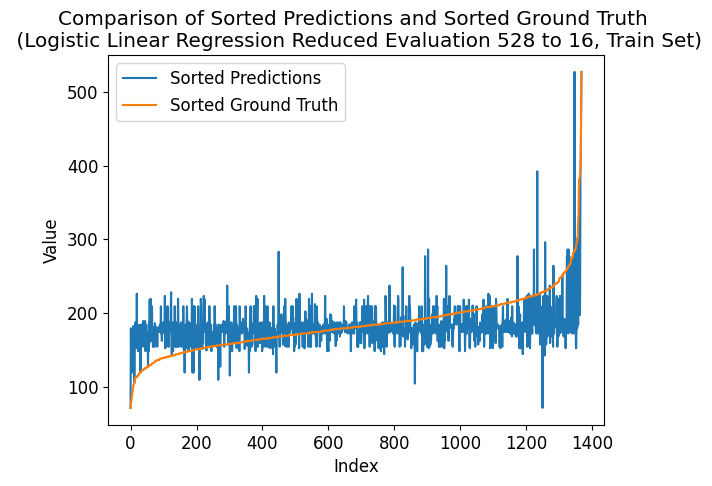

---- ---- ----
class_num = 544
Number of unique elements: 196
[  0.  34.  68. 102. 136. 170. 204. 238. 272. 306. 340. 374. 408. 442.
 476. 510. 544.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.45389174897251083
Coefficient of determination (R-squared score, R2 score): 0.06629318394024275
train eval:
Mean squared error: 1.2711988304093567
Correlation coefficient: 0.4820927468692748
Coefficient of determination (R-squared score, R2 score): 0.10850155912320358


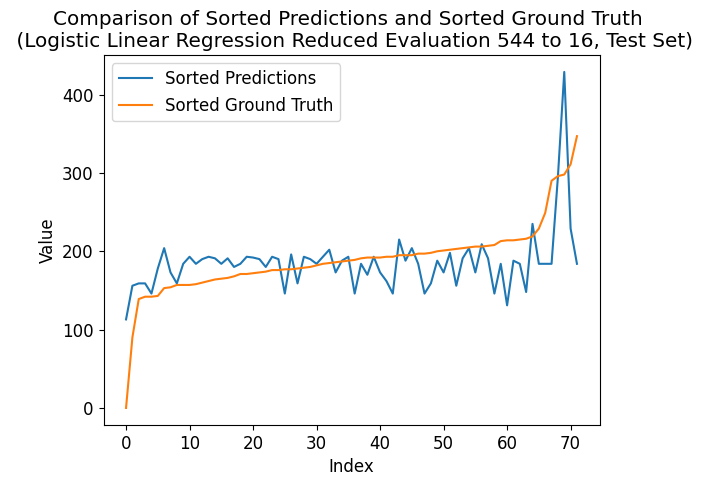

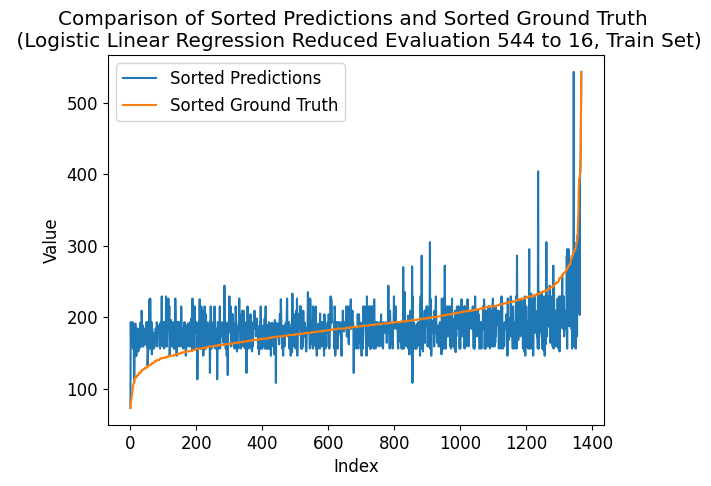

---- ---- ----
class_num = 560
Number of unique elements: 198
[  0.  35.  70. 105. 140. 175. 210. 245. 280. 315. 350. 385. 420. 455.
 490. 525. 560.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.48431579273990755
Coefficient of determination (R-squared score, R2 score): 0.12605042016806722
train eval:
Mean squared error: 1.284356725146199
Correlation coefficient: 0.46850961128253155
Coefficient of determination (R-squared score, R2 score): 0.09927385818255818


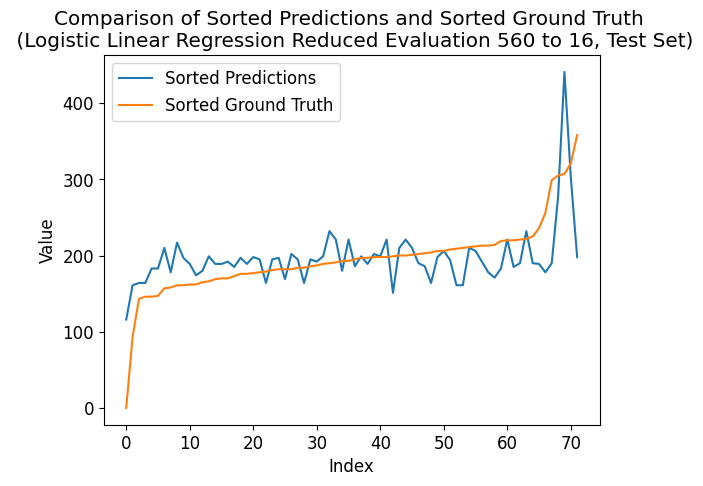

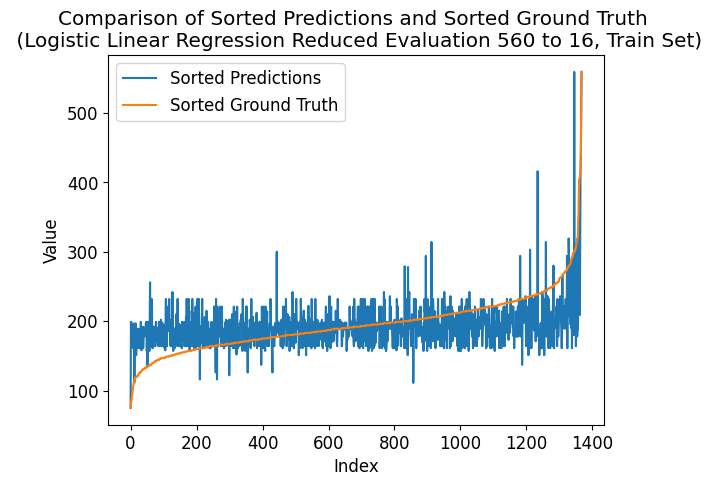

---- ---- ----
class_num = 576
Number of unique elements: 205
[  0.  36.  72. 108. 144. 180. 216. 252. 288. 324. 360. 396. 432. 468.
 504. 540. 576.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.4736868024382108
Coefficient of determination (R-squared score, R2 score): 0.11858076563958919
train eval:
Mean squared error: 1.3011695906432748
Correlation coefficient: 0.47278752687944153
Coefficient of determination (R-squared score, R2 score): 0.08748290698062244


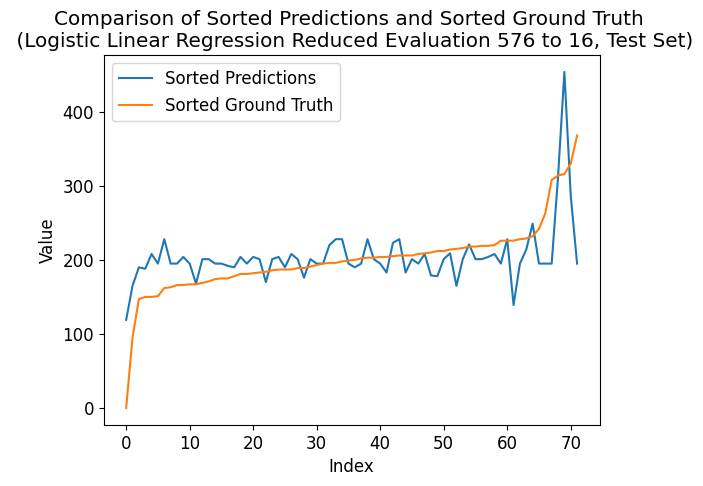

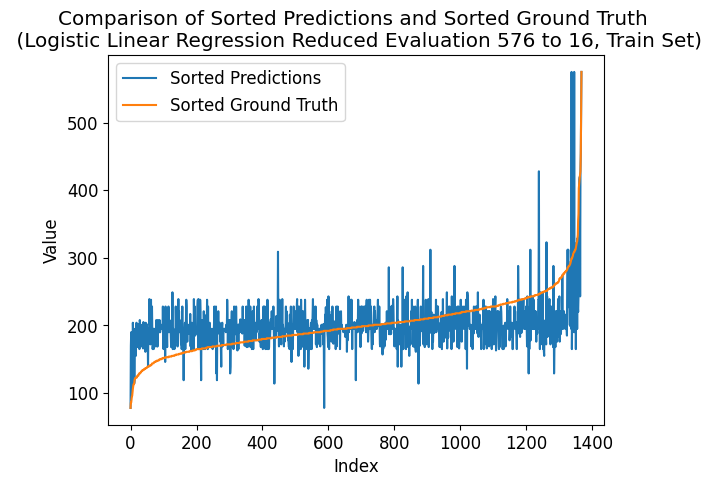

---- ---- ----
class_num = 592
Number of unique elements: 211
[  0.  37.  74. 111. 148. 185. 222. 259. 296. 333. 370. 407. 444. 481.
 518. 555. 592.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.45983338380168265
Coefficient of determination (R-squared score, R2 score): 0.08870214752567696
train eval:
Mean squared error: 1.159356725146199
Correlation coefficient: 0.5111240982192807
Coefficient of determination (R-squared score, R2 score): 0.18693701711868937


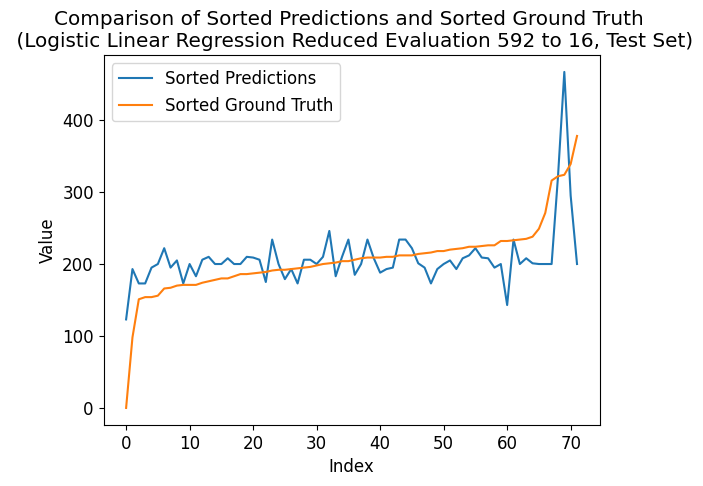

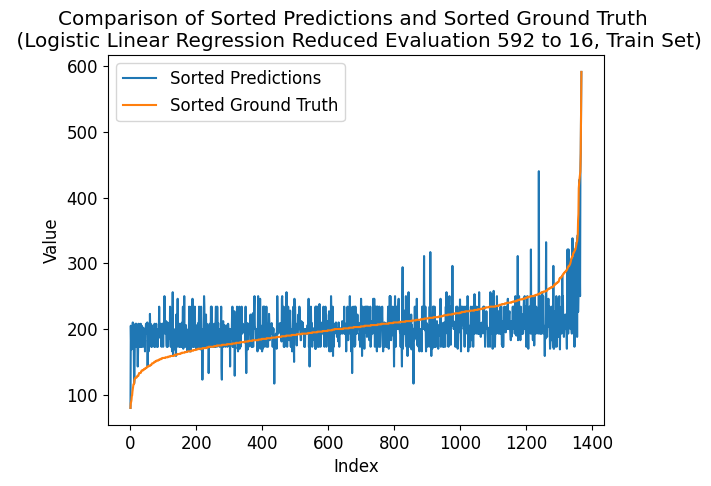

---- ---- ----
class_num = 608
Number of unique elements: 216
[  0.  38.  76. 114. 152. 190. 228. 266. 304. 342. 380. 418. 456. 494.
 532. 570. 608.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.457272157858806
Coefficient of determination (R-squared score, R2 score): 0.07376283846872078
train eval:
Mean squared error: 1.263157894736842
Correlation coefficient: 0.48105522590225747
Coefficient of determination (R-squared score, R2 score): 0.11414070969804246


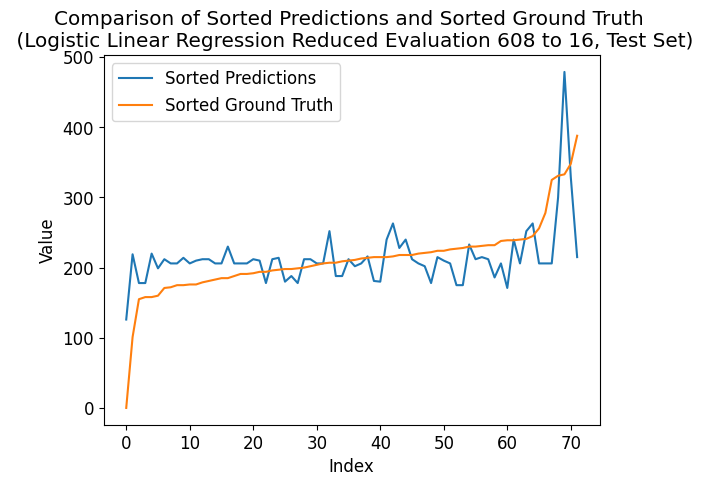

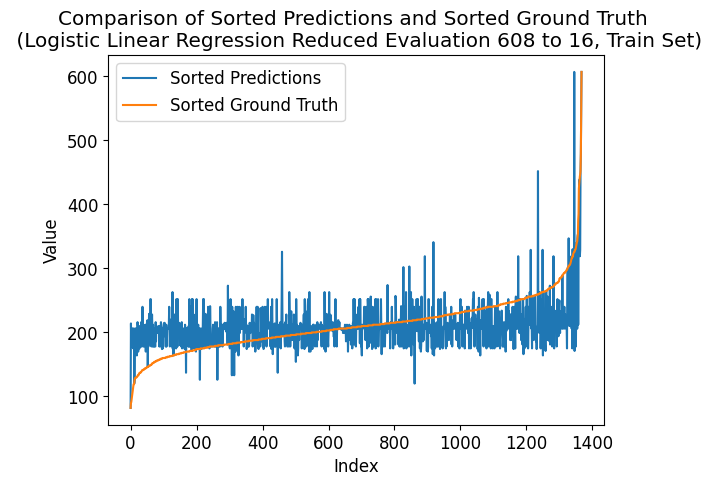

---- ---- ----
class_num = 624
Number of unique elements: 216
[  0.  39.  78. 117. 156. 195. 234. 273. 312. 351. 390. 429. 468. 507.
 546. 585. 624.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.43217654821503354
Coefficient of determination (R-squared score, R2 score): 0.07376283846872078
train eval:
Mean squared error: 1.222953216374269
Correlation coefficient: 0.48830408417944543
Coefficient of determination (R-squared score, R2 score): 0.14233646257223664


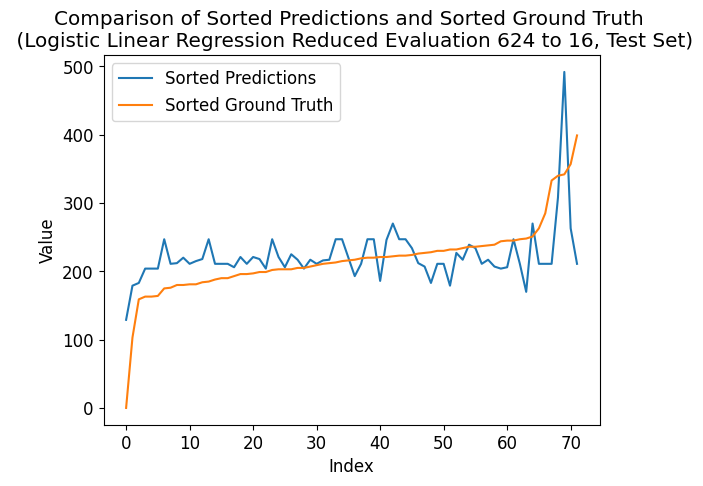

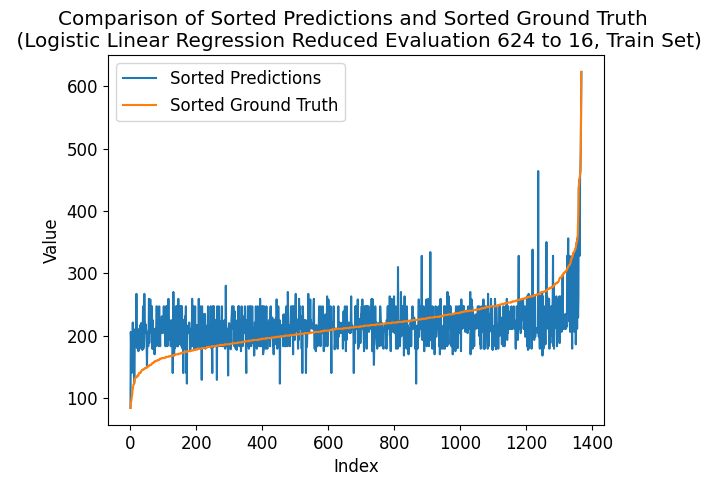

---- ---- ----
class_num = 640
Number of unique elements: 220
[  0.  40.  80. 120. 160. 200. 240. 280. 320. 360. 400. 440. 480. 520.
 560. 600. 640.]
test eval:
Mean squared error: 1.8888888888888888
Correlation coefficient: 0.39760029426461285
Coefficient of determination (R-squared score, R2 score): -0.015873015873015817
train eval:
Mean squared error: 1.273391812865497
Correlation coefficient: 0.46698553728016656
Coefficient of determination (R-squared score, R2 score): 0.10696360896642931


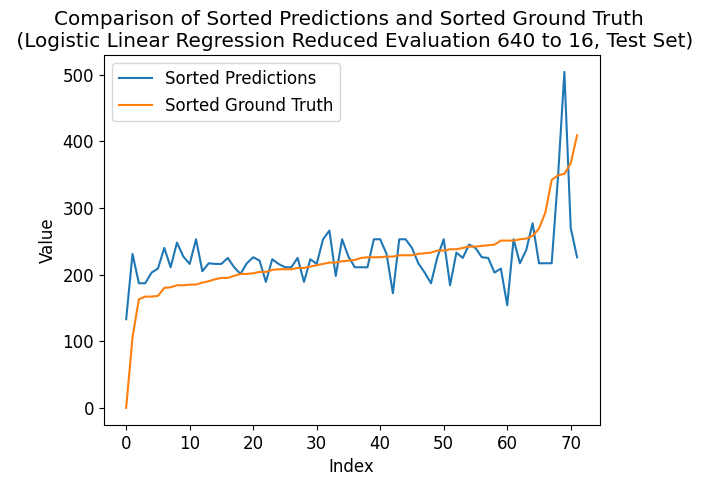

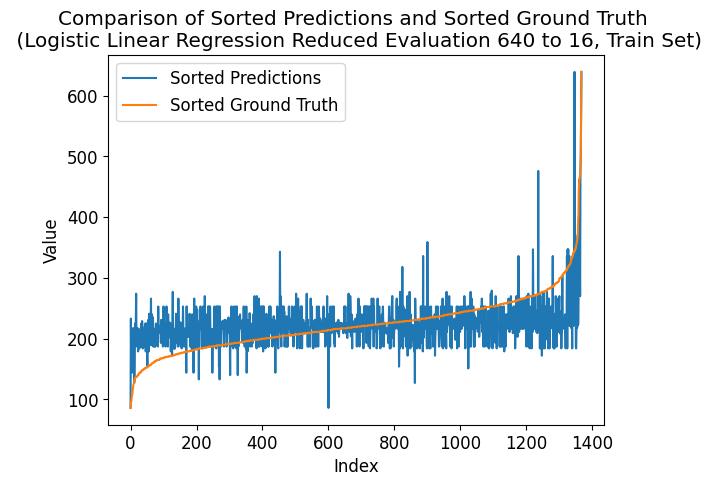

---- ---- ----
class_num = 656
Number of unique elements: 223
[  0.  41.  82. 123. 164. 205. 246. 287. 328. 369. 410. 451. 492. 533.
 574. 615. 656.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.47067041449539393
Coefficient of determination (R-squared score, R2 score): 0.11858076563958919
train eval:
Mean squared error: 1.2339181286549707
Correlation coefficient: 0.48668938380638976
Coefficient of determination (R-squared score, R2 score): 0.13464671178836551


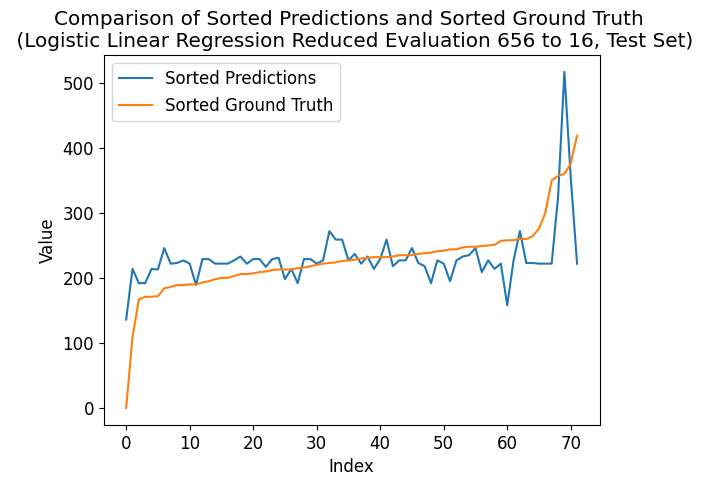

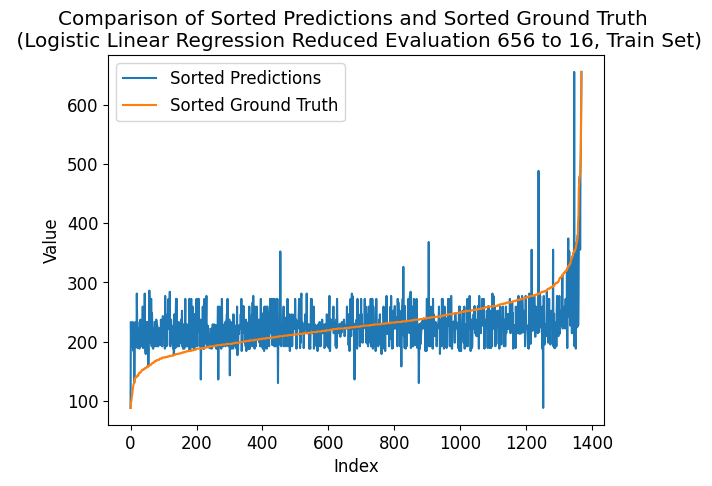

---- ---- ----
class_num = 672
Number of unique elements: 227
[  0.  42.  84. 126. 168. 210. 252. 294. 336. 378. 420. 462. 504. 546.
 588. 630. 672.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.46085127853657204
Coefficient of determination (R-squared score, R2 score): 0.09617180205415499
train eval:
Mean squared error: 1.202485380116959
Correlation coefficient: 0.5021835032786801
Coefficient of determination (R-squared score, R2 score): 0.15669066403546283


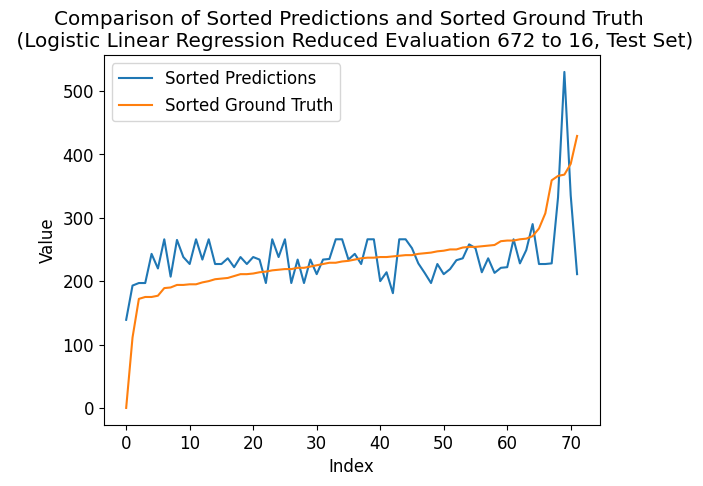

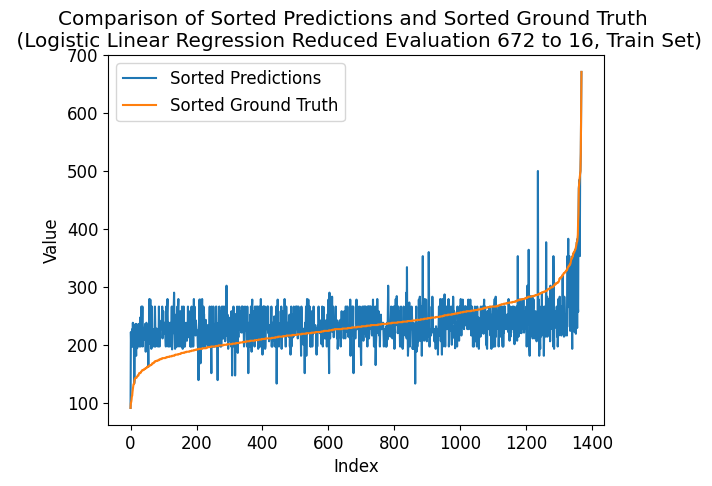

---- ---- ----
class_num = 688
Number of unique elements: 230
[  0.  43.  86. 129. 172. 215. 258. 301. 344. 387. 430. 473. 516. 559.
 602. 645. 688.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.4292277404851313
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.239766081871345
Correlation coefficient: 0.4870438032788566
Coefficient of determination (R-squared score, R2 score): 0.1305455113703009


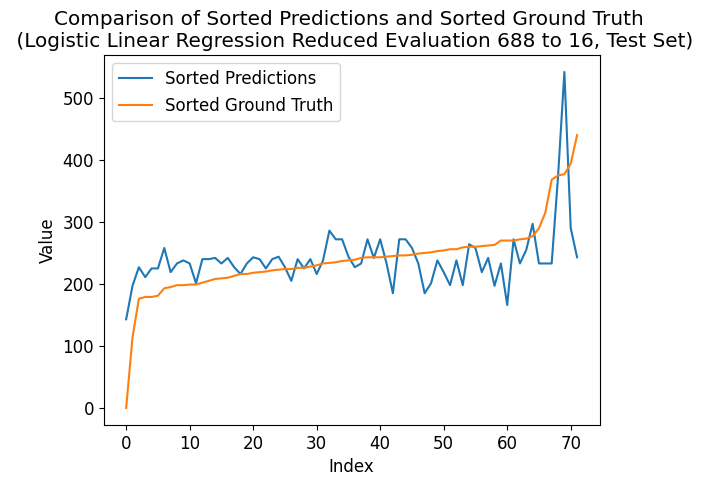

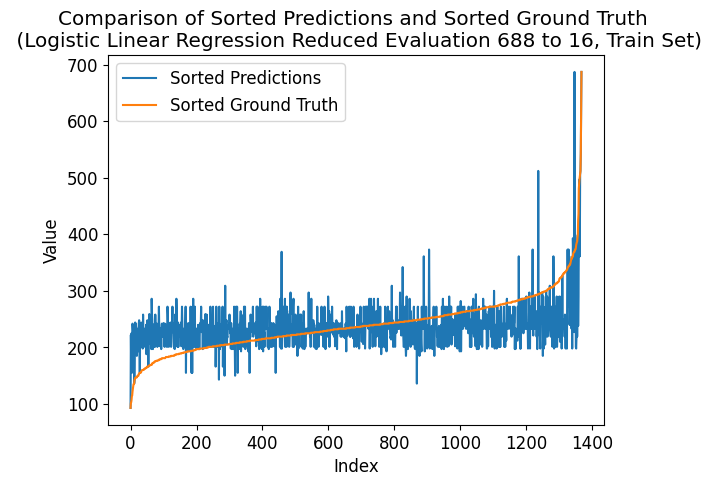

---- ---- ----
class_num = 704
Number of unique elements: 239
[  0.  44.  88. 132. 176. 220. 264. 308. 352. 396. 440. 484. 528. 572.
 616. 660. 704.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.4015664186487819
Coefficient of determination (R-squared score, R2 score): 0.02147525676937445
train eval:
Mean squared error: 1.1842105263157894
Correlation coefficient: 0.5091227863767976
Coefficient of determination (R-squared score, R2 score): 0.16950691534191475


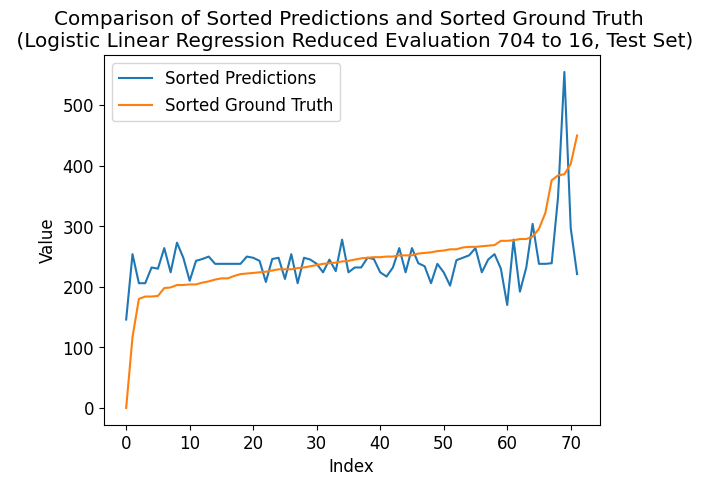

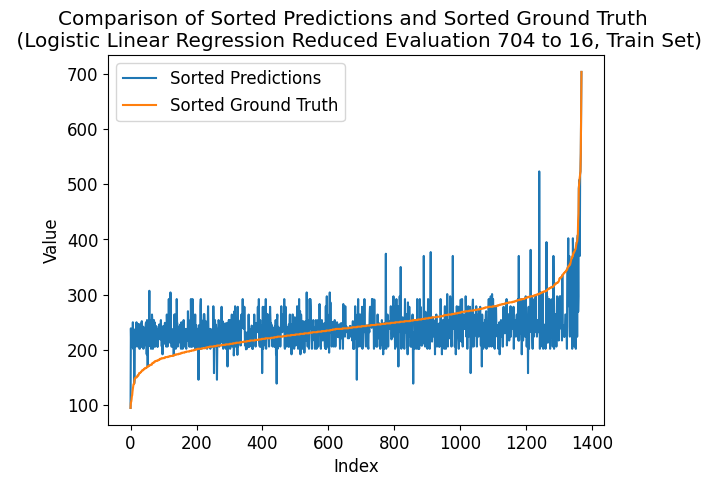

---- ---- ----
class_num = 720
Number of unique elements: 240
[  0.  45.  90. 135. 180. 225. 270. 315. 360. 405. 450. 495. 540. 585.
 630. 675. 720.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.4078455240688131
Coefficient of determination (R-squared score, R2 score): 0.028944911297852483
train eval:
Mean squared error: 1.3092105263157894
Correlation coefficient: 0.45743224601561033
Coefficient of determination (R-squared score, R2 score): 0.08184375640578356


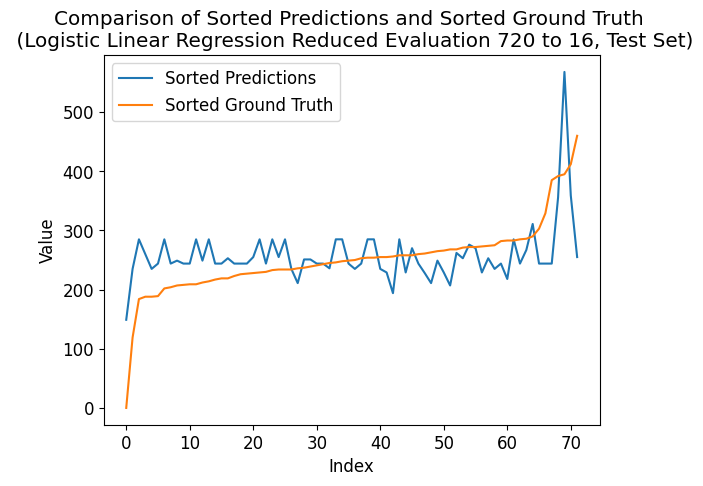

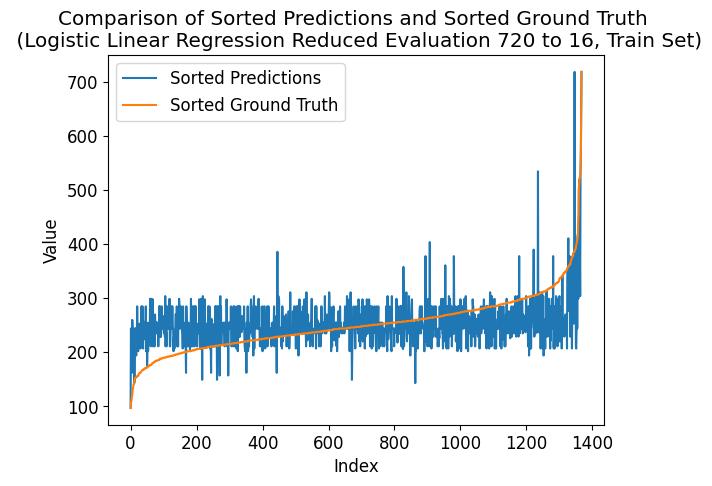

---- ---- ----
class_num = 736
Number of unique elements: 241
[  0.  46.  92. 138. 184. 230. 276. 322. 368. 414. 460. 506. 552. 598.
 644. 690. 736.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.4879093790533349
Coefficient of determination (R-squared score, R2 score): 0.15592903828197946
train eval:
Mean squared error: 1.2046783625730995
Correlation coefficient: 0.49265513537275685
Coefficient of determination (R-squared score, R2 score): 0.15515271387868856


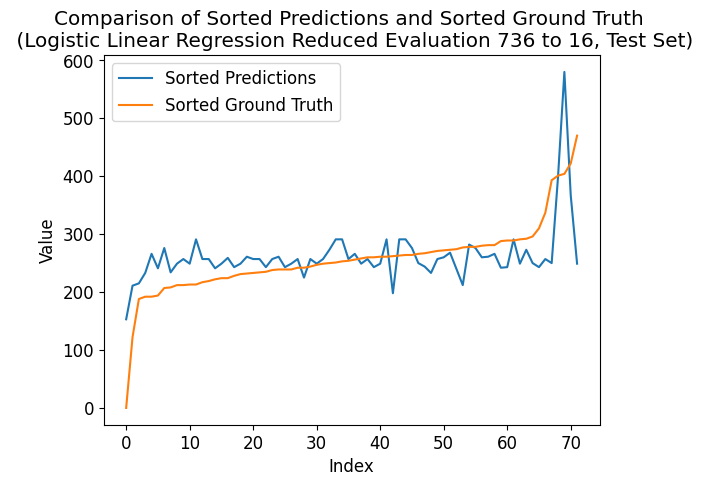

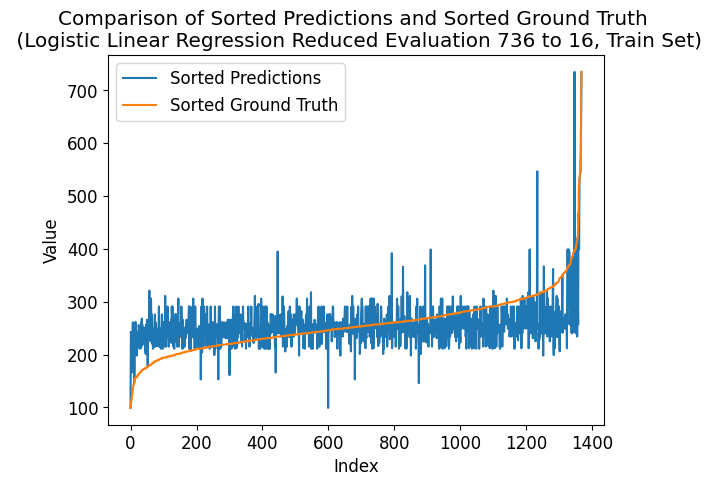

---- ---- ----
class_num = 752
Number of unique elements: 249
[  0.  47.  94. 141. 188. 235. 282. 329. 376. 423. 470. 517. 564. 611.
 658. 705. 752.]
test eval:
Mean squared error: 1.5833333333333333
Correlation coefficient: 0.4779313399742912
Coefficient of determination (R-squared score, R2 score): 0.14845938375350143
train eval:
Mean squared error: 1.2032163742690059
Correlation coefficient: 0.5106365275691869
Coefficient of determination (R-squared score, R2 score): 0.15617801398320474


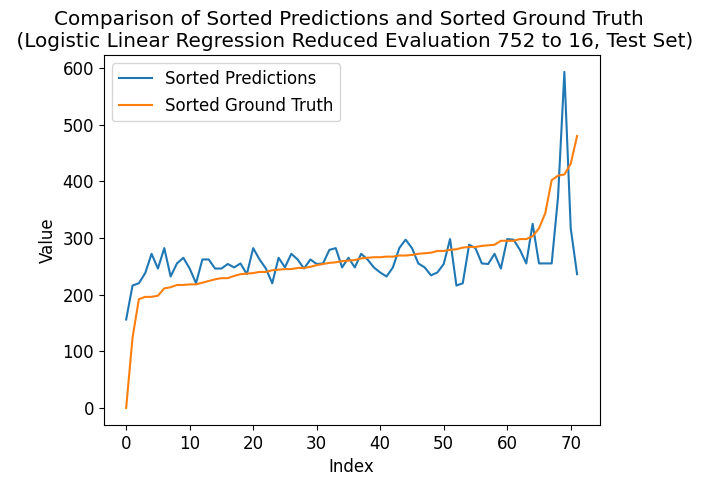

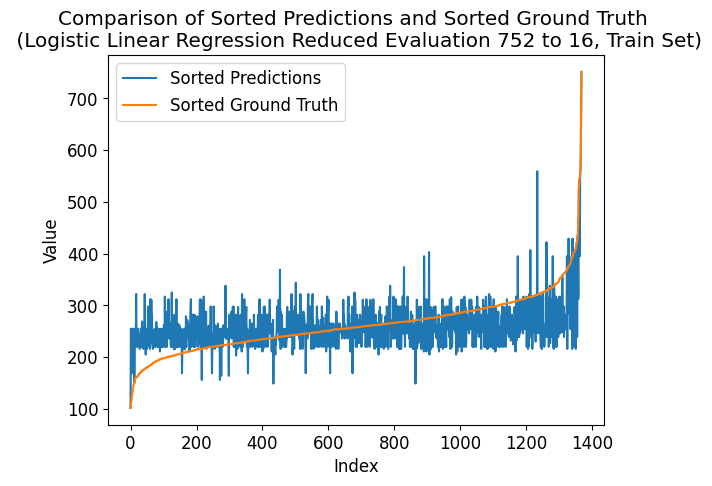

---- ---- ----
class_num = 768
Number of unique elements: 255
[  0.  48.  96. 144. 192. 240. 288. 336. 384. 432. 480. 528. 576. 624.
 672. 720. 768.]
test eval:
Mean squared error: 1.8888888888888888
Correlation coefficient: 0.39529536502249907
Coefficient of determination (R-squared score, R2 score): -0.015873015873015817
train eval:
Mean squared error: 1.2580409356725146
Correlation coefficient: 0.49092085211589764
Coefficient of determination (R-squared score, R2 score): 0.11772926006384898


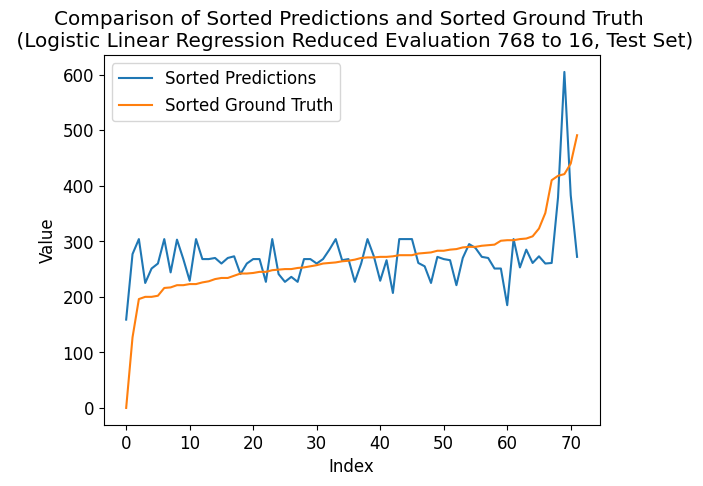

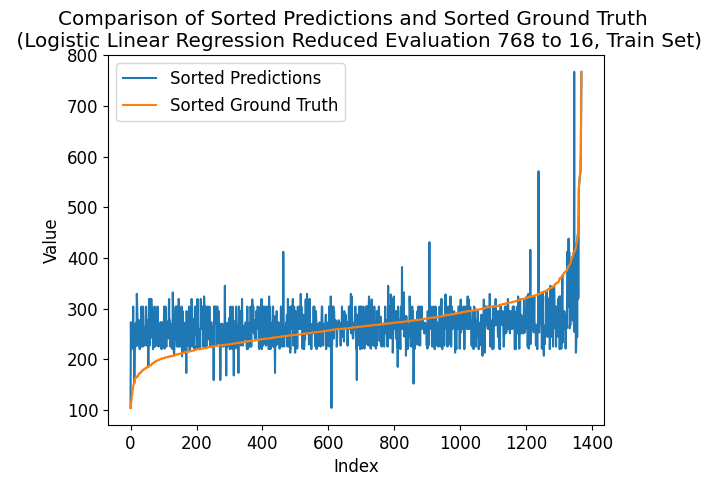

---- ---- ----
class_num = 784
Number of unique elements: 254
[  0.  49.  98. 147. 196. 245. 294. 343. 392. 441. 490. 539. 588. 637.
 686. 735. 784.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.4514461504031727
Coefficient of determination (R-squared score, R2 score): 0.08123249299719892
train eval:
Mean squared error: 1.1798245614035088
Correlation coefficient: 0.4986158100222583
Coefficient of determination (R-squared score, R2 score): 0.17258281565546318


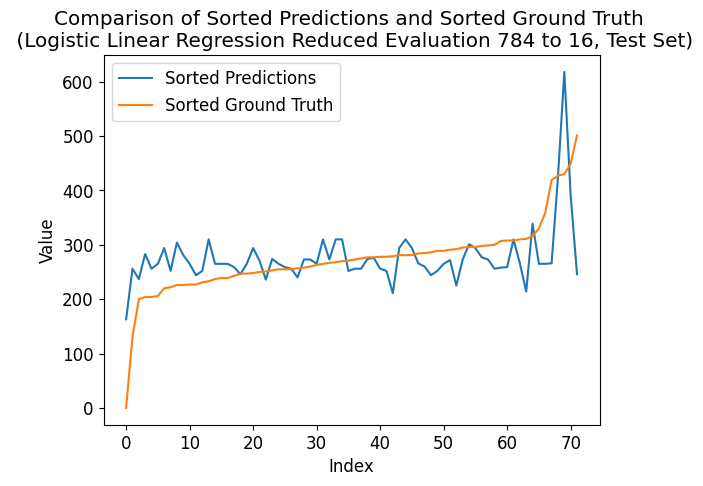

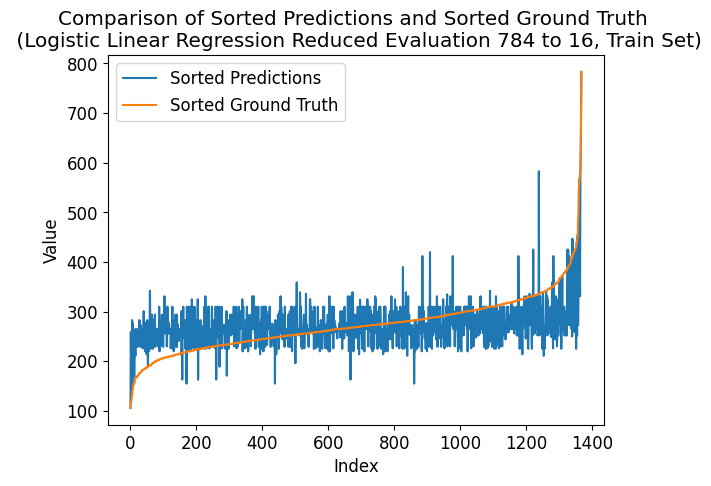

---- ---- ----
class_num = 800
Number of unique elements: 254
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600. 650.
 700. 750. 800.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.41649656391752043
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
train eval:
Mean squared error: 1.1820175438596492
Correlation coefficient: 0.5136147793934669
Coefficient of determination (R-squared score, R2 score): 0.17104486549868902


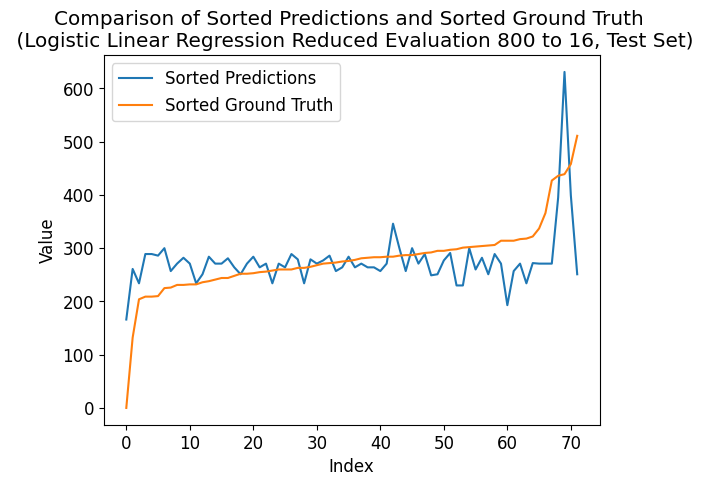

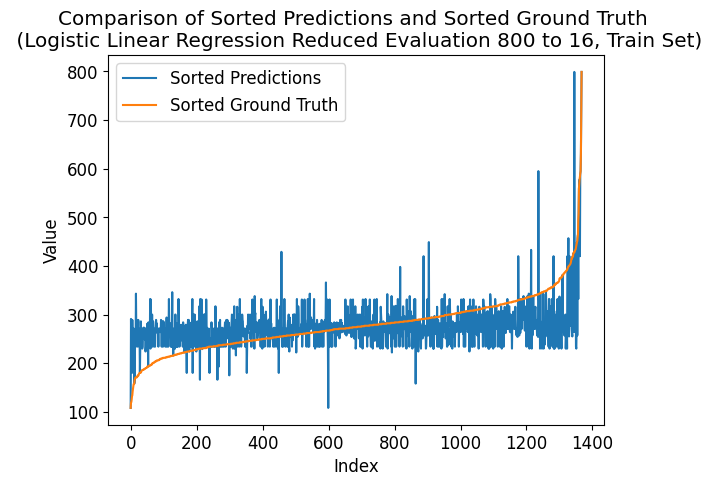

---- ---- ----
class_num = 816
Number of unique elements: 264
[  0.  51. 102. 153. 204. 255. 306. 357. 408. 459. 510. 561. 612. 663.
 714. 765. 816.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.40116685879758923
Coefficient of determination (R-squared score, R2 score): -0.0009337068160597539
train eval:
Mean squared error: 1.222953216374269
Correlation coefficient: 0.49884293549266023
Coefficient of determination (R-squared score, R2 score): 0.14233646257223664


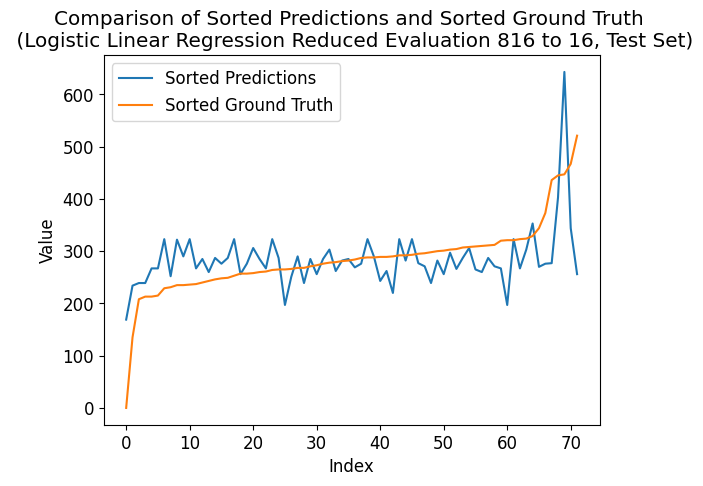

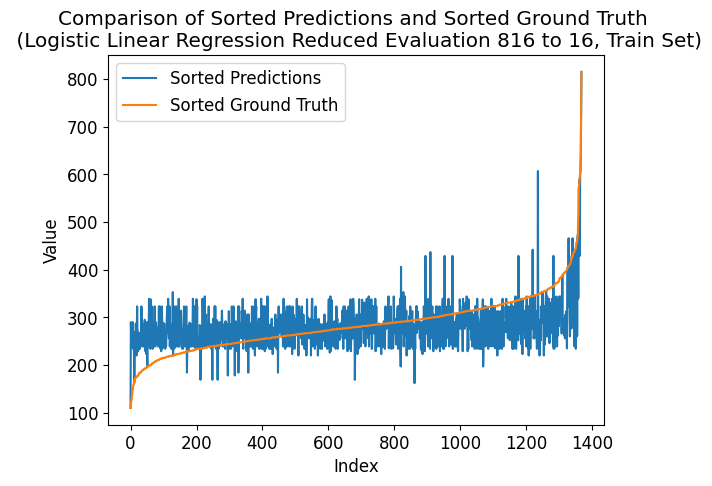

---- ---- ----
class_num = 832
Number of unique elements: 268
[  0.  52. 104. 156. 208. 260. 312. 364. 416. 468. 520. 572. 624. 676.
 728. 780. 832.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.4598778678854598
Coefficient of determination (R-squared score, R2 score): 0.10364145658263302
train eval:
Mean squared error: 1.2587719298245614
Correlation coefficient: 0.4911647502658023
Coefficient of determination (R-squared score, R2 score): 0.1172166100115909


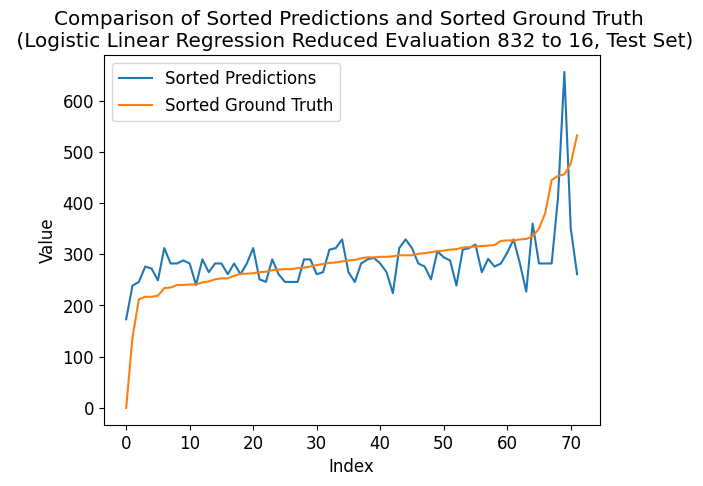

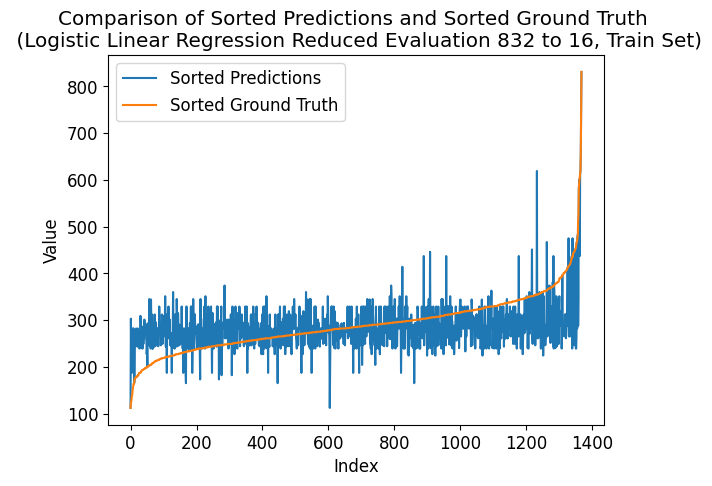

---- ---- ----
class_num = 848
Number of unique elements: 268
[  0.  53. 106. 159. 212. 265. 318. 371. 424. 477. 530. 583. 636. 689.
 742. 795. 848.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.48623577949191543
Coefficient of determination (R-squared score, R2 score): 0.1409897292250234
train eval:
Mean squared error: 1.2171052631578947
Correlation coefficient: 0.507322494722587
Coefficient of determination (R-squared score, R2 score): 0.14643766299030125


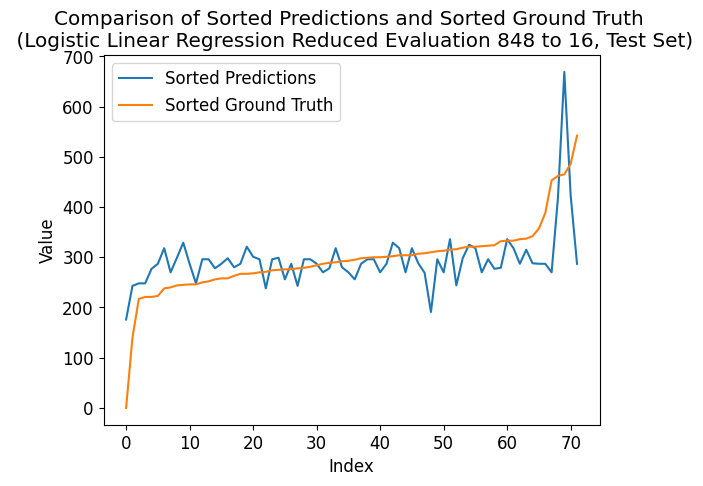

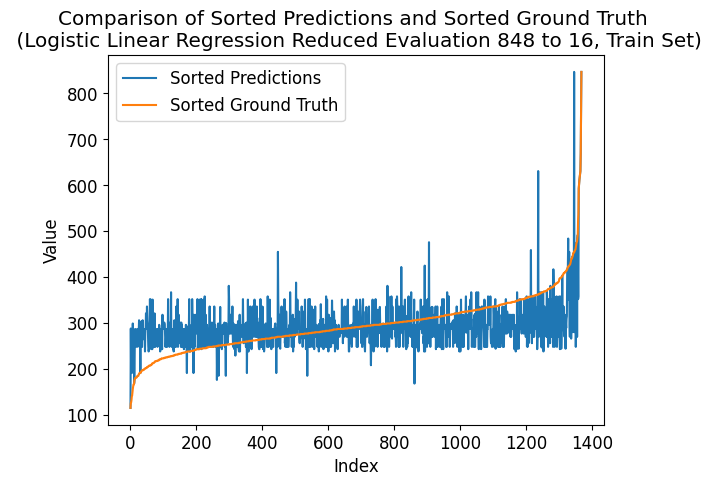

---- ---- ----
class_num = 864
Number of unique elements: 271
[  0.  54. 108. 162. 216. 270. 324. 378. 432. 486. 540. 594. 648. 702.
 756. 810. 864.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.4092964857152734
Coefficient of determination (R-squared score, R2 score): 0.02147525676937445
train eval:
Mean squared error: 1.2163742690058479
Correlation coefficient: 0.49532048607072776
Coefficient of determination (R-squared score, R2 score): 0.14695031304255934


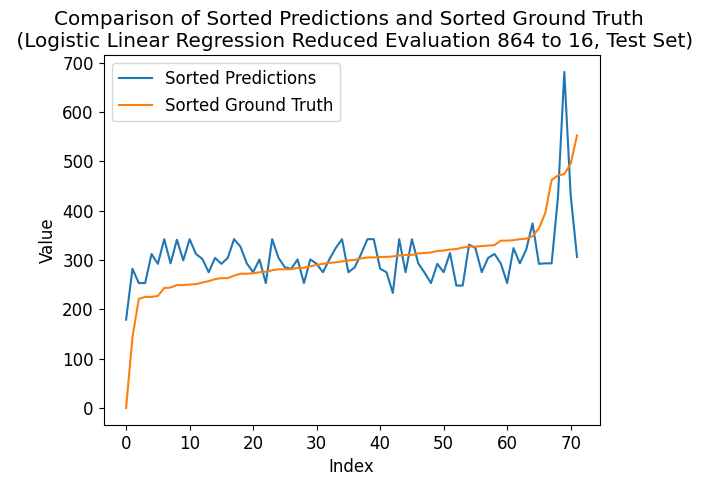

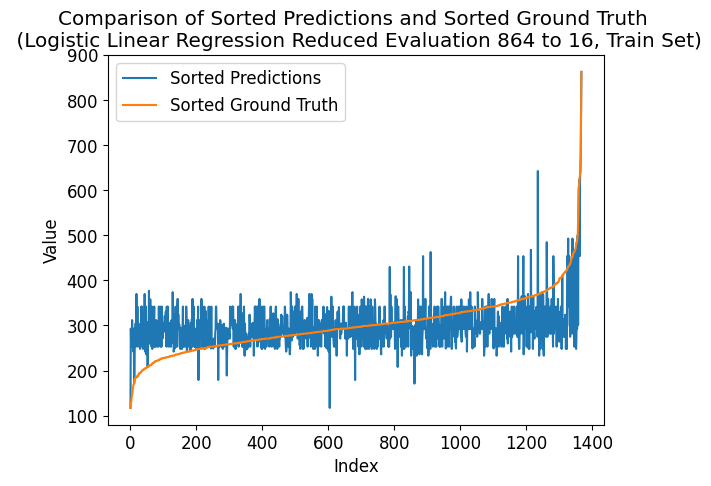

---- ---- ----
class_num = 880
Number of unique elements: 277
[  0.  55. 110. 165. 220. 275. 330. 385. 440. 495. 550. 605. 660. 715.
 770. 825. 880.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.445963575868674
Coefficient of determination (R-squared score, R2 score): 0.09617180205415499
train eval:
Mean squared error: 1.2288011695906433
Correlation coefficient: 0.4960515437335157
Coefficient of determination (R-squared score, R2 score): 0.13823526215417203


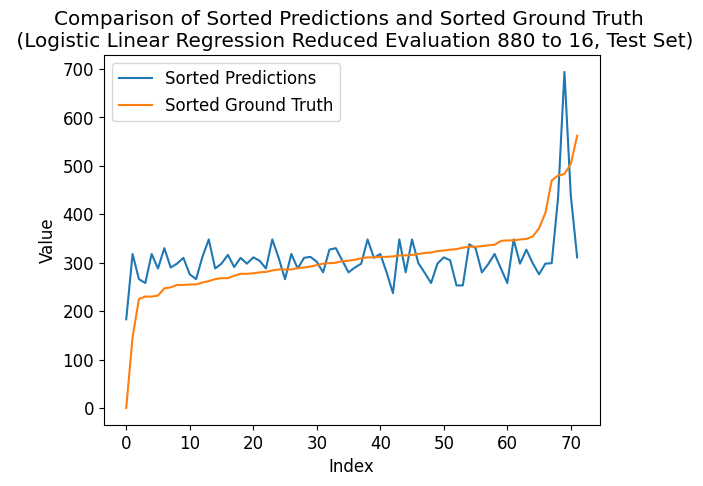

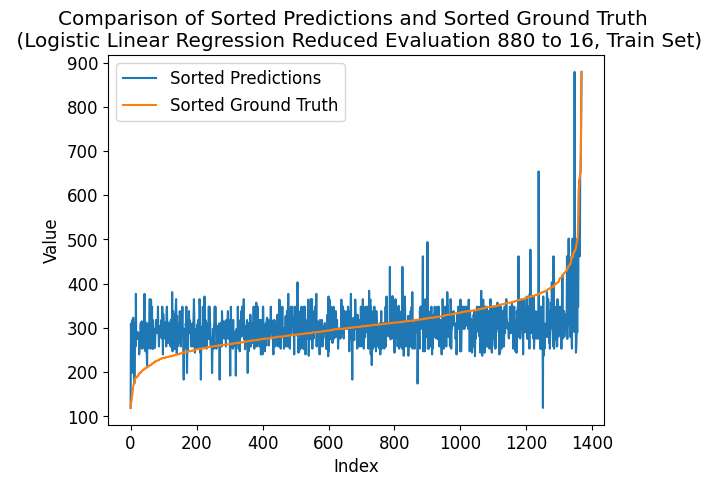

---- ---- ----
class_num = 896
Number of unique elements: 277
[  0.  56. 112. 168. 224. 280. 336. 392. 448. 504. 560. 616. 672. 728.
 784. 840. 896.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.44557269775520997
Coefficient of determination (R-squared score, R2 score): 0.08123249299719892
train eval:
Mean squared error: 1.212719298245614
Correlation coefficient: 0.4852675326800607
Coefficient of determination (R-squared score, R2 score): 0.1495135633038498


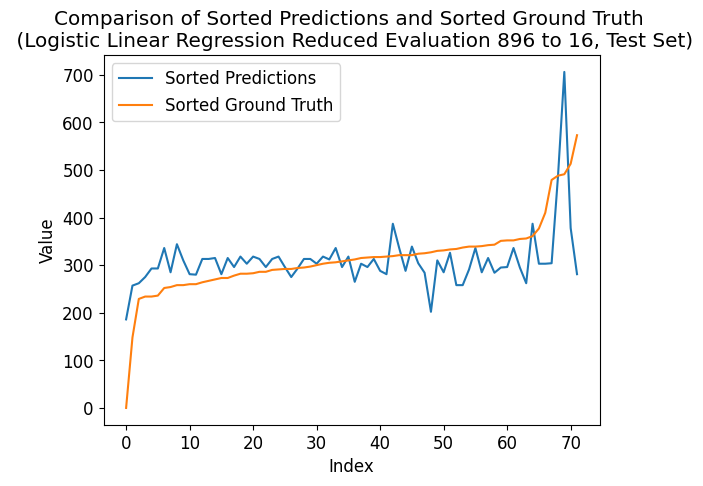

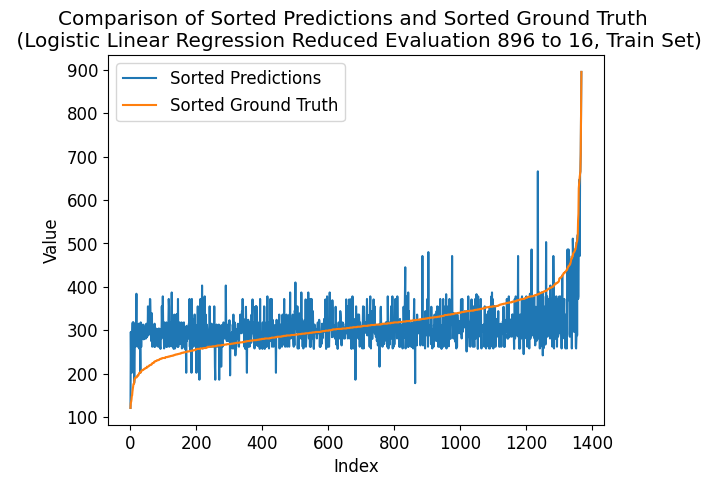

---- ---- ----
class_num = 912
Number of unique elements: 284
[  0.  57. 114. 171. 228. 285. 342. 399. 456. 513. 570. 627. 684. 741.
 798. 855. 912.]
test eval:
Mean squared error: 2.0694444444444446
Correlation coefficient: 0.32437417455848905
Coefficient of determination (R-squared score, R2 score): -0.11297852474323067
train eval:
Mean squared error: 1.2178362573099415
Correlation coefficient: 0.4961835687110365
Coefficient of determination (R-squared score, R2 score): 0.14592501293804316


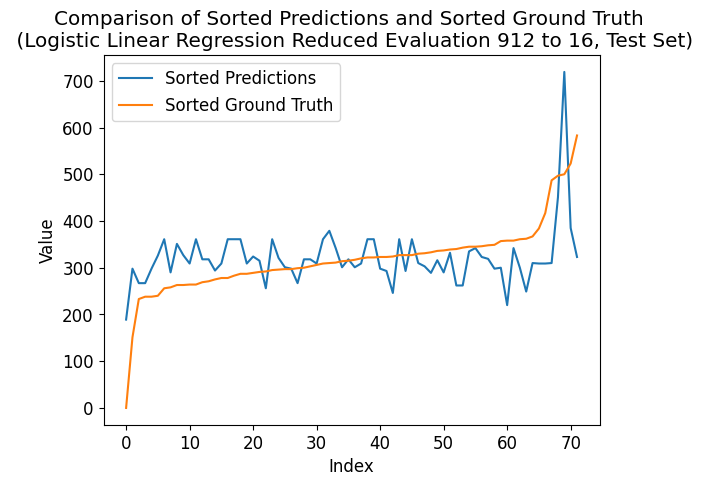

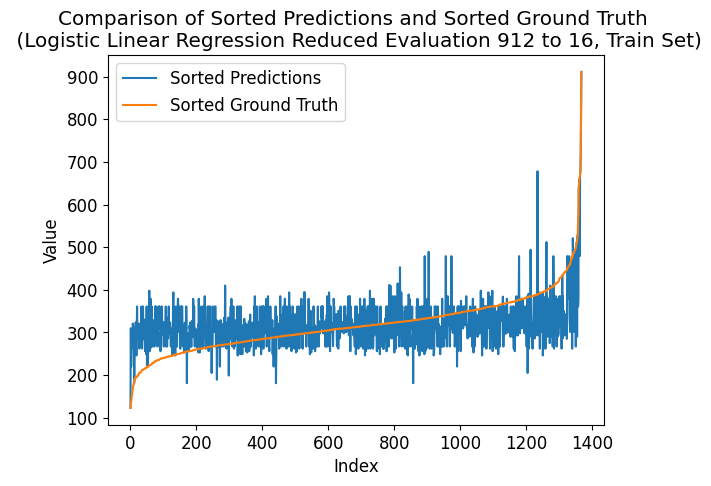

---- ---- ----
class_num = 928
Number of unique elements: 290
[  0.  58. 116. 174. 232. 290. 348. 406. 464. 522. 580. 638. 696. 754.
 812. 870. 928.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.4278514028529646
Coefficient of determination (R-squared score, R2 score): 0.043884220354808545
train eval:
Mean squared error: 1.1871345029239766
Correlation coefficient: 0.5127393612161735
Coefficient of determination (R-squared score, R2 score): 0.1674563151328825


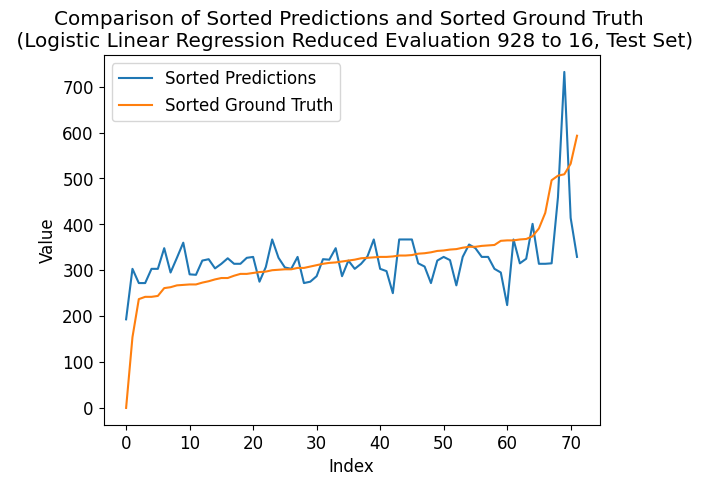

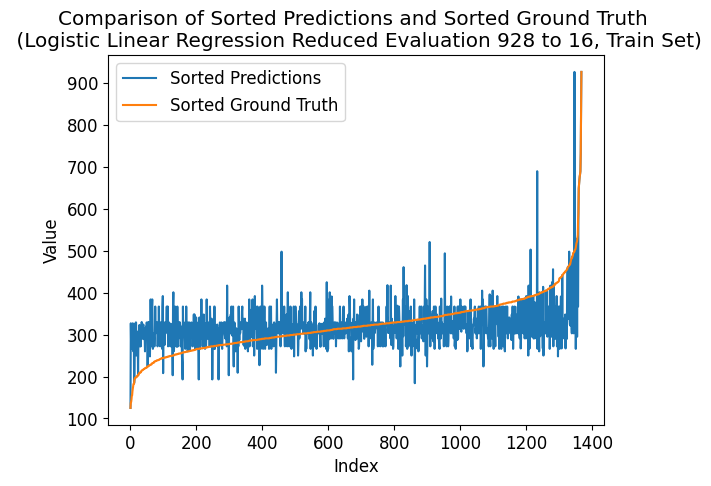

---- ---- ----
class_num = 944
Number of unique elements: 292
[  0.  59. 118. 177. 236. 295. 354. 413. 472. 531. 590. 649. 708. 767.
 826. 885. 944.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.4218517909543616
Coefficient of determination (R-squared score, R2 score): 0.043884220354808545
train eval:
Mean squared error: 1.215643274853801
Correlation coefficient: 0.48843955167584124
Coefficient of determination (R-squared score, R2 score): 0.14746296309481743


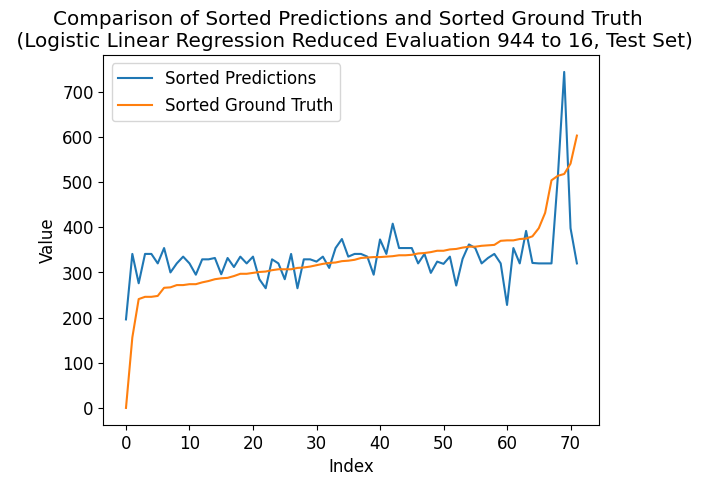

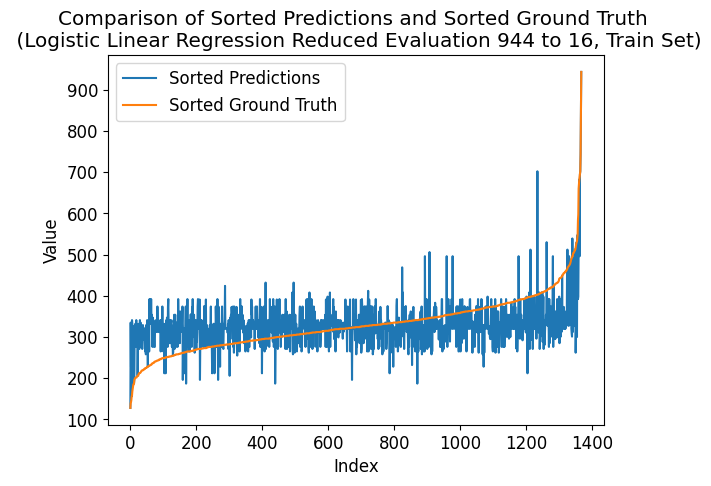

---- ---- ----
class_num = 960
Number of unique elements: 292
[  0.  60. 120. 180. 240. 300. 360. 420. 480. 540. 600. 660. 720. 780.
 840. 900. 960.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.3798391616545401
Coefficient of determination (R-squared score, R2 score): -0.045751633986928164
train eval:
Mean squared error: 1.2412280701754386
Correlation coefficient: 0.4907642318916595
Coefficient of determination (R-squared score, R2 score): 0.12952021126578472


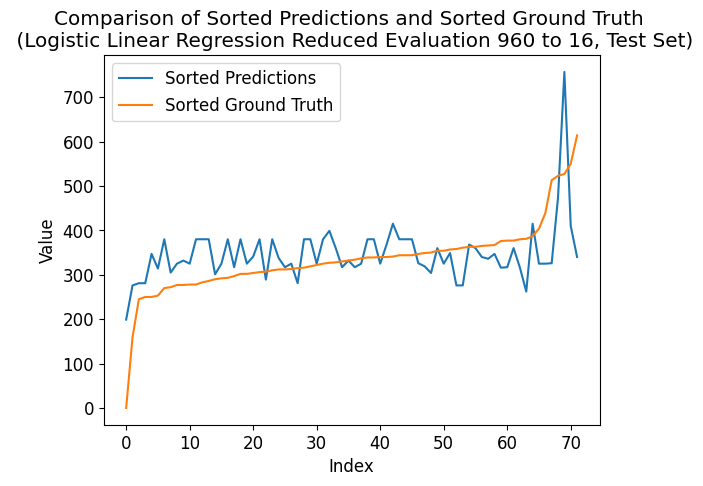

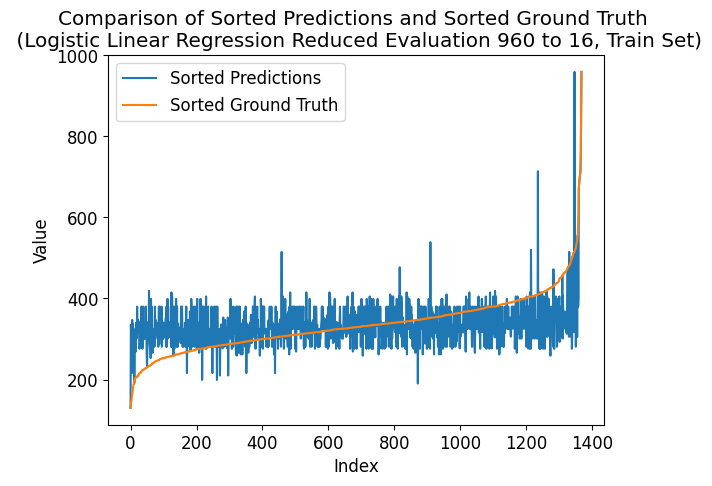

---- ---- ----
class_num = 976
Number of unique elements: 300
[  0.  61. 122. 183. 244. 305. 366. 427. 488. 549. 610. 671. 732. 793.
 854. 915. 976.]
test eval:
Mean squared error: 1.6111111111111112
Correlation coefficient: 0.4643180308016195
Coefficient of determination (R-squared score, R2 score): 0.13352007469654525
train eval:
Mean squared error: 1.1717836257309941
Correlation coefficient: 0.5032131755549937
Coefficient of determination (R-squared score, R2 score): 0.17822196623030206


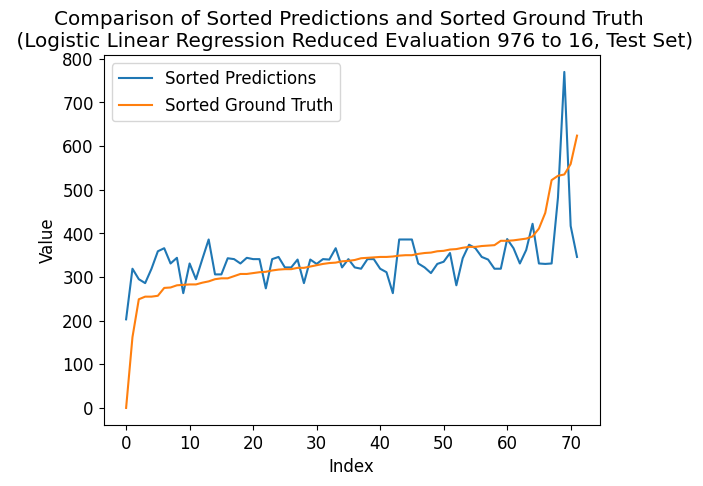

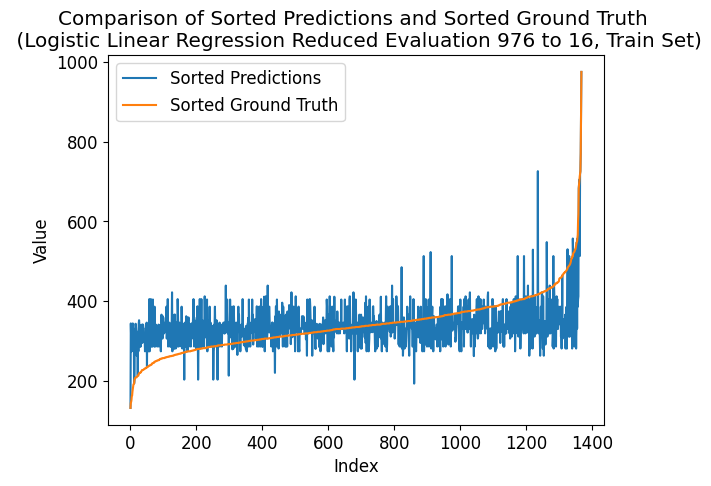

---- ---- ----
class_num = 992
Number of unique elements: 302
[  0.  62. 124. 186. 248. 310. 372. 434. 496. 558. 620. 682. 744. 806.
 868. 930. 992.]
test eval:
Mean squared error: 1.75
Correlation coefficient: 0.4425810719356941
Coefficient of determination (R-squared score, R2 score): 0.05882352941176472
train eval:
Mean squared error: 1.2141812865497077
Correlation coefficient: 0.4924229665220838
Coefficient of determination (R-squared score, R2 score): 0.14848826319933361


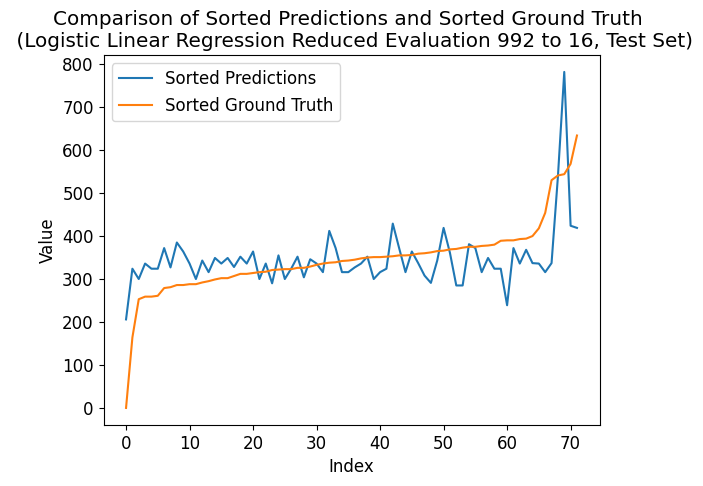

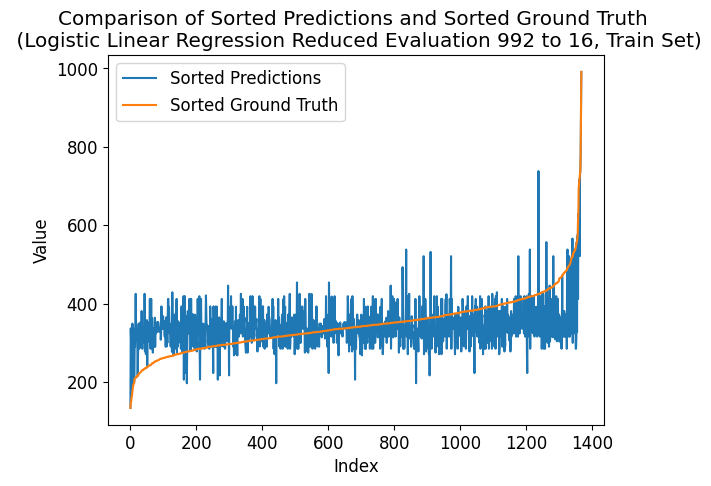

---- ---- ----
class_num = 1008
Number of unique elements: 306
[   0.   63.  126.  189.  252.  315.  378.  441.  504.  567.  630.  693.
  756.  819.  882.  945. 1008.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.3949865893448851
Coefficient of determination (R-squared score, R2 score): -0.023342670401493848
train eval:
Mean squared error: 1.277046783625731
Correlation coefficient: 0.49003852921054897
Coefficient of determination (R-squared score, R2 score): 0.10440035870513897


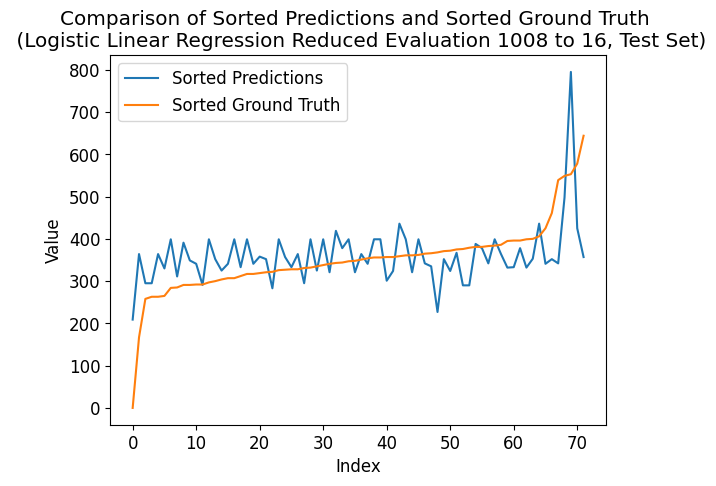

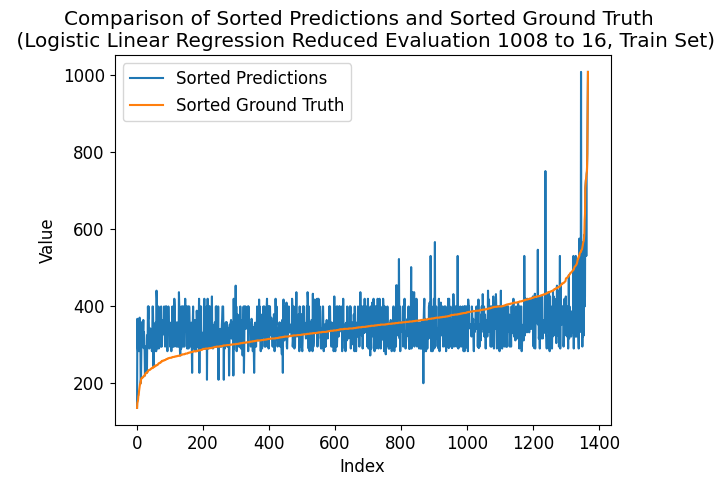

---- ---- ----
class_num = 1024
Number of unique elements: 304
[   0.   64.  128.  192.  256.  320.  384.  448.  512.  576.  640.  704.
  768.  832.  896.  960. 1024.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.3889222341312982
Coefficient of determination (R-squared score, R2 score): -0.023342670401493848
train eval:
Mean squared error: 1.2185672514619883
Correlation coefficient: 0.49090513620356135
Coefficient of determination (R-squared score, R2 score): 0.14541236288578518


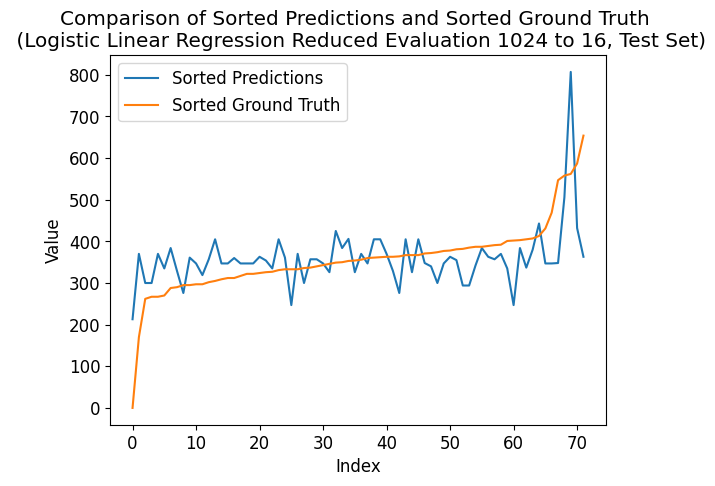

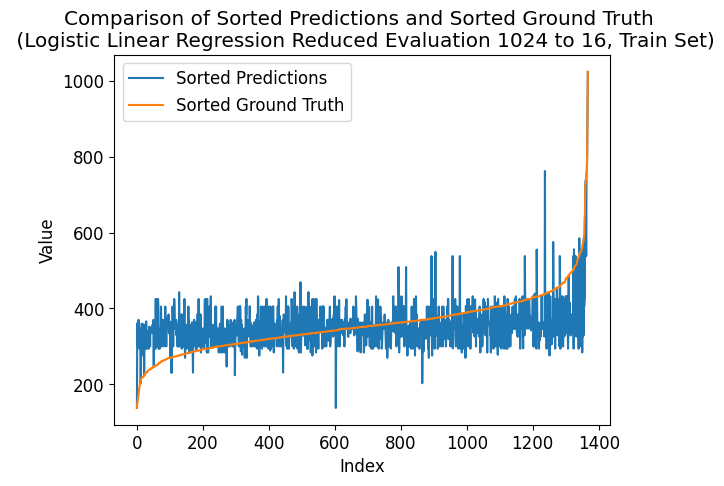

---- ---- ----
class_num = 1040
Number of unique elements: 312
[   0.   65.  130.  195.  260.  325.  390.  455.  520.  585.  650.  715.
  780.  845.  910.  975. 1040.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.3748621129653715
Coefficient of determination (R-squared score, R2 score): -0.045751633986928164
train eval:
Mean squared error: 1.2492690058479532
Correlation coefficient: 0.5059758217555854
Coefficient of determination (R-squared score, R2 score): 0.12388106069094584


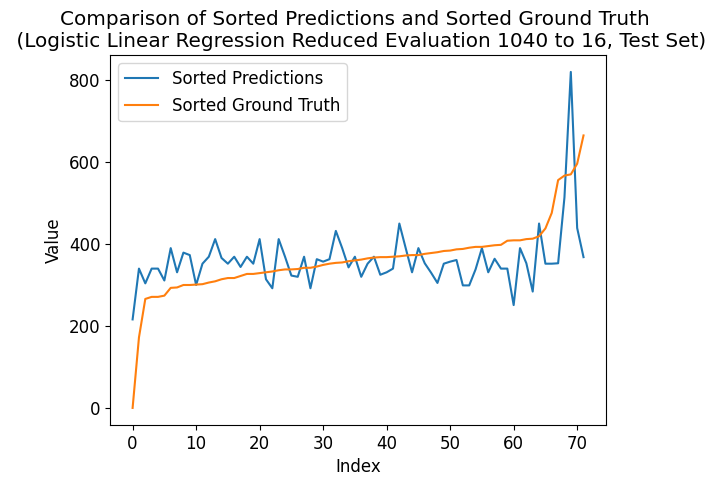

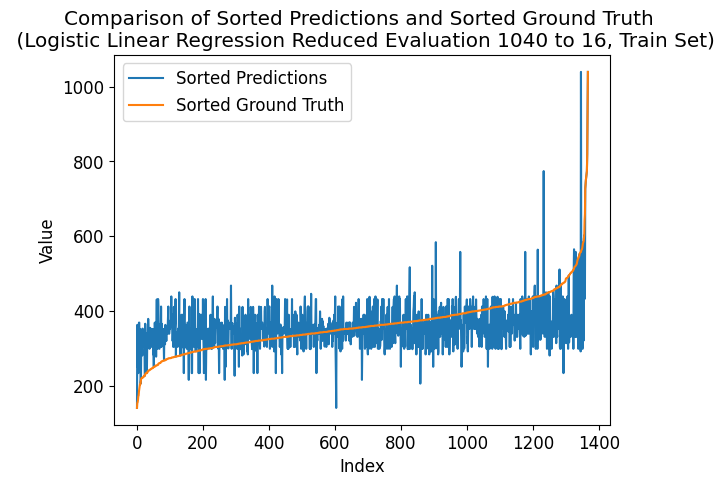

---- ---- ----
class_num = 1056
Number of unique elements: 316
[   0.   66.  132.  198.  264.  330.  396.  462.  528.  594.  660.  726.
  792.  858.  924.  990. 1056.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.3864606549319353
Coefficient of determination (R-squared score, R2 score): -0.03828197945845013
train eval:
Mean squared error: 1.2244152046783625
Correlation coefficient: 0.4953468680585596
Coefficient of determination (R-squared score, R2 score): 0.14131116246772057


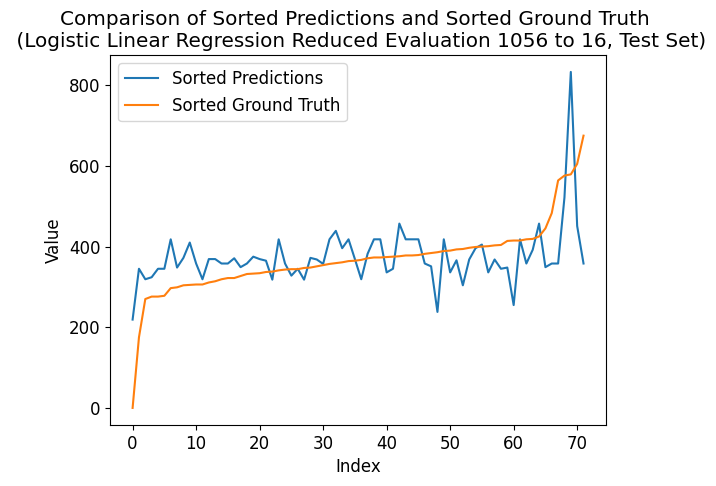

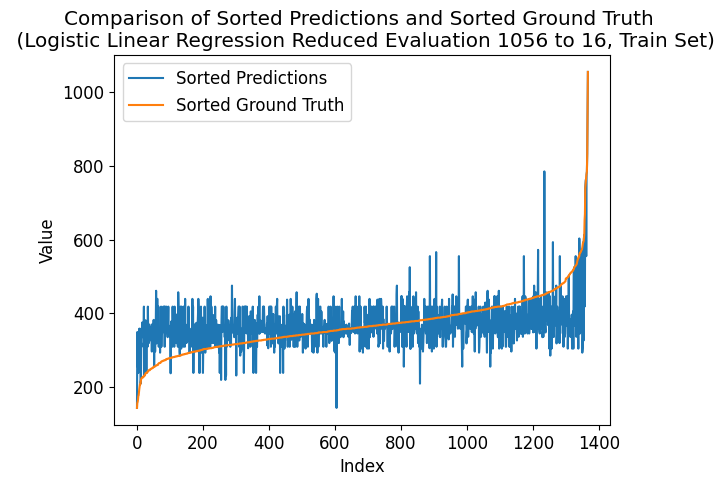

---- ---- ----
class_num = 1072
Number of unique elements: 320
[   0.   67.  134.  201.  268.  335.  402.  469.  536.  603.  670.  737.
  804.  871.  938. 1005. 1072.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.41694524488161216
Coefficient of determination (R-squared score, R2 score): 0.043884220354808545
train eval:
Mean squared error: 1.1812865497076024
Correlation coefficient: 0.5099181789430145
Coefficient of determination (R-squared score, R2 score): 0.17155751555094712


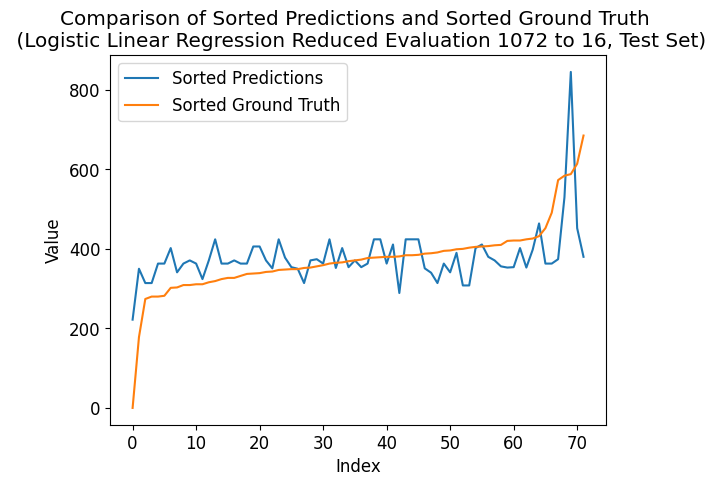

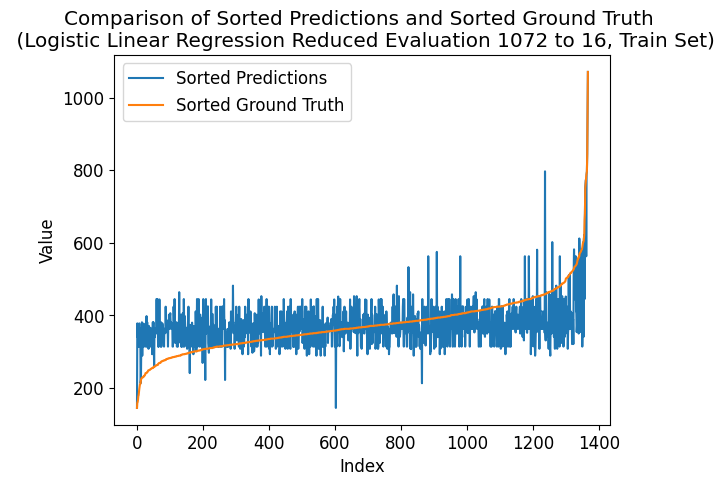

---- ---- ----
class_num = 1088
Number of unique elements: 318
[   0.   68.  136.  204.  272.  340.  408.  476.  544.  612.  680.  748.
  816.  884.  952. 1020. 1088.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.41074765891222537
Coefficient of determination (R-squared score, R2 score): 0.02147525676937445
train eval:
Mean squared error: 1.1951754385964912
Correlation coefficient: 0.5096671321693497
Coefficient of determination (R-squared score, R2 score): 0.16181716455804362


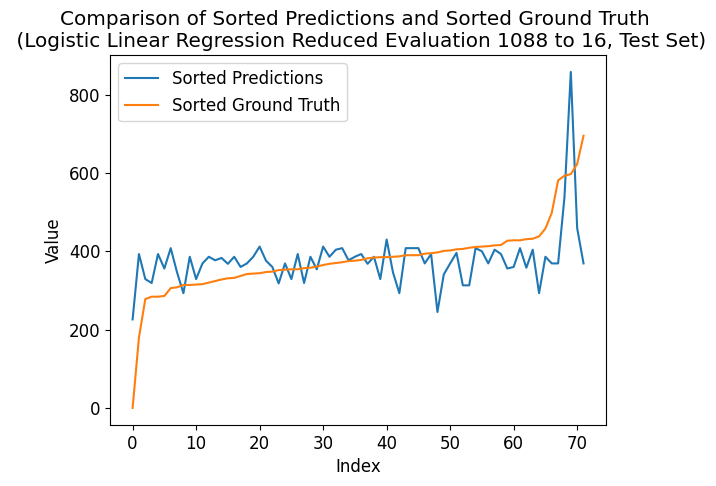

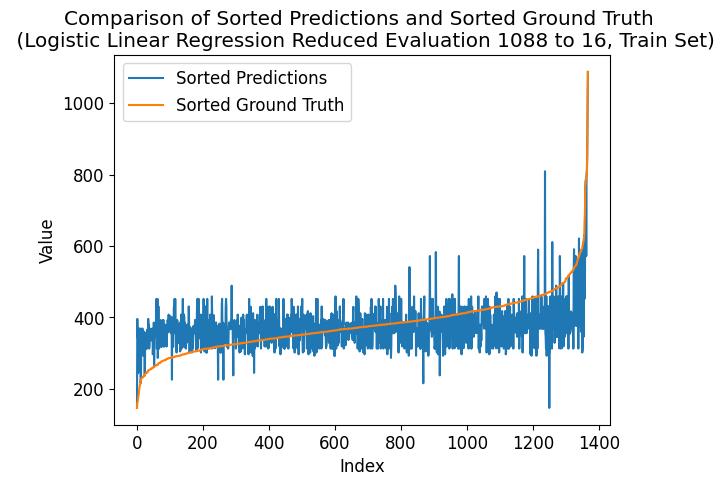

---- ---- ----
class_num = 1104
Number of unique elements: 323
[   0.   69.  138.  207.  276.  345.  414.  483.  552.  621.  690.  759.
  828.  897.  966. 1035. 1104.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.4258446607339278
Coefficient of determination (R-squared score, R2 score): 0.043884220354808545
train eval:
Mean squared error: 1.2105263157894737
Correlation coefficient: 0.4975896604428568
Coefficient of determination (R-squared score, R2 score): 0.15105151346062395


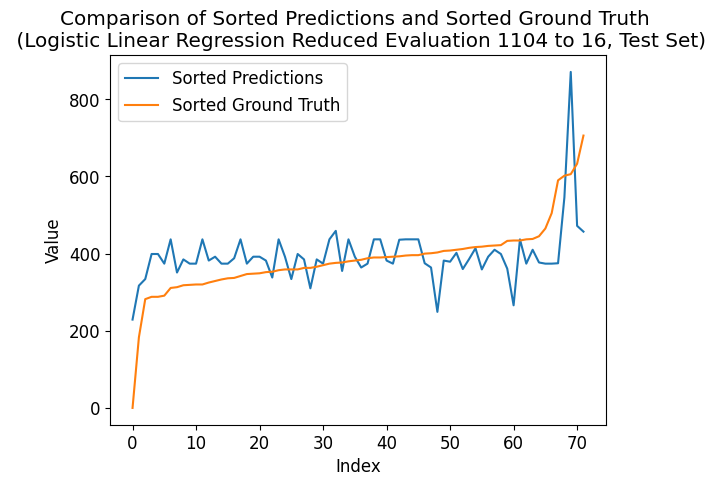

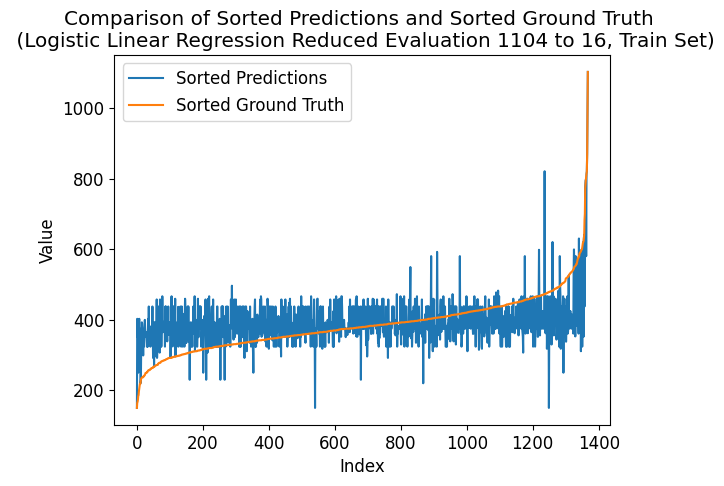

---- ---- ----
class_num = 1120
Number of unique elements: 325
[   0.   70.  140.  210.  280.  350.  420.  490.  560.  630.  700.  770.
  840.  910.  980. 1050. 1120.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.4109044228612891
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
train eval:
Mean squared error: 1.206140350877193
Correlation coefficient: 0.5047438378997717
Coefficient of determination (R-squared score, R2 score): 0.1541274137741725


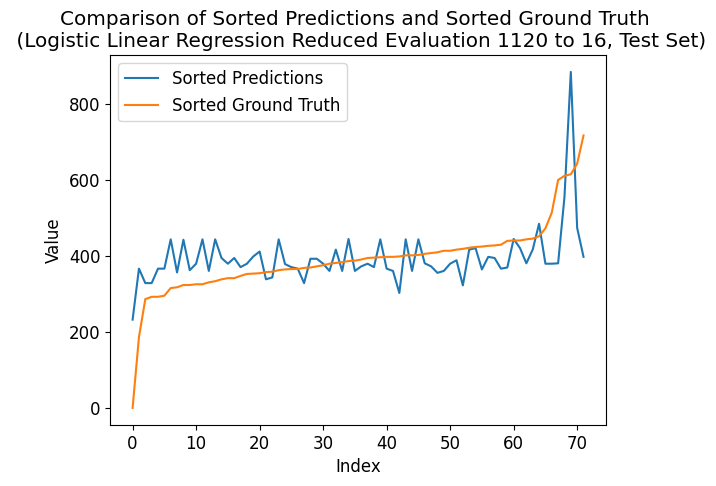

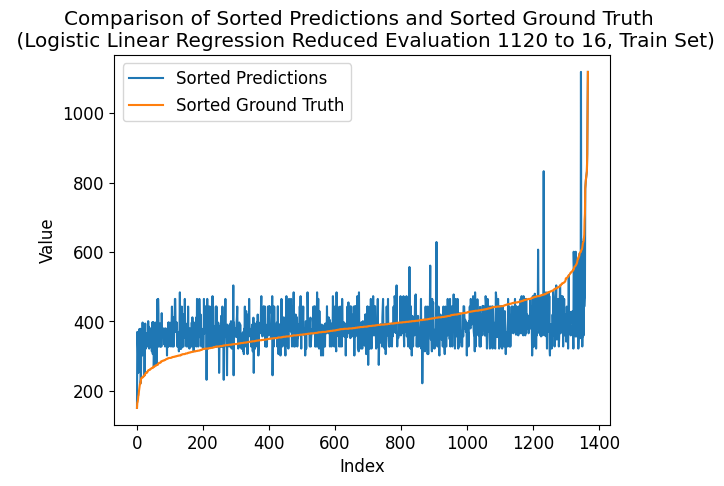

---- ---- ----
class_num = 1136
Number of unique elements: 331
[   0.   71.  142.  213.  284.  355.  426.  497.  568.  639.  710.  781.
  852.  923.  994. 1065. 1136.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.470225484684118
Coefficient of determination (R-squared score, R2 score): 0.12605042016806722
train eval:
Mean squared error: 1.1717836257309941
Correlation coefficient: 0.508497189330375
Coefficient of determination (R-squared score, R2 score): 0.17822196623030206


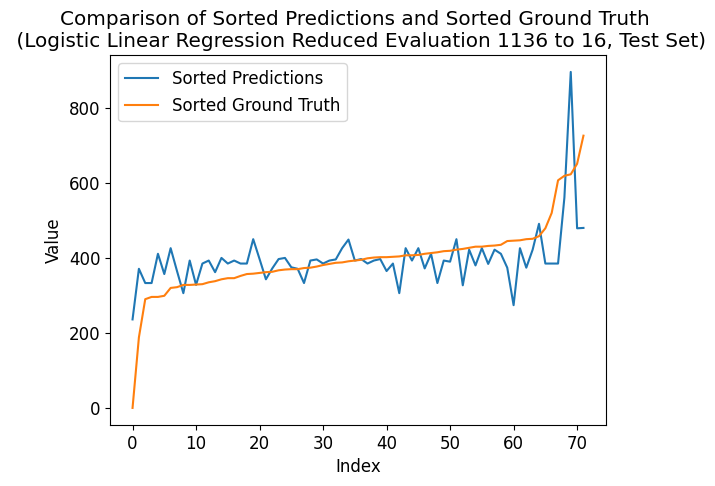

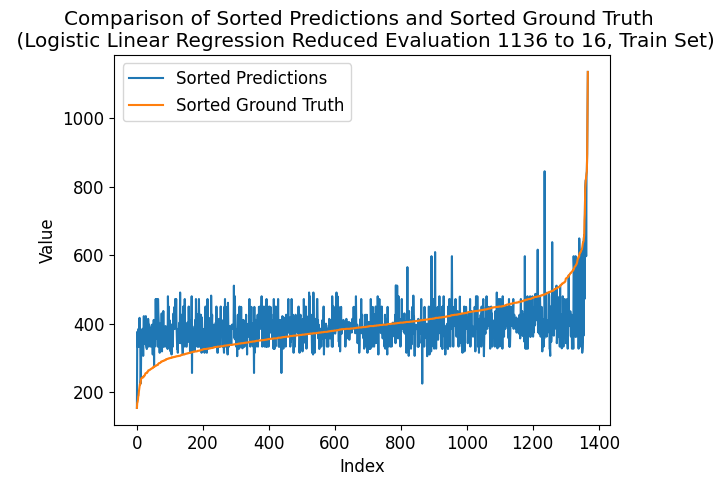

---- ---- ----
class_num = 1152
Number of unique elements: 339
[   0.   72.  144.  216.  288.  360.  432.  504.  576.  648.  720.  792.
  864.  936. 1008. 1080. 1152.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.3644573237131406
Coefficient of determination (R-squared score, R2 score): -0.06069094304388423
train eval:
Mean squared error: 1.3179824561403508
Correlation coefficient: 0.47299186953477274
Coefficient of determination (R-squared score, R2 score): 0.07569195577868659


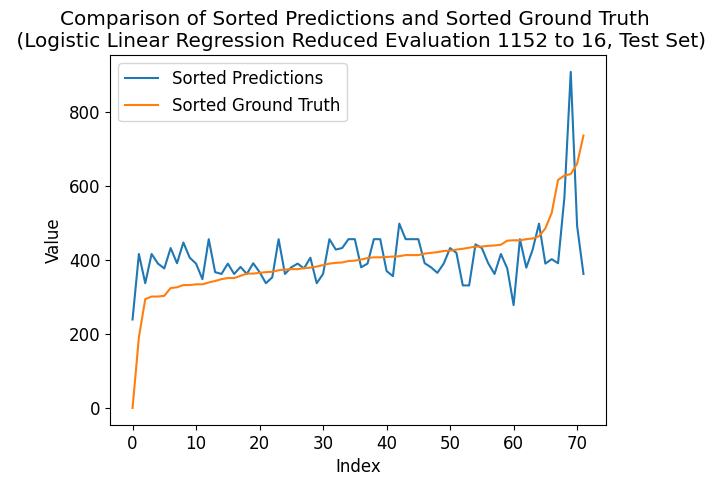

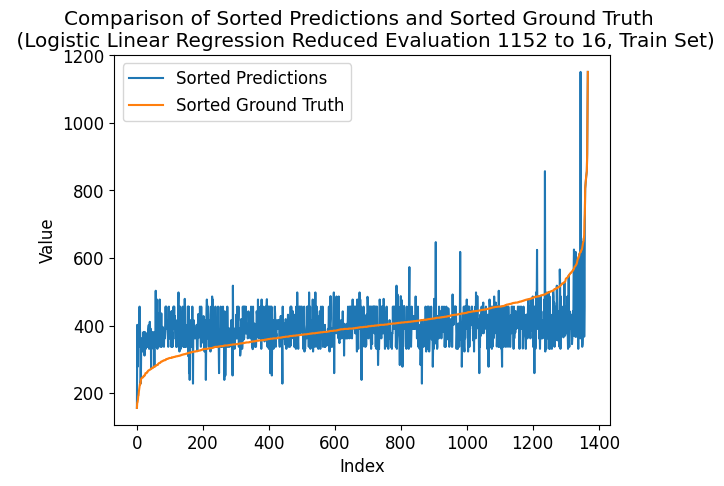

---- ---- ----
class_num = 1168
Number of unique elements: 336
[   0.   73.  146.  219.  292.  365.  438.  511.  584.  657.  730.  803.
  876.  949. 1022. 1095. 1168.]
test eval:
Mean squared error: 2.0416666666666665
Correlation coefficient: 0.36481486423763915
Coefficient of determination (R-squared score, R2 score): -0.0980392156862746
train eval:
Mean squared error: 1.2521929824561404
Correlation coefficient: 0.48716306635251094
Coefficient of determination (R-squared score, R2 score): 0.1218304604819136


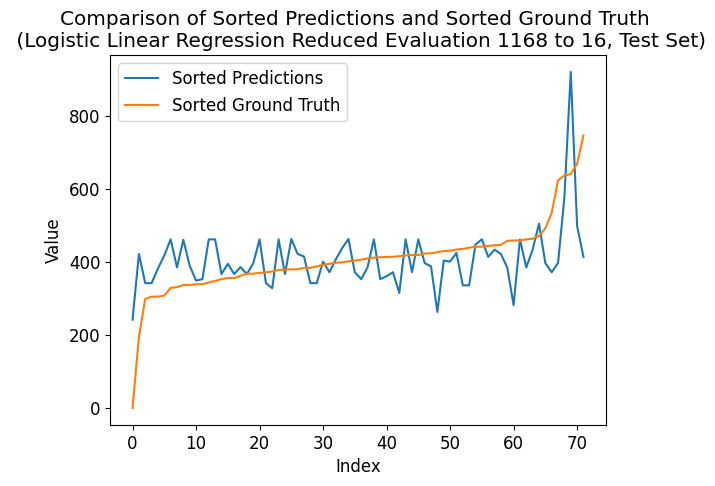

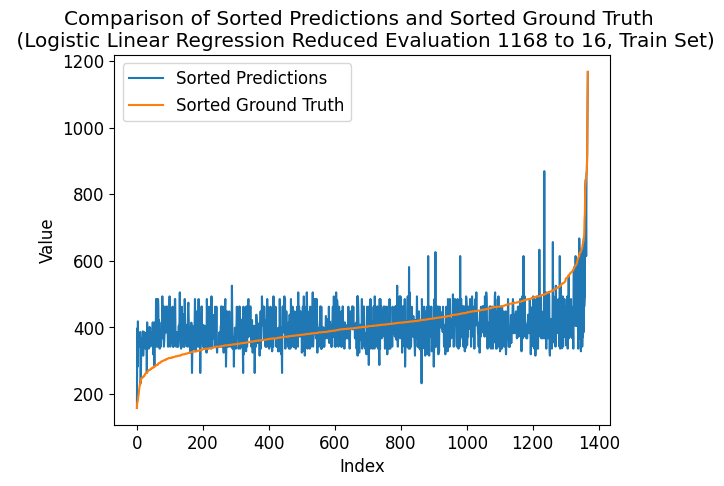

---- ---- ----
class_num = 1184
Number of unique elements: 342
[   0.   74.  148.  222.  296.  370.  444.  518.  592.  666.  740.  814.
  888.  962. 1036. 1110. 1184.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.4308515586693371
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.1871345029239766
Correlation coefficient: 0.513645988436496
Coefficient of determination (R-squared score, R2 score): 0.1674563151328825


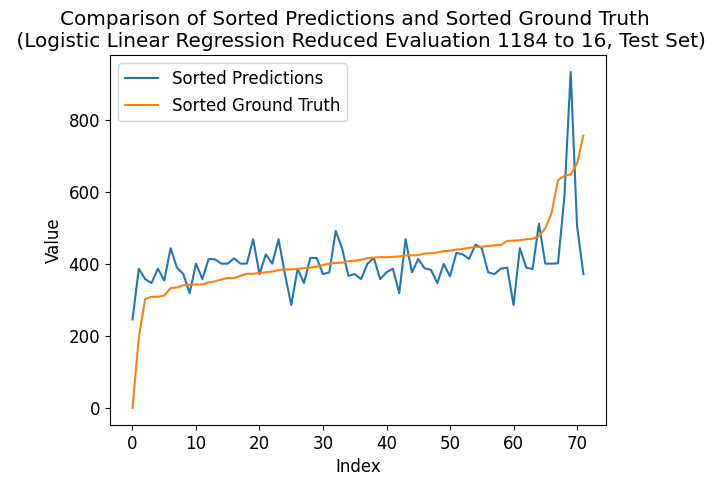

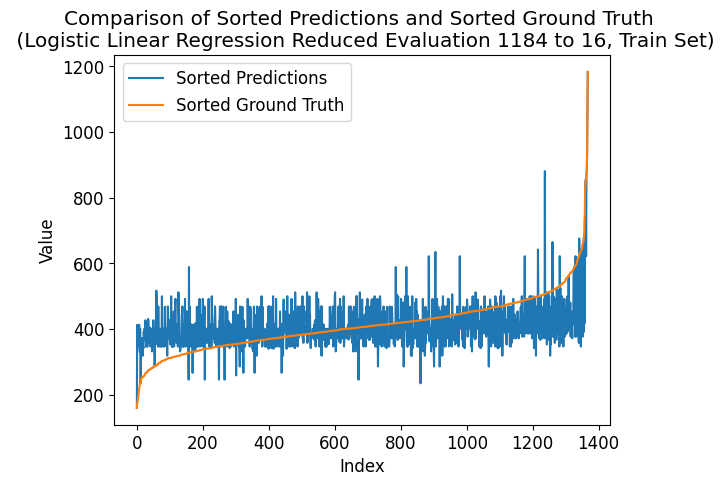

---- ---- ----
class_num = 1200
Number of unique elements: 346
[   0.   75.  150.  225.  300.  375.  450.  525.  600.  675.  750.  825.
  900.  975. 1050. 1125. 1200.]
test eval:
Mean squared error: 1.8472222222222223
Correlation coefficient: 0.40014040511229637
Coefficient of determination (R-squared score, R2 score): 0.006535947712418277
train eval:
Mean squared error: 1.2675438596491229
Correlation coefficient: 0.4921374695750742
Coefficient of determination (R-squared score, R2 score): 0.11106480938449392


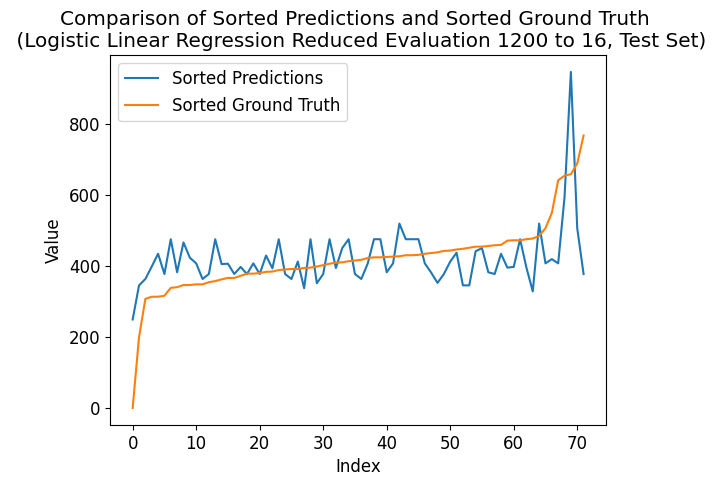

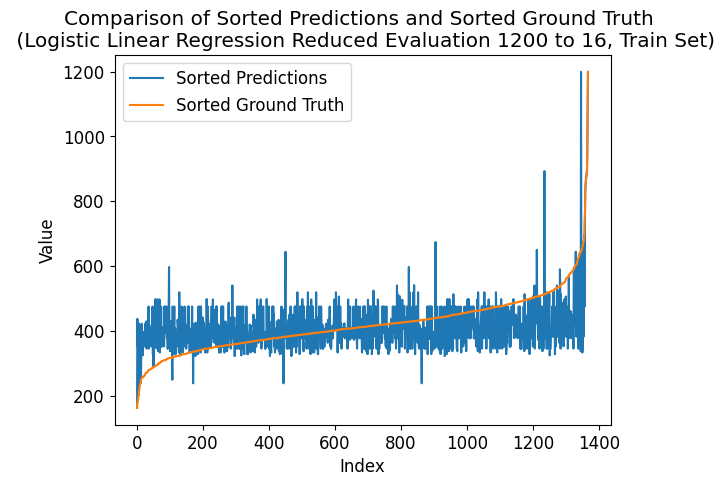

---- ---- ----
class_num = 1216
Number of unique elements: 347
[   0.   76.  152.  228.  304.  380.  456.  532.  608.  684.  760.  836.
  912.  988. 1064. 1140. 1216.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.4095234117078239
Coefficient of determination (R-squared score, R2 score): 0.028944911297852483
train eval:
Mean squared error: 1.185672514619883
Correlation coefficient: 0.5128907976324513
Coefficient of determination (R-squared score, R2 score): 0.16848161523739857


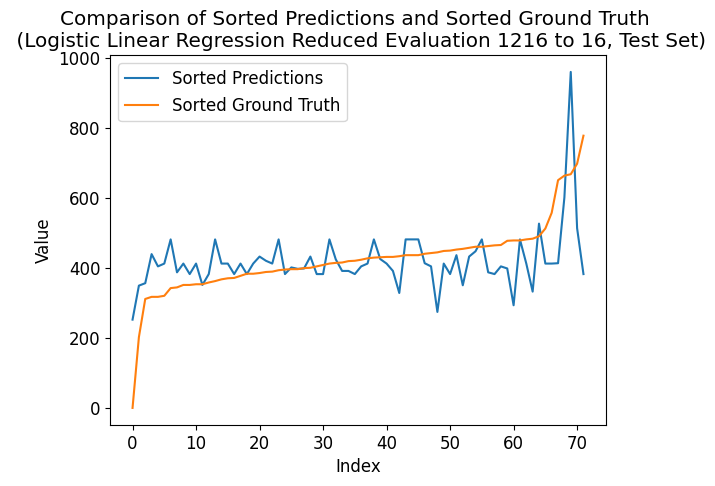

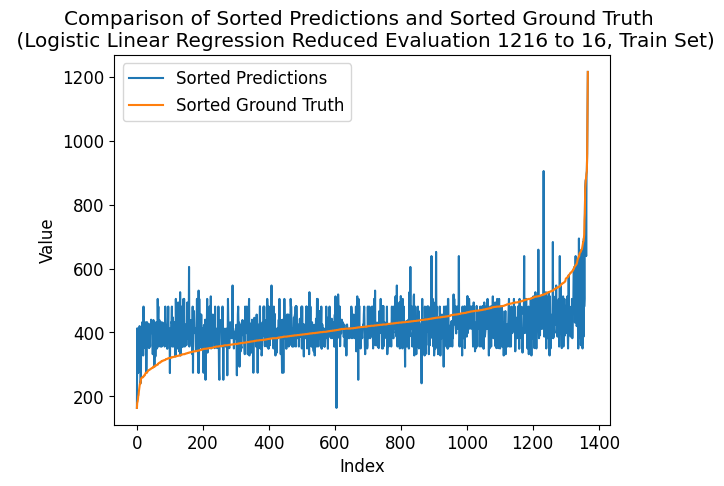

---- ---- ----
class_num = 1232
Number of unique elements: 347
[   0.   77.  154.  231.  308.  385.  462.  539.  616.  693.  770.  847.
  924. 1001. 1078. 1155. 1232.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.42345298307322854
Coefficient of determination (R-squared score, R2 score): 0.08123249299719892
train eval:
Mean squared error: 1.2171052631578947
Correlation coefficient: 0.4948718969820021
Coefficient of determination (R-squared score, R2 score): 0.14643766299030125


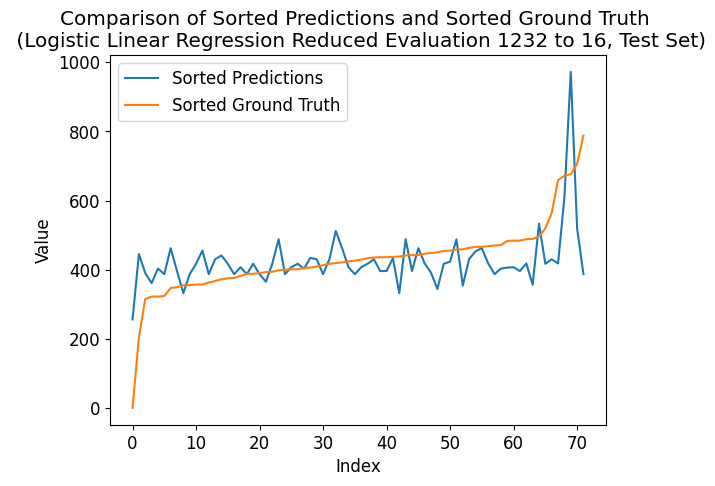

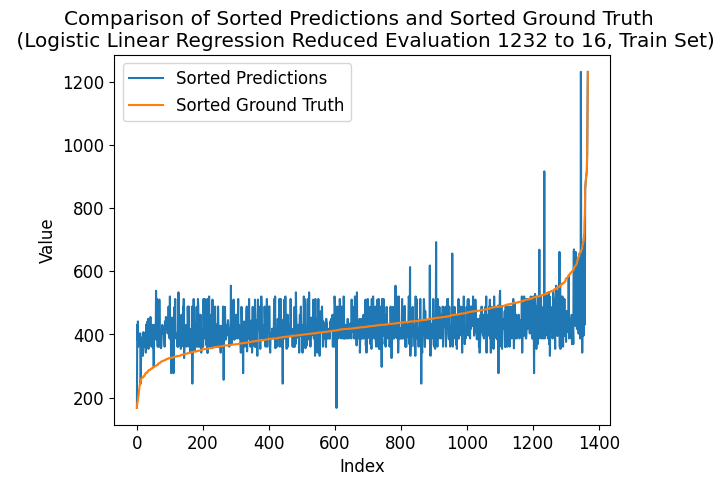

---- ---- ----
class_num = 1248
Number of unique elements: 352
[   0.   78.  156.  234.  312.  390.  468.  546.  624.  702.  780.  858.
  936. 1014. 1092. 1170. 1248.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.35624894256814954
Coefficient of determination (R-squared score, R2 score): -0.06069094304388423
train eval:
Mean squared error: 1.185672514619883
Correlation coefficient: 0.5086345245665878
Coefficient of determination (R-squared score, R2 score): 0.16848161523739857


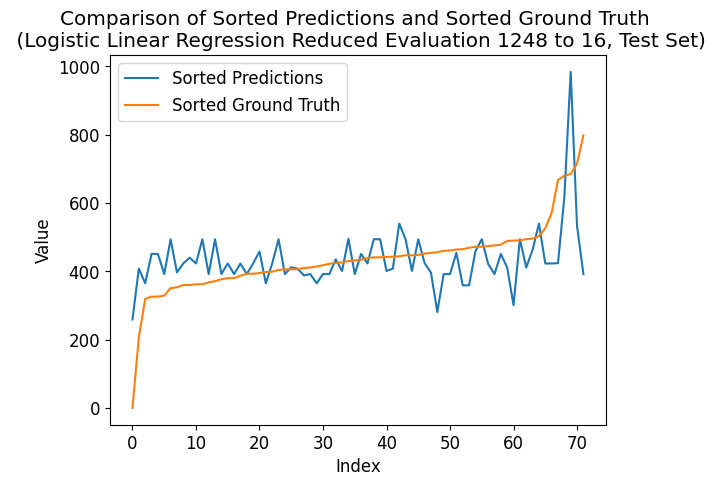

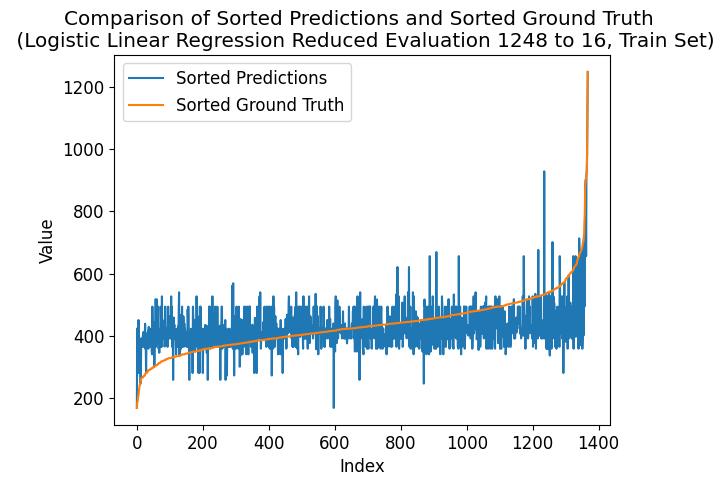

---- ---- ----
class_num = 1264
Number of unique elements: 362
[   0.   79.  158.  237.  316.  395.  474.  553.  632.  711.  790.  869.
  948. 1027. 1106. 1185. 1264.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.3762051253359772
Coefficient of determination (R-squared score, R2 score): -0.03828197945845013
train eval:
Mean squared error: 1.141812865497076
Correlation coefficient: 0.5220215043135258
Coefficient of determination (R-squared score, R2 score): 0.1992406183728832


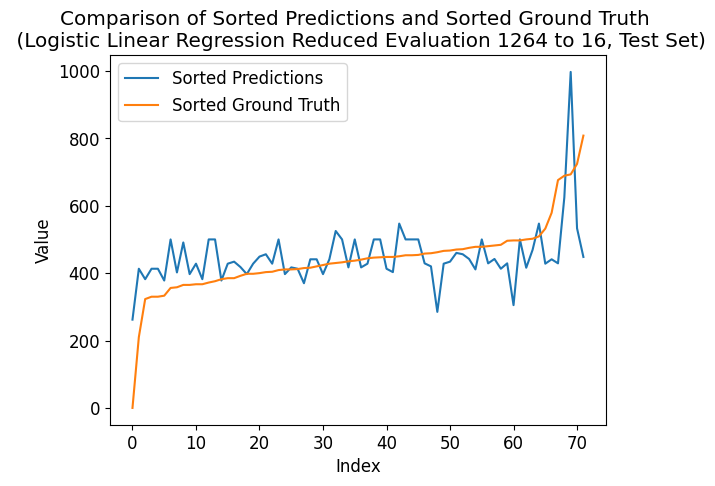

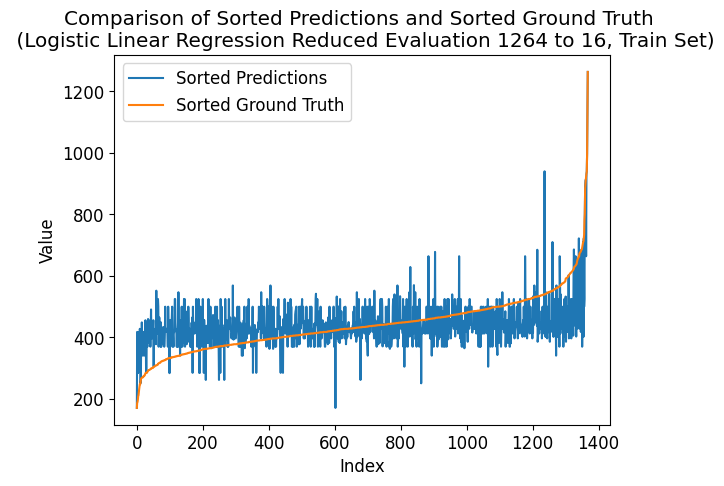

---- ---- ----
class_num = 1280
Number of unique elements: 356
[   0.   80.  160.  240.  320.  400.  480.  560.  640.  720.  800.  880.
  960. 1040. 1120. 1200. 1280.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.42744406961189996
Coefficient of determination (R-squared score, R2 score): 0.028944911297852483
train eval:
Mean squared error: 1.3296783625730995
Correlation coefficient: 0.46742597553862225
Coefficient of determination (R-squared score, R2 score): 0.06748955494255737


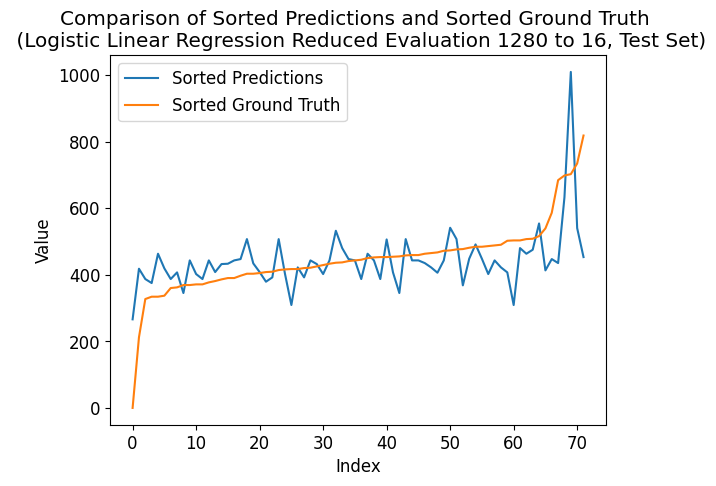

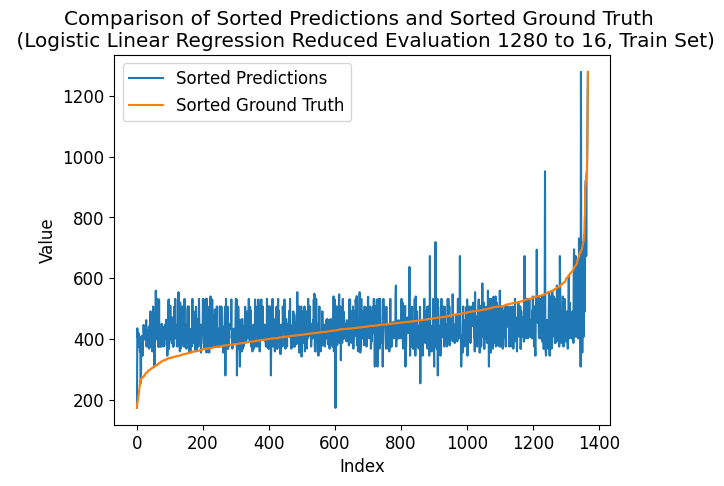

---- ---- ----
class_num = 1296
Number of unique elements: 366
[   0.   81.  162.  243.  324.  405.  486.  567.  648.  729.  810.  891.
  972. 1053. 1134. 1215. 1296.]
test eval:
Mean squared error: 2.0694444444444446
Correlation coefficient: 0.36105378580232217
Coefficient of determination (R-squared score, R2 score): -0.11297852474323067
train eval:
Mean squared error: 1.2083333333333333
Correlation coefficient: 0.500632638407923
Coefficient of determination (R-squared score, R2 score): 0.15258946361739822


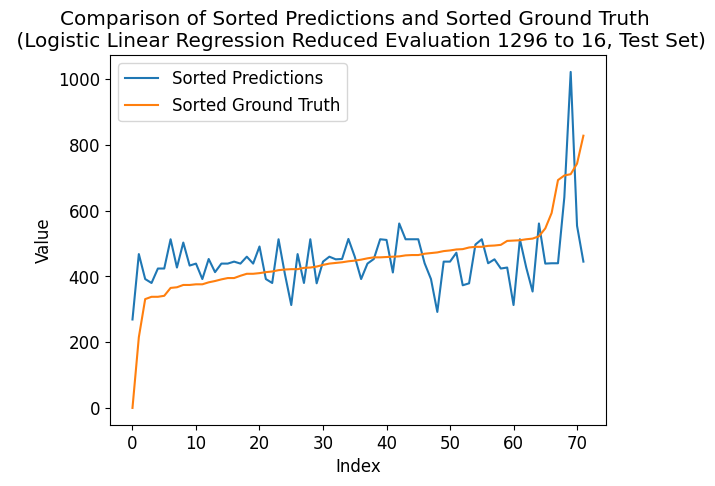

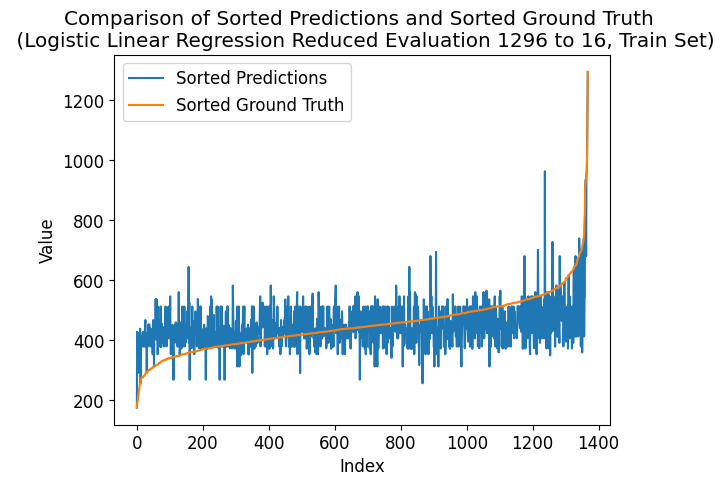

---- ---- ----
class_num = 1312
Number of unique elements: 368
[   0.   82.  164.  246.  328.  410.  492.  574.  656.  738.  820.  902.
  984. 1066. 1148. 1230. 1312.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.4015119589281471
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.161549707602339
Correlation coefficient: 0.5263855207662416
Coefficient of determination (R-squared score, R2 score): 0.18539906696191522


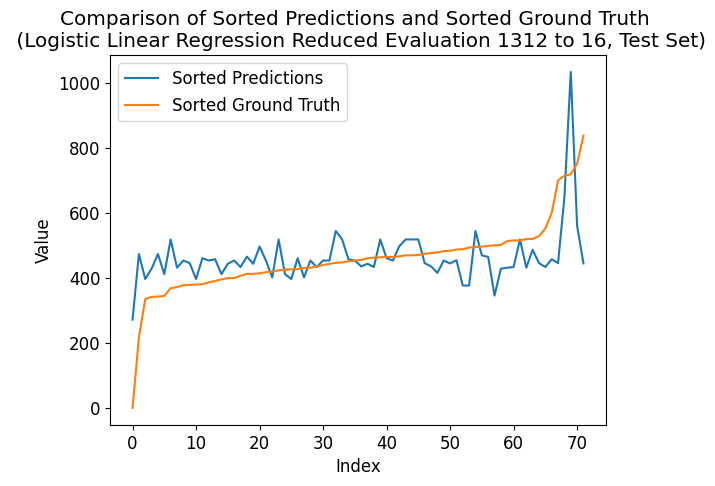

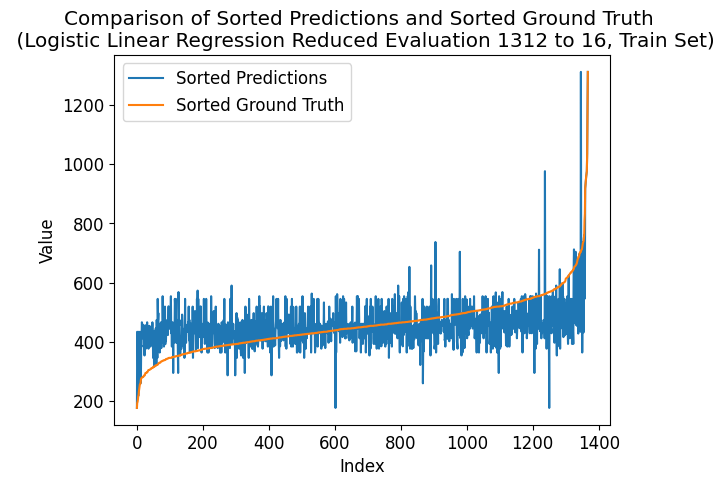

---- ---- ----
class_num = 1328
Number of unique elements: 370
[   0.   83.  166.  249.  332.  415.  498.  581.  664.  747.  830.  913.
  996. 1079. 1162. 1245. 1328.]
test eval:
Mean squared error: 1.75
Correlation coefficient: 0.42016714111016656
Coefficient of determination (R-squared score, R2 score): 0.05882352941176472
train eval:
Mean squared error: 1.226608187134503
Correlation coefficient: 0.4903677851168673
Coefficient of determination (R-squared score, R2 score): 0.1397732123109463


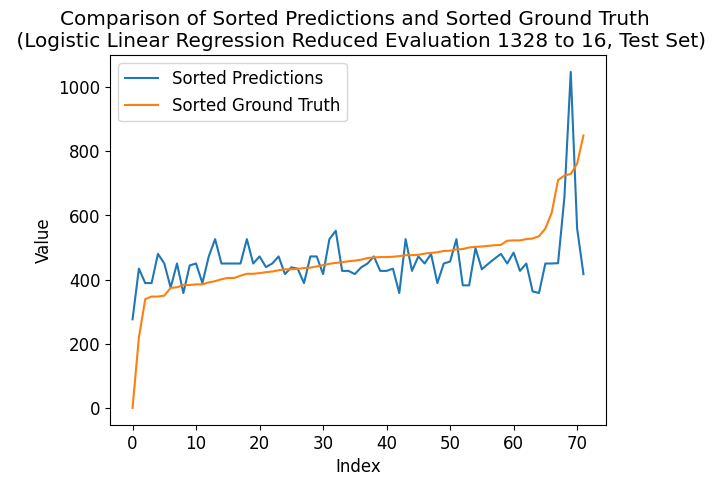

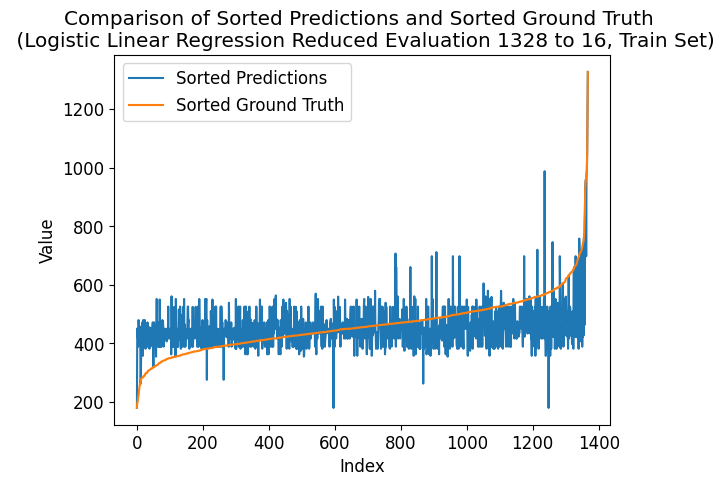

---- ---- ----
class_num = 1344
Number of unique elements: 372
[   0.   84.  168.  252.  336.  420.  504.  588.  672.  756.  840.  924.
 1008. 1092. 1176. 1260. 1344.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.397008286950533
Coefficient of determination (R-squared score, R2 score): -0.008403361344537785
train eval:
Mean squared error: 1.144736842105263
Correlation coefficient: 0.5209375365562346
Coefficient of determination (R-squared score, R2 score): 0.19719001816385096


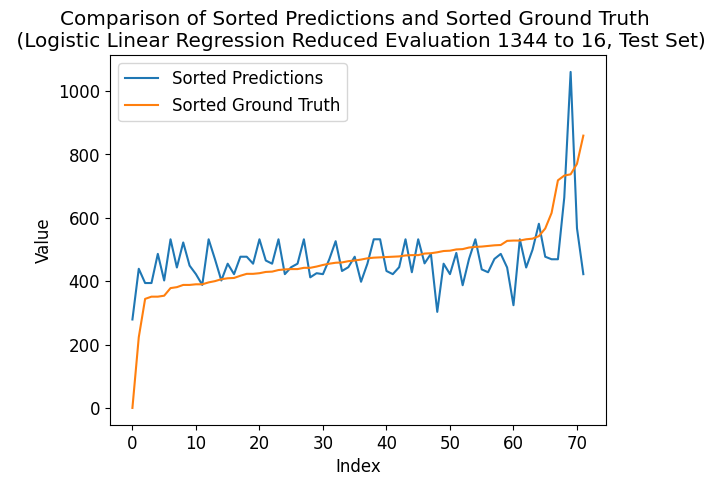

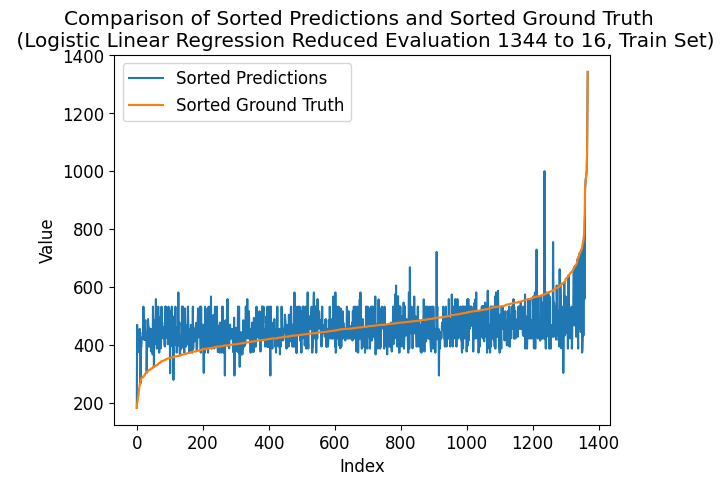

---- ---- ----
class_num = 1360
Number of unique elements: 371
[   0.   85.  170.  255.  340.  425.  510.  595.  680.  765.  850.  935.
 1020. 1105. 1190. 1275. 1360.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.4411674610445075
Coefficient of determination (R-squared score, R2 score): 0.09617180205415499
train eval:
Mean squared error: 1.2207602339181287
Correlation coefficient: 0.4877169234835959
Coefficient of determination (R-squared score, R2 score): 0.14387441272901091


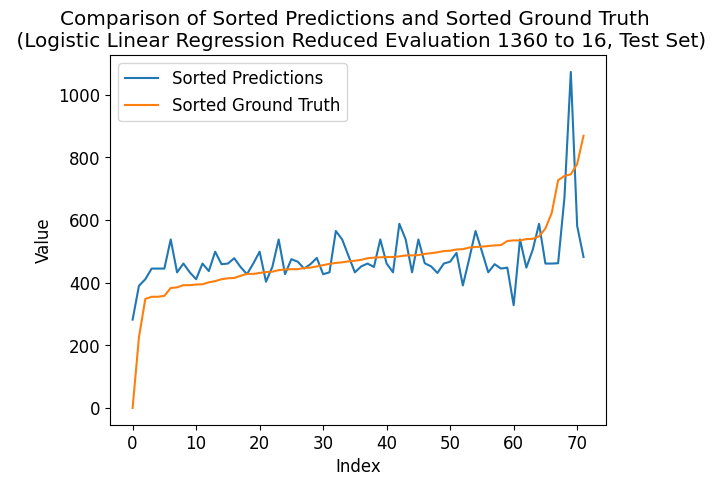

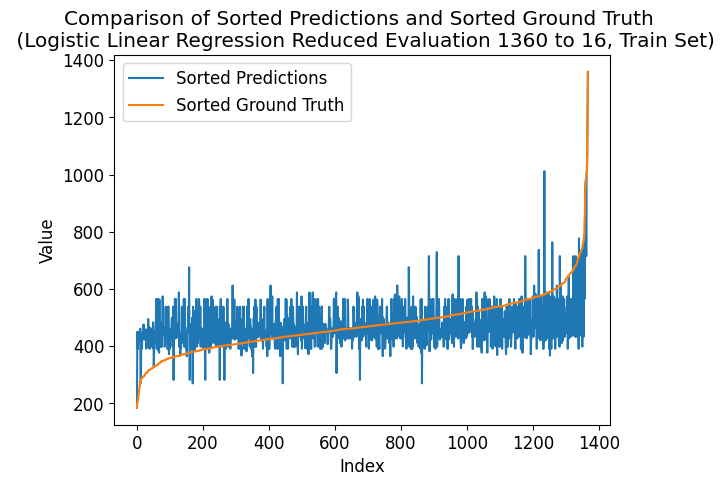

---- ---- ----
class_num = 1376
Number of unique elements: 377
[   0.   86.  172.  258.  344.  430.  516.  602.  688.  774.  860.  946.
 1032. 1118. 1204. 1290. 1376.]
test eval:
Mean squared error: 1.8888888888888888
Correlation coefficient: 0.4096210940636037
Coefficient of determination (R-squared score, R2 score): -0.015873015873015817
train eval:
Mean squared error: 1.1864035087719298
Correlation coefficient: 0.5182179271486073
Coefficient of determination (R-squared score, R2 score): 0.1679689651851406


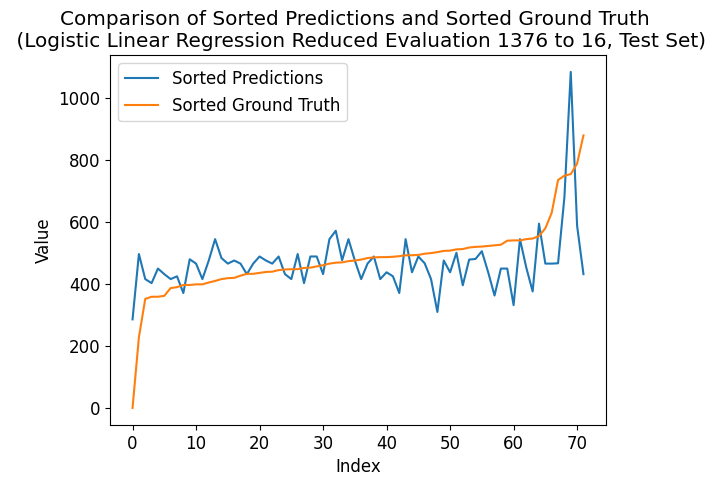

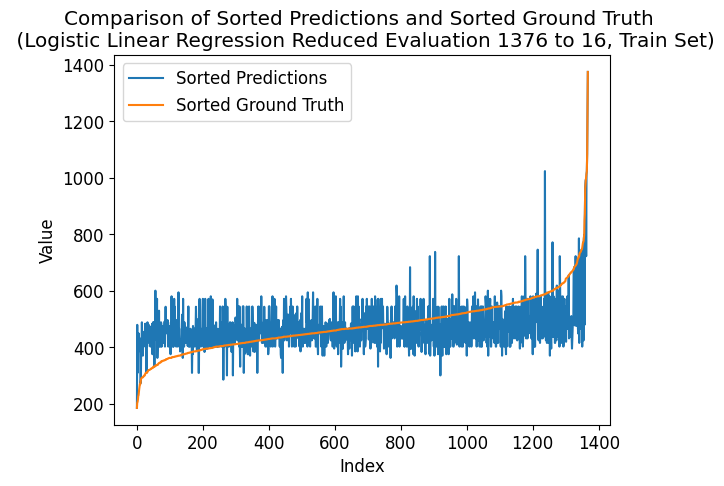

---- ---- ----
class_num = 1392
Number of unique elements: 383
[   0.   87.  174.  261.  348.  435.  522.  609.  696.  783.  870.  957.
 1044. 1131. 1218. 1305. 1392.]
test eval:
Mean squared error: 2.138888888888889
Correlation coefficient: 0.31462284154851966
Coefficient of determination (R-squared score, R2 score): -0.15032679738562083
train eval:
Mean squared error: 1.1980994152046784
Correlation coefficient: 0.5200547772401144
Coefficient of determination (R-squared score, R2 score): 0.15976656434901126


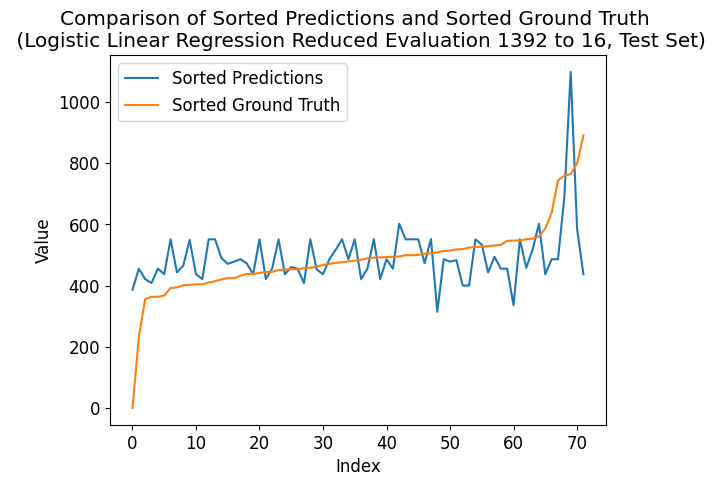

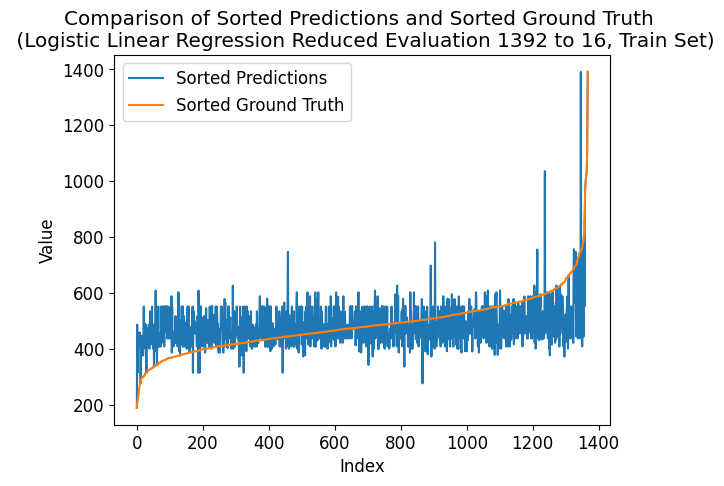

---- ---- ----
class_num = 1408
Number of unique elements: 382
[   0.   88.  176.  264.  352.  440.  528.  616.  704.  792.  880.  968.
 1056. 1144. 1232. 1320. 1408.]
test eval:
Mean squared error: 2.0416666666666665
Correlation coefficient: 0.35698982974735893
Coefficient of determination (R-squared score, R2 score): -0.0980392156862746
train eval:
Mean squared error: 1.2719298245614035
Correlation coefficient: 0.4777021549359274
Coefficient of determination (R-squared score, R2 score): 0.1079889090709455


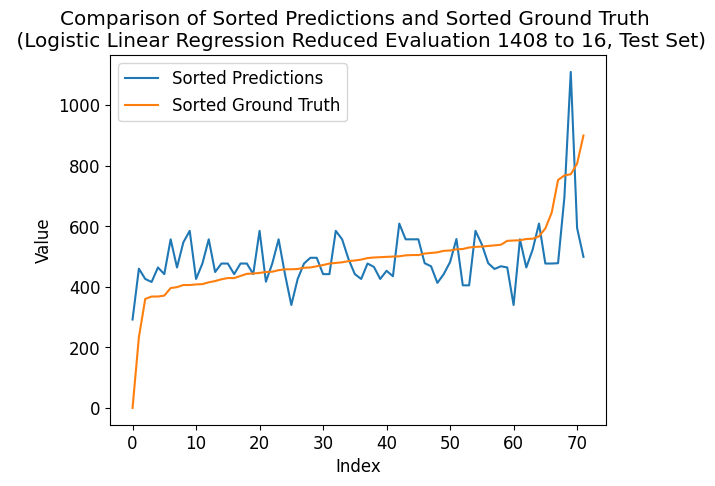

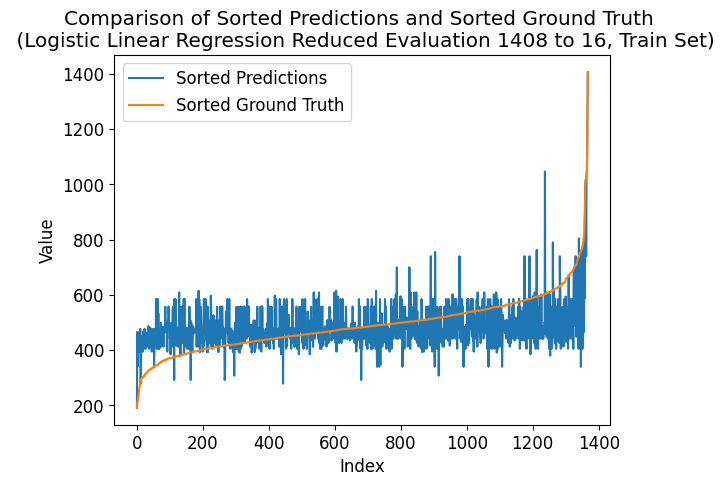

---- ---- ----
class_num = 1424
Number of unique elements: 386
[   0.   89.  178.  267.  356.  445.  534.  623.  712.  801.  890.  979.
 1068. 1157. 1246. 1335. 1424.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.427251444912582
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
train eval:
Mean squared error: 1.1001461988304093
Correlation coefficient: 0.5432958222364069
Coefficient of determination (R-squared score, R2 score): 0.22846167135159368


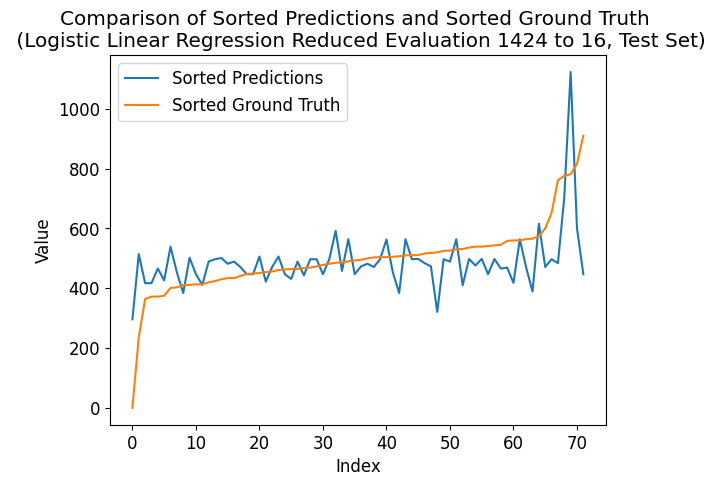

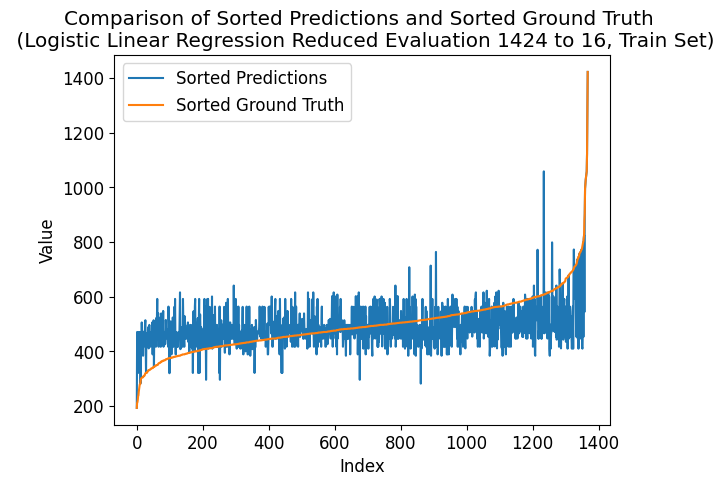

---- ---- ----
class_num = 1440
Number of unique elements: 396
[   0.   90.  180.  270.  360.  450.  540.  630.  720.  810.  900.  990.
 1080. 1170. 1260. 1350. 1440.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.39540056450390443
Coefficient of determination (R-squared score, R2 score): 0.02147525676937445
train eval:
Mean squared error: 1.118421052631579
Correlation coefficient: 0.5287861334997481
Coefficient of determination (R-squared score, R2 score): 0.21564542004514176


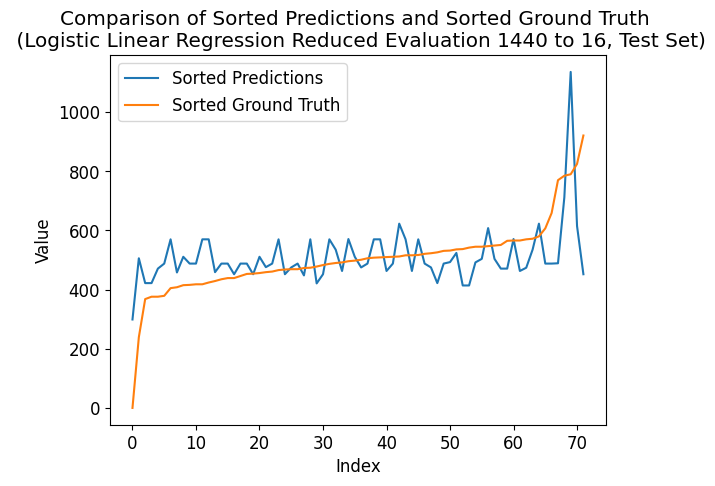

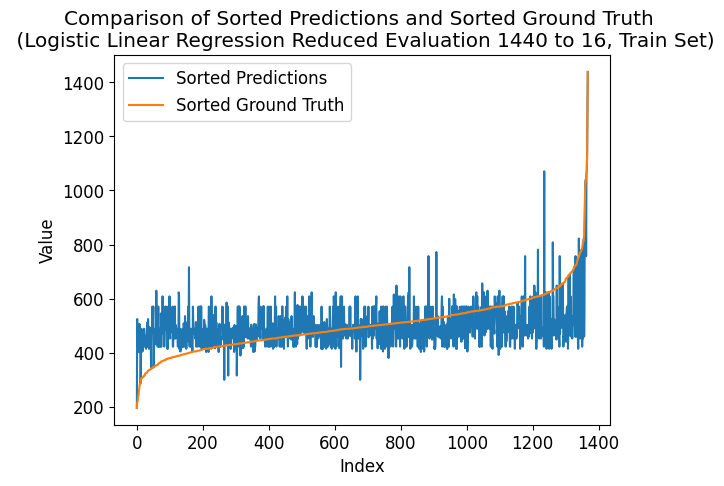

---- ---- ----
class_num = 1456
Number of unique elements: 392
[   0.   91.  182.  273.  364.  455.  546.  637.  728.  819.  910. 1001.
 1092. 1183. 1274. 1365. 1456.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.39722438724914694
Coefficient of determination (R-squared score, R2 score): 0.02147525676937445
train eval:
Mean squared error: 1.182748538011696
Correlation coefficient: 0.508774567698493
Coefficient of determination (R-squared score, R2 score): 0.17053221544643093


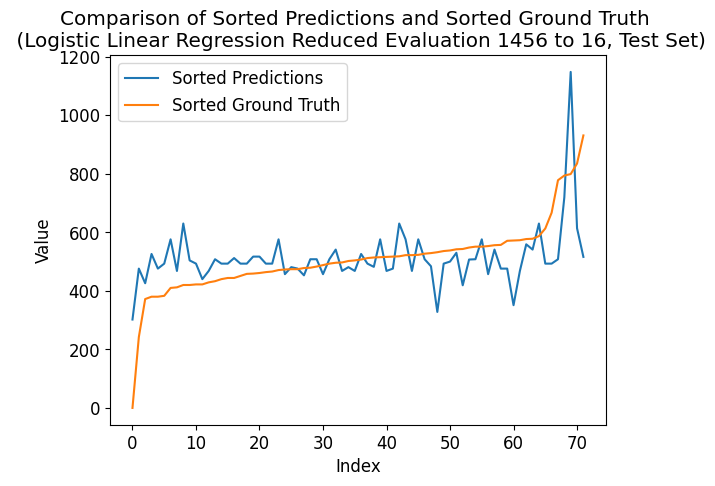

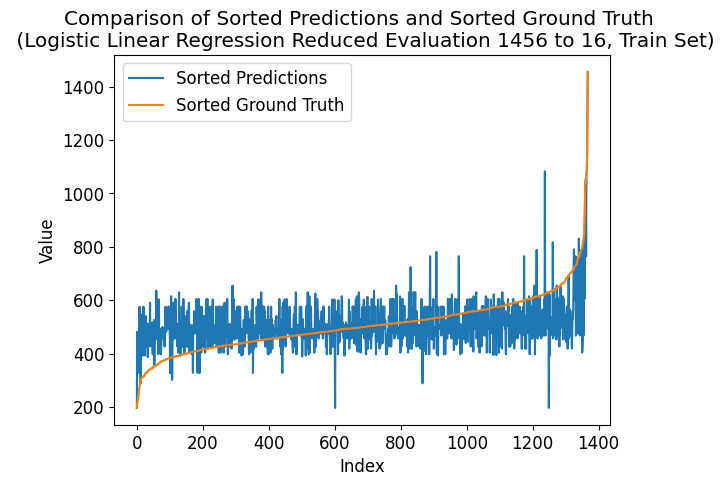

---- ---- ----
class_num = 1472
Number of unique elements: 396
[   0.   92.  184.  276.  368.  460.  552.  644.  736.  828.  920. 1012.
 1104. 1196. 1288. 1380. 1472.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.3937306173126693
Coefficient of determination (R-squared score, R2 score): -0.03081232492997188
train eval:
Mean squared error: 1.2295321637426901
Correlation coefficient: 0.5070049803704809
Coefficient of determination (R-squared score, R2 score): 0.13772261210191394


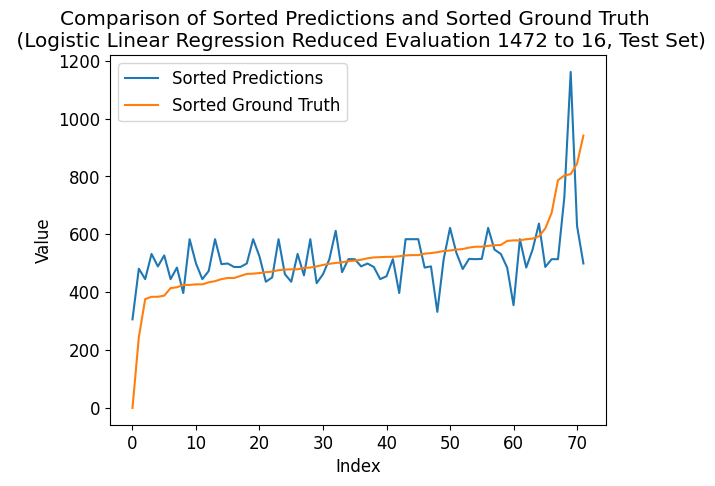

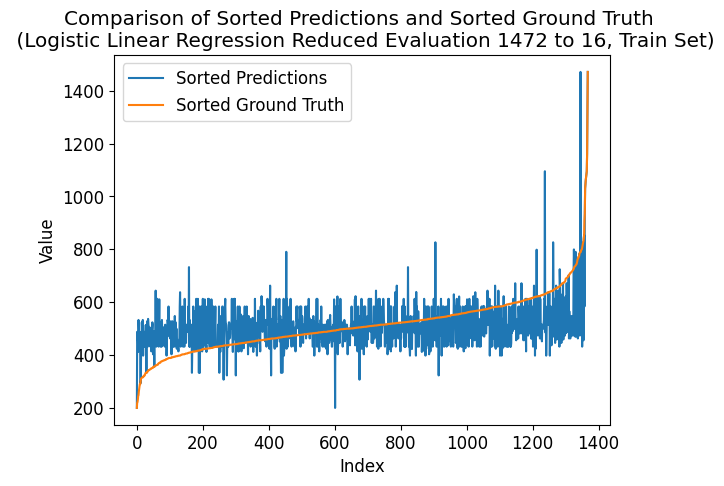

---- ---- ----
class_num = 1488
Number of unique elements: 402
[   0.   93.  186.  279.  372.  465.  558.  651.  744.  837.  930. 1023.
 1116. 1209. 1302. 1395. 1488.]
test eval:
Mean squared error: 1.8333333333333333
Correlation coefficient: 0.4165054821991276
Coefficient of determination (R-squared score, R2 score): 0.014005602240896309
train eval:
Mean squared error: 1.2054093567251463
Correlation coefficient: 0.511688518217734
Coefficient of determination (R-squared score, R2 score): 0.15464006382643058


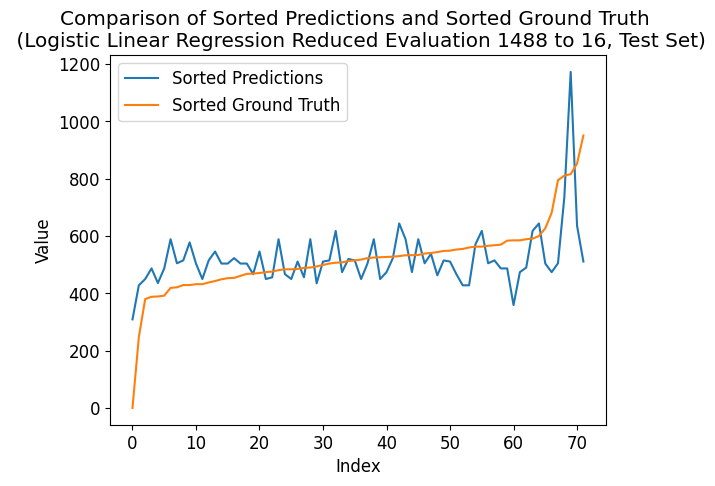

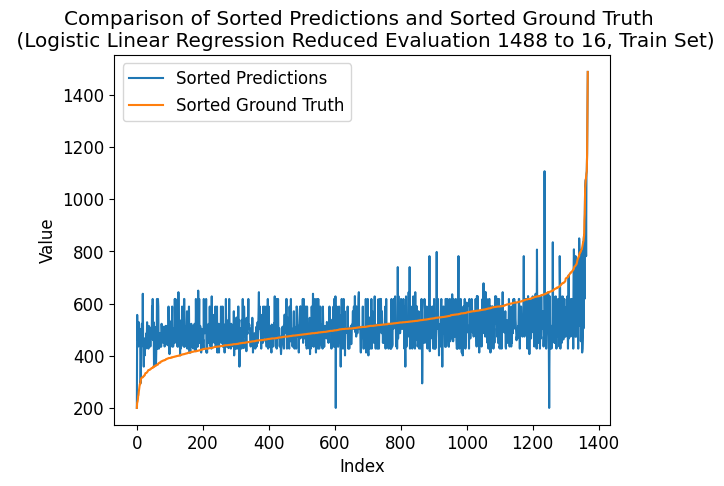

---- ---- ----
class_num = 1504
Number of unique elements: 404
[   0.   94.  188.  282.  376.  470.  564.  658.  752.  846.  940. 1034.
 1128. 1222. 1316. 1410. 1504.]
test eval:
Mean squared error: 1.8888888888888888
Correlation coefficient: 0.39994096593713974
Coefficient of determination (R-squared score, R2 score): -0.015873015873015817
train eval:
Mean squared error: 1.2317251461988303
Correlation coefficient: 0.5123292285161234
Coefficient of determination (R-squared score, R2 score): 0.13618466194513978


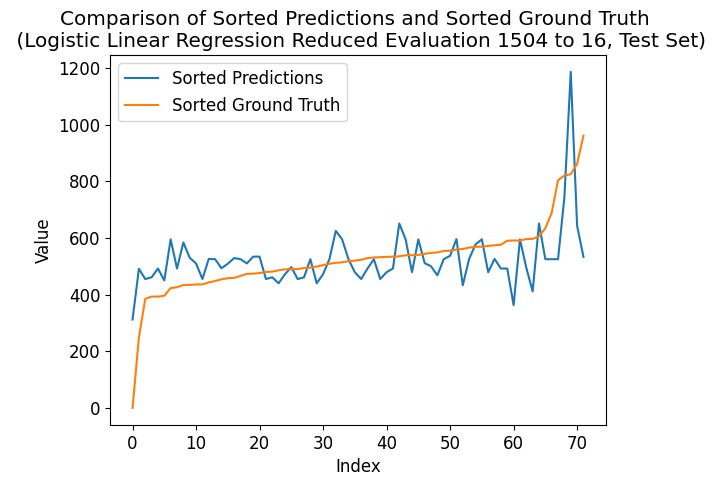

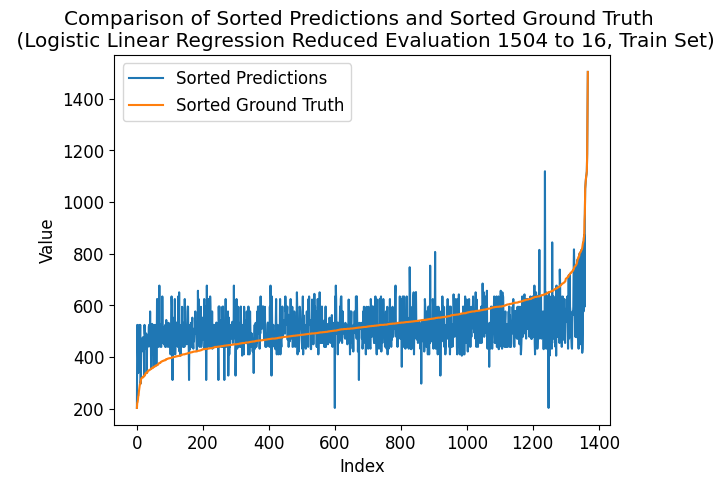

---- ---- ----
class_num = 1520
Number of unique elements: 404
[   0.   95.  190.  285.  380.  475.  570.  665.  760.  855.  950. 1045.
 1140. 1235. 1330. 1425. 1520.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.38855556069841796
Coefficient of determination (R-squared score, R2 score): -0.0009337068160597539
train eval:
Mean squared error: 1.1527777777777777
Correlation coefficient: 0.5105411967042561
Coefficient of determination (R-squared score, R2 score): 0.19155086758901207


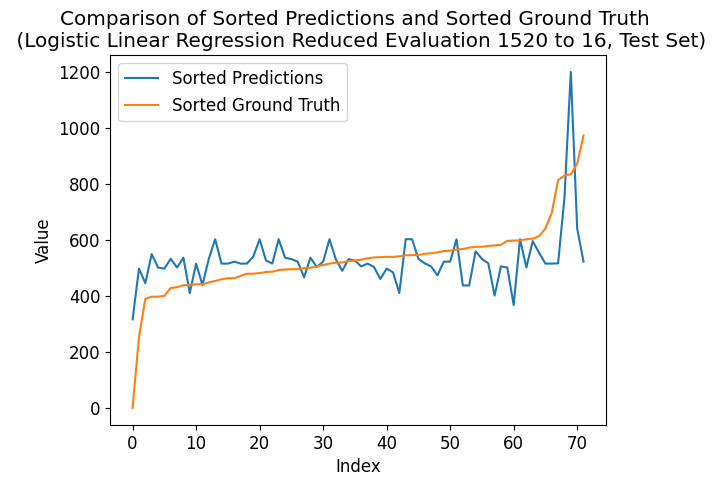

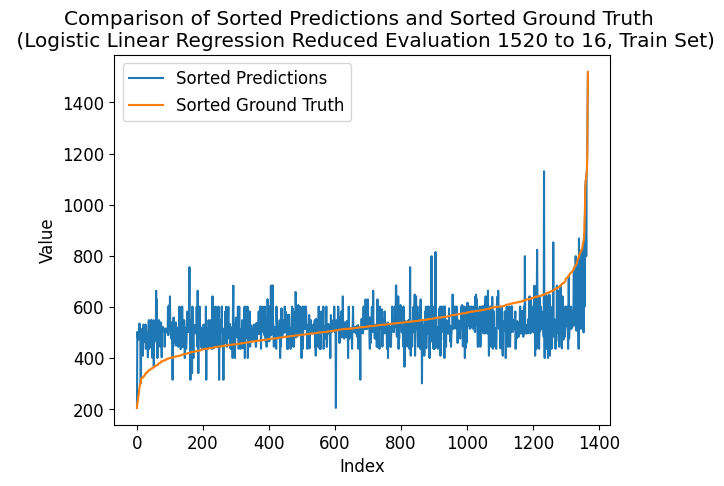

---- ---- ----
class_num = 1536
Number of unique elements: 408
[   0.   96.  192.  288.  384.  480.  576.  672.  768.  864.  960. 1056.
 1152. 1248. 1344. 1440. 1536.]
test eval:
Mean squared error: 2.2083333333333335
Correlation coefficient: 0.3087692163592721
Coefficient of determination (R-squared score, R2 score): -0.1876750700280112
train eval:
Mean squared error: 1.246345029239766
Correlation coefficient: 0.5012151401352187
Coefficient of determination (R-squared score, R2 score): 0.1259316608999782


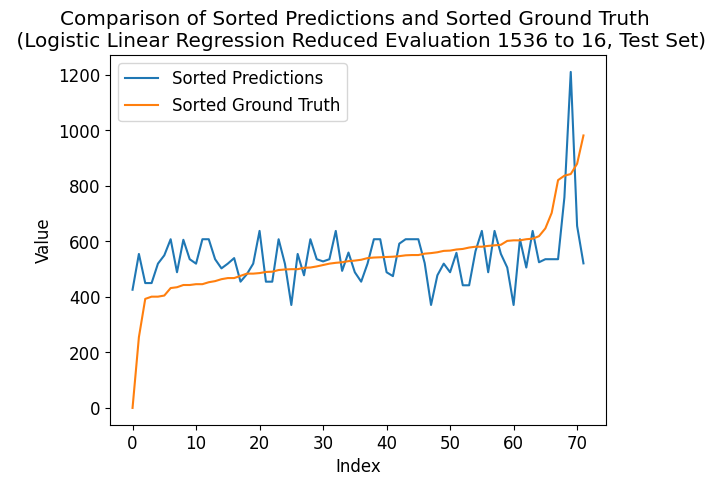

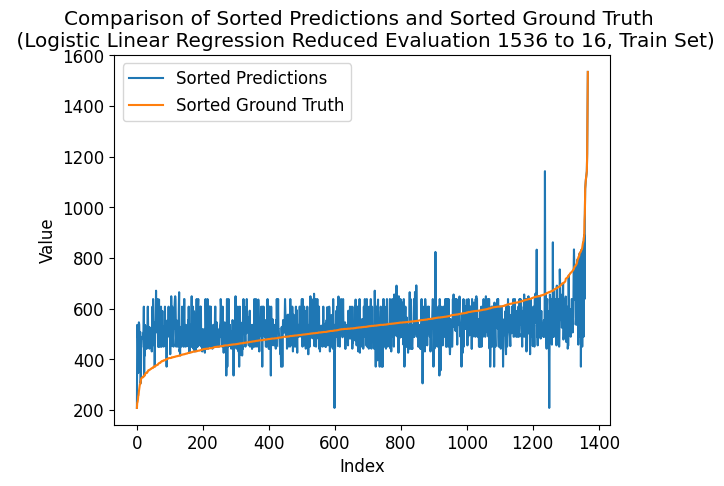

---- ---- ----
class_num = 1552
Number of unique elements: 405
[   0.   97.  194.  291.  388.  485.  582.  679.  776.  873.  970. 1067.
 1164. 1261. 1358. 1455. 1552.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.4351681733072561
Coefficient of determination (R-squared score, R2 score): 0.07376283846872078
train eval:
Mean squared error: 1.1944444444444444
Correlation coefficient: 0.5138497389431315
Coefficient of determination (R-squared score, R2 score): 0.16232981461030171


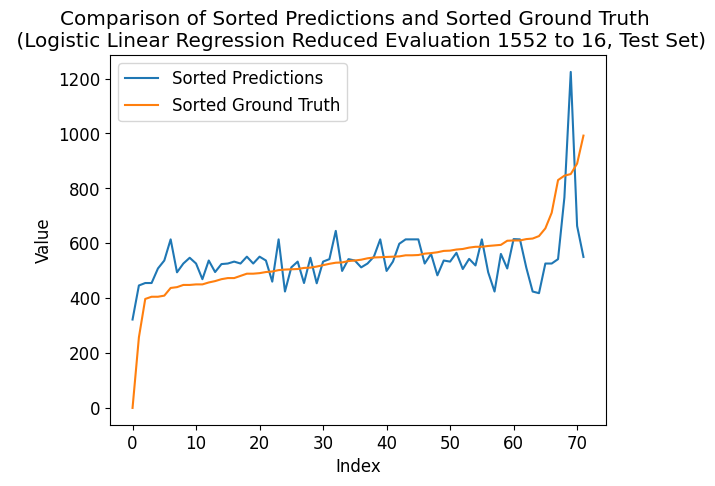

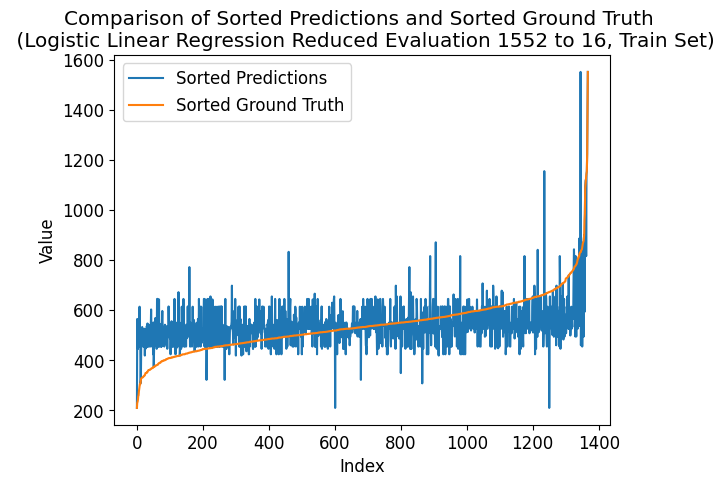

---- ---- ----
class_num = 1568
Number of unique elements: 413
[   0.   98.  196.  294.  392.  490.  588.  686.  784.  882.  980. 1078.
 1176. 1274. 1372. 1470. 1568.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.3595284314783199
Coefficient of determination (R-squared score, R2 score): -0.03828197945845013
train eval:
Mean squared error: 1.1264619883040936
Correlation coefficient: 0.5242889582886737
Coefficient of determination (R-squared score, R2 score): 0.21000626947030288


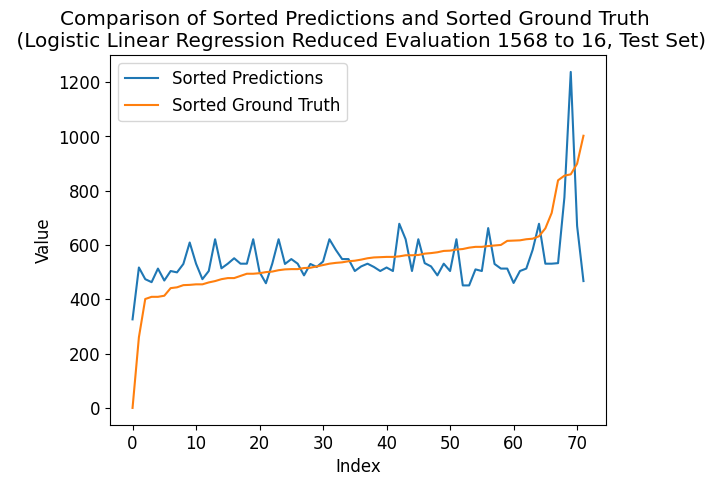

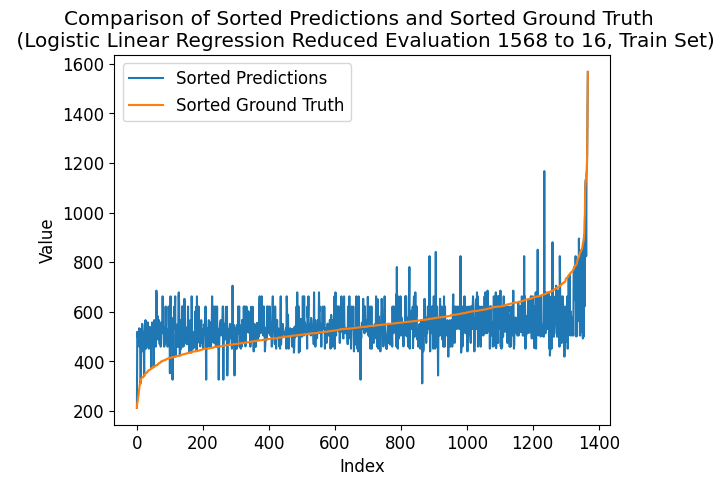

---- ---- ----
class_num = 1584
Number of unique elements: 417
[   0.   99.  198.  297.  396.  495.  594.  693.  792.  891.  990. 1089.
 1188. 1287. 1386. 1485. 1584.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.38532134184783023
Coefficient of determination (R-squared score, R2 score): -0.06069094304388423
train eval:
Mean squared error: 1.219298245614035
Correlation coefficient: 0.49697530607501067
Coefficient of determination (R-squared score, R2 score): 0.1448997128335271


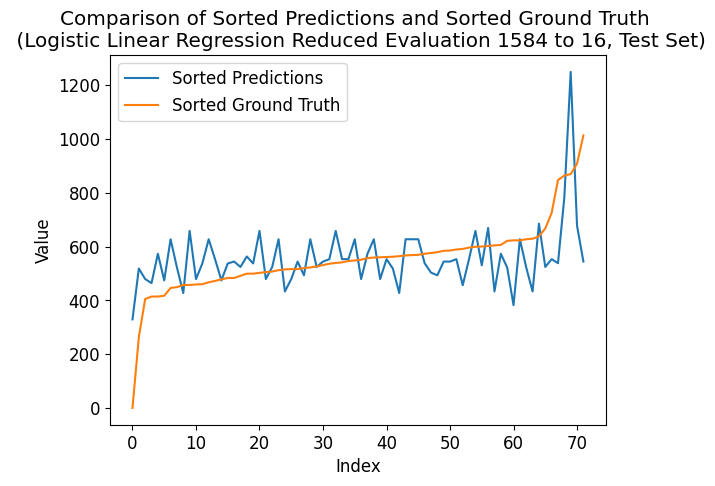

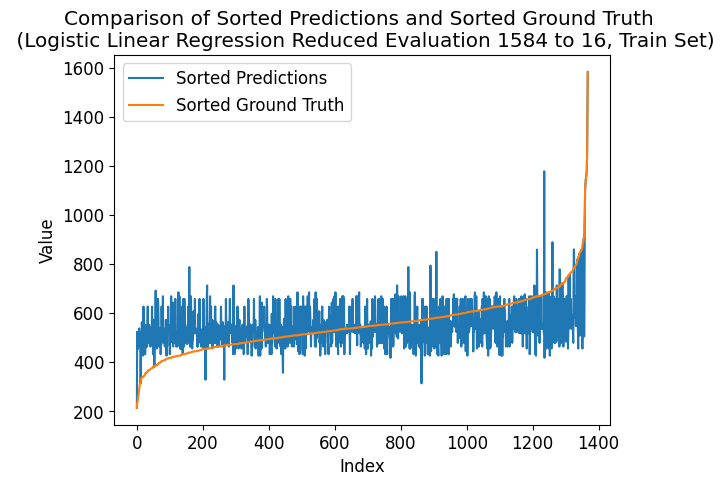

---- ---- ----
class_num = 1600
Number of unique elements: 415
[   0.  100.  200.  300.  400.  500.  600.  700.  800.  900. 1000. 1100.
 1200. 1300. 1400. 1500. 1600.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.39373061731266834
Coefficient of determination (R-squared score, R2 score): -0.03081232492997188
train eval:
Mean squared error: 1.2412280701754386
Correlation coefficient: 0.497512882424363
Coefficient of determination (R-squared score, R2 score): 0.12952021126578472


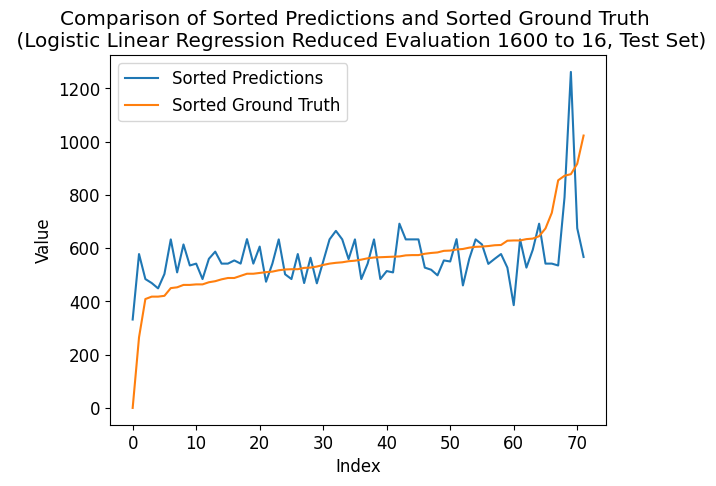

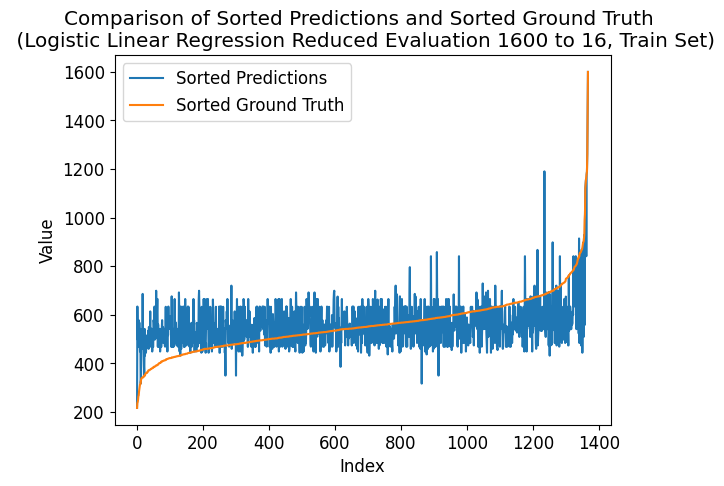

In [86]:
# independent data
x = group_satcked_green
# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max

print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

reduced_class_num = 16
class_num_array = np.arange(reduced_class_num, reduced_class_num * 100 + 1, reduced_class_num)
mse_test_list = []
correlation_test_list = []
r_squared_test_list = []
mse_train_list = []
correlation_train_list = []
r_squared_train_list = []

for class_num in class_num_array:
    print('---- ---- ----')
    print(f'class_num = {class_num}')

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)

    # Generate class_num+1 evenly spaced intervals
    intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
    # print(intervals)
    # Digitize the array to get the indices of the intervals
    y_train = np.digitize(y_train, intervals) - 1
    y_test = np.digitize(y_test, intervals) - 1

    # to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
    unique_elements = np.unique(y_train)
    # print("Unique elements:", unique_elements)
    print("Number of unique elements:", len(unique_elements))

    model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
    fit_result = model.fit(x_train, y_train)

    y_pred = model.predict(x_test)
    y_pred_ = model.predict(x_train)

    # Define the boundaries for digitization
    intervals = np.arange(0, class_num+1, class_num/16)
    print(intervals)

    y_train_digital = np.digitize(y_train, intervals) - 1
    y_test_digital = np.digitize(y_test, intervals) - 1
    y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
    y_pred_test_digital = np.digitize(y_pred, intervals) - 1
    # print(y_pred)
    # print(y_pred_test_digital)
    print("test eval:")
    mse = mean_squared_error(y_test_digital, y_pred_test_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_test_digital, y_pred_test_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_test_list.append(mse)
    correlation_test_list.append(correlation)
    r_squared_test_list.append(r_squared)

    print("train eval:")
    mse = mean_squared_error(y_train_digital, y_pred_train_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_train_digital, y_pred_train_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_train_list.append(mse)
    correlation_train_list.append(correlation)
    r_squared_train_list.append(r_squared)

    plot_comparison(y_test, y_pred, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Test Set')
    plot_comparison(y_train, y_pred_, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Train Set')



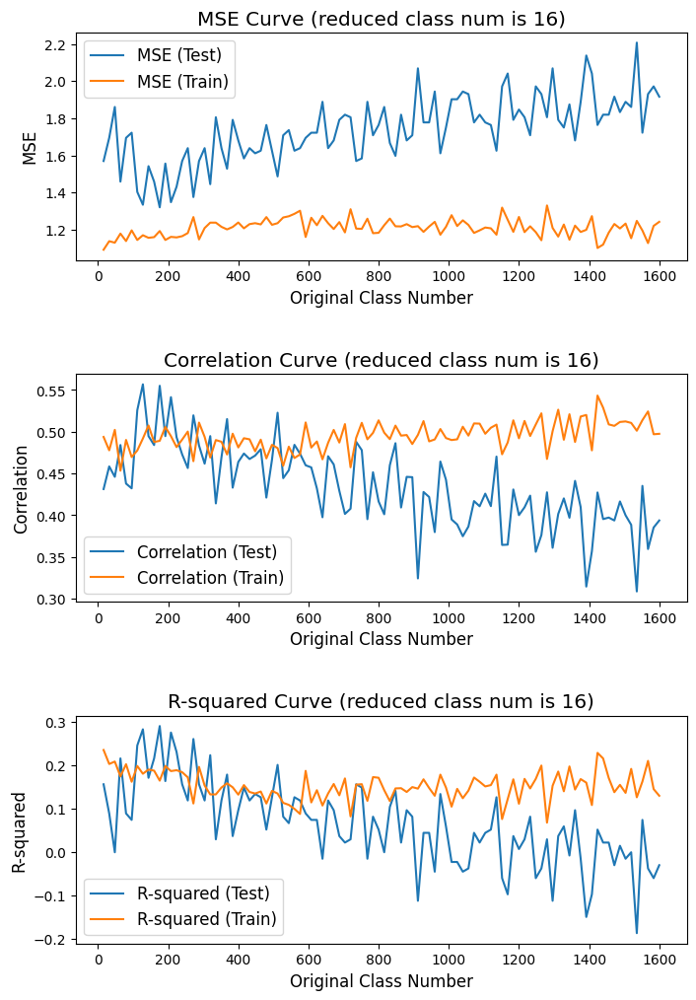

Max Index: 10
Max Original Class Num: 176


In [87]:
# plot the trend figures of mse, correlation, and r2

# Create a figure and subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 12))

# Plot MSE
ax1.plot(class_num_array, mse_test_list, label='MSE (Test)')
ax1.plot(class_num_array, mse_train_list, label='MSE (Train)')
ax1.set_ylabel('MSE')
ax1.set_xlabel('Original Class Number')
ax1.set_title(f'MSE Curve (reduced class num is {reduced_class_num})')
ax1.legend()

# Plot Correlation
ax2.plot(class_num_array, correlation_test_list, label='Correlation (Test)')
ax2.plot(class_num_array, correlation_train_list, label='Correlation (Train)')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Original Class Number')
ax2.set_title(f'Correlation Curve (reduced class num is {reduced_class_num})')
ax2.legend()

# Plot R-squared
ax3.plot(class_num_array, r_squared_test_list, label='R-squared (Test)')
ax3.plot(class_num_array, r_squared_train_list, label='R-squared (Train)')
ax3.set_ylabel('R-squared')
ax3.set_xlabel('Original Class Number')
ax3.set_title(f'R-squared Curve (reduced class num is {reduced_class_num})')
ax3.legend()

# Increase the vertical spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Adjust tick, label, title, and legend font sizes
plt.rcParams.update({'font.size': 12})
ax1.tick_params(labelsize=10)
ax2.tick_params(labelsize=10)
ax3.tick_params(labelsize=10)

# Save the figure
plt.savefig(f'mse_correlation_r2_trend_curve_reduced_eval_reduced_class_num_{reduced_class_num}.png', bbox_inches='tight')

# Show the figure
plt.show()

# Convert r_squared_test_list to a NumPy array
r_squared_test_array = np.array(r_squared_test_list)
# Find the index of the maximum value
max_index = np.argmax(r_squared_test_array)
# Get the corresponding class_num value
max_class_num = class_num_array[max_index]

# Print the index and corresponding class_num
print("Max Index:", max_index)
print("Max Original Class Num:", max_class_num)

In [93]:
# batch download the plotted figures
# uncomment the code below to download figures if needed

'''
import glob

folder_path = '.'
file_prefix = 'Comparison of Sorted Predictions and Sorted Ground Truth (Logistic Linear Regression Reduced Evaluation'
# file_prefix = 'Comparison of Sorted Predictions and Sorted Ground Truth'

# Use glob to find all files with the given prefix in the folder
matching_files = glob.glob(f"{folder_path}/{file_prefix}*")
# print(matching_files)
# # Print the matching file names
# for file_path in matching_files:
#     print(file_path)

import zipfile

zip_filename = 'files.zip'
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    # Add files to the zip file
    for file_path in matching_files:
        zipf.write(file_path)

from google.colab import files
files.download(zip_filename)
'''

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Fit and predict (balanced weights)

balanced weights don't improve the fitting, but make it worse.

In [89]:
# independent data
x = group_satcked_green

class_num = 48

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))

x_train shape: (1368, 14)
y_train shape: (1368,)
x_test shape: (72, 14)
y_test shape: (72,)
Unique elements: [ 6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 29 30
 33 34 35 37 42 47]
Number of unique elements: 30


In [90]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, class_weight='balanced', multi_class='multinomial')
fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)
# Print the predicted class labels
print(y_pred, y_test)
print(y_pred.shape, y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(30,) (30, 14)
[ 7  7 19  9  8 19 29 25 14 26 14 19 35 13 19 26 13 12 20  9 22 14 11 20
 14 37  9 25 29  8 18 25  8 12 21 10 19 26  8 19  9 10 26 26 24 11 14 13
  8 24 26 22 21 19 16 10 13 14 18 20 20 19 11  7  7  8 20  9  8 20 29 22] [15 18 16 12 15 13 19 18 16 18 16 15 26 17 18 15 12 17 25  0 17 17 15 13
 14 26 18 16 13 13 16 17 14 15 13 12 14 18 17 16 18 12 17 30 19 15 15 18
 15 27 14 17 17 16 17 15 15 14 16 17 21 14 16 17 15 19 13  7 20 17 16 18]
(72,) (72,)


#### Evaluate (balanced weights)

Accuracy: 0.027777777777777776
Confusion Matrix:
[[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 2 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 1 2 1 0 0 0 0 0 1 0 0 0]
 [0 0 1 0 0 0 0 0 2 0 0 0 0 2 0 0 0 0 0 1 0 0 0 0 0]
 [0 2 2 0 1 2 1 1 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 2 0 0 0 2 3 0 0 0 0 1 0 0 1 0 0 0]
 [0 1 1 0 0 0 1 1 1 0 1 0 0 0 2 1 2 0 1 1 0 0 0 0 0]
 [0 1 0 2 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 2 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

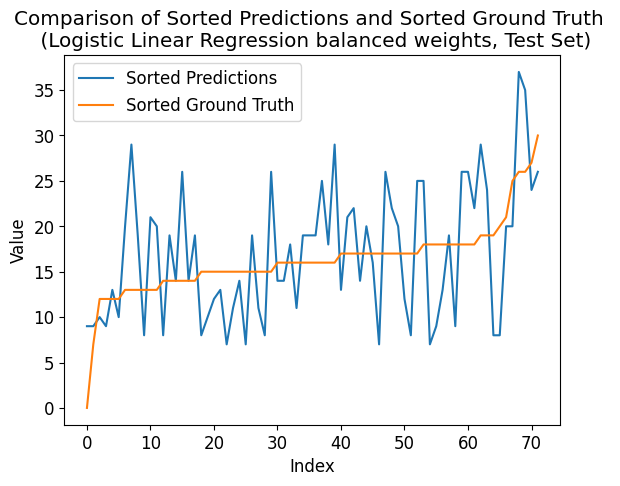

In [91]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_test, y_pred, 'Logistic Linear Regression balanced weights, Test Set')


Accuracy: 0.07309941520467836
Confusion Matrix:
[[ 1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
   0  0  0  0  0  0]
 [ 0  4  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
   0  0  0  0  0  0]
 [ 0  0  2  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
   0  0  0  0  0  0]
 [ 0  1  1  3  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
   0  0  0  0  0  0]
 [ 0  4  6  2  3  1  0  1  0  0  0  0  0  0  0  0  1  0  0  0  0  0  2  0
   0  0  0  0  0  0]
 [ 0  3  6  2  2  5  0  1  2  0  0  1  2  1  0  2  1  1  0  0  2  0  2  0
   0  0  0  0  0  0]
 [ 0  2 14  7  9  6  4  3  5  3  0  1  0  0  4  0  1  1  0  2  4  0  1  0
   0  0  0  0  0  0]
 [ 0  2 10 15 18  8  3  7  6  2  2  1  0  6  4  0  2  0  1  3  8  0  3  0
   0  0  0  0  0  0]
 [ 0  9 15 20 18 16  3  9 11  9  2  3  2  5  8  4  5  2  1  6  8  1  7  0
   0  0  0  0  0  0]
 [ 1  4 14 17 16 17  5  6 12 11  4  4  4  6 16  8 10  0  1  7 14  2  9  0
   0  0  0  0  0  0]
 [

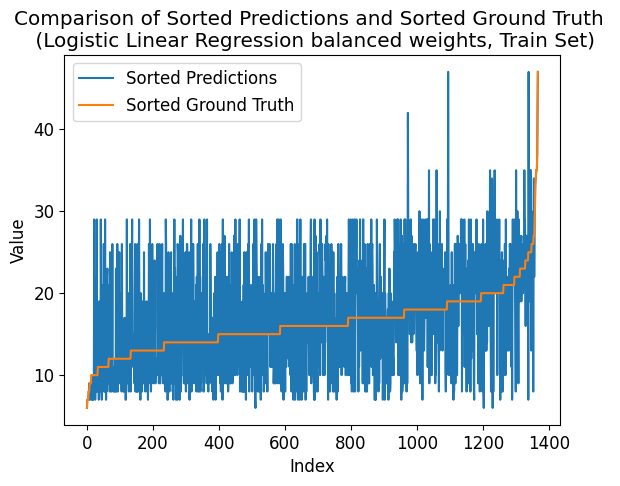

In [92]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

cm = confusion_matrix(y_train, y_pred_)
print("Confusion Matrix:")
print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_train, y_pred_, 'Logistic Linear Regression balanced weights, Train Set')
